In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Reproduce ETV Result for KIC 8043961

- also known as TIC 272609309

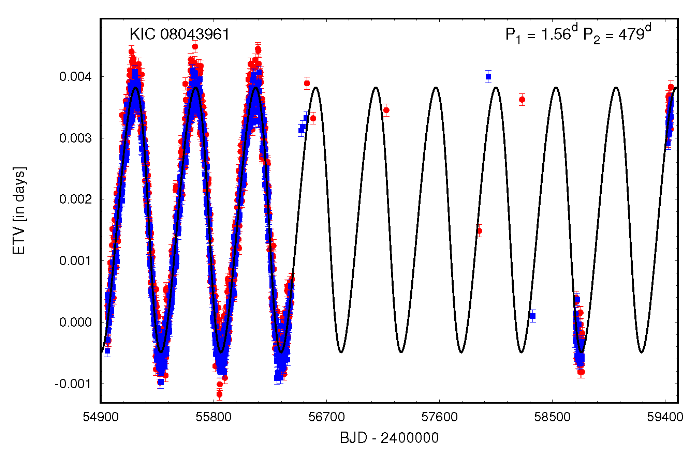

Source: `2022Galax..10....9B` [Eclipsing Binaries in Dynamically Interacting Close, Multiple Systems](https://ui.adsabs.harvard.edu/abs/2022Galax..10....9B/abstract), which is probably based on `2013ApJ...768...33R` [Triple-star Candidates among the Kepler Binaries](https://ui.adsabs.harvard.edu/abs/2013ApJ...768...33R/abstract) (similar O-C plot in figure 3)


In [5]:
# define the plotting parameters

figsize = (8,4)

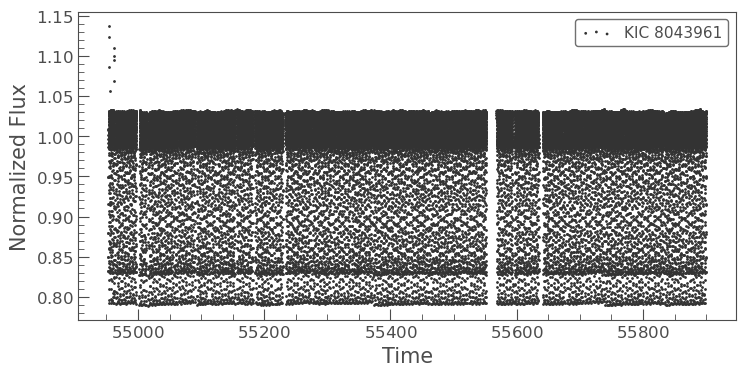

In [110]:
%matplotlib inline

kicid = 8043961

sr = lk.search_lightcurve('KIC{}'.format(kicid))
sr = sr[sr.exptime == 1800 * u.s]  # exclude 1 quarter that has both 30min and 1min cadence data
sr = lke._sort_chronologically(sr)

lcc_kplr = sr.download_all()
_lc = lcc_kplr[:].stitch()
_lc.time.format = "mjd"
_lc = _lc.truncate(None, 55900)  # about 2 cycles from the reference plot
_lc.scatter();
# _lc.fold(period=period).scatter();
# len(np.unique(sr.mission))

In [184]:
# import the data

# choose a TIC ID to analyze
ticid =  272609309  #  aka KIC 8043961, a multi star close EB sytem, with known ETV, amplitude of ~7.2min (0.005d) in Kepler data
kicid = 8043961
# reference: https://www.mdpi.com/2075-4434/10/1/9
# 
# TODO: consider to include Kepler data

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u


sr = lk.search_lightcurve('KIC{}'.format(kicid))
sr = sr[sr.exptime == 1800 * u.s]  # exclude 1 quarter that has both 30min and 1min cadence data
sr = lke._sort_chronologically(sr)
display(sr)
lcc_kplr = sr.download_all()
lc_kplr = lcc_kplr[:].stitch()
lc_kplr.time.format = "mjd"  # to be consistent with the paper result, also for ease of combining with TESS data
lc_kplr = lc_kplr.truncate(None, 55300)  # test with ~1 ETV cycle based on reference plot, # 553900 ~2ETV cycles

# sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
# sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (sector 5)
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
# sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
# display(sr)
# lc_tess = sr.download_all().stitch()
# lc_tess.time.format = "mjd"

search_result = lk.LightCurveCollection([
    lc_kplr,
    # lc_tess,
]).stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,Kepler Quarter 00,2009,Kepler,1800,kplr008043961,0.0,EX
1,Kepler Quarter 01,2009,Kepler,1800,kplr008043961,0.0,EX
2,Kepler Quarter 02,2009,Kepler,1800,kplr008043961,0.0,EX
3,Kepler Quarter 03,2009,Kepler,1800,kplr008043961,0.0,EX
4,Kepler Quarter 04,2010,Kepler,1800,kplr008043961,0.0,EX
5,Kepler Quarter 05,2010,Kepler,1800,kplr008043961,0.0,EX
6,Kepler Quarter 06,2010,Kepler,1800,kplr008043961,0.0,EX
7,Kepler Quarter 07,2010,Kepler,1800,kplr008043961,0.0,EX
8,Kepler Quarter 08,2011,Kepler,1800,kplr008043961,0.0,EX


15591

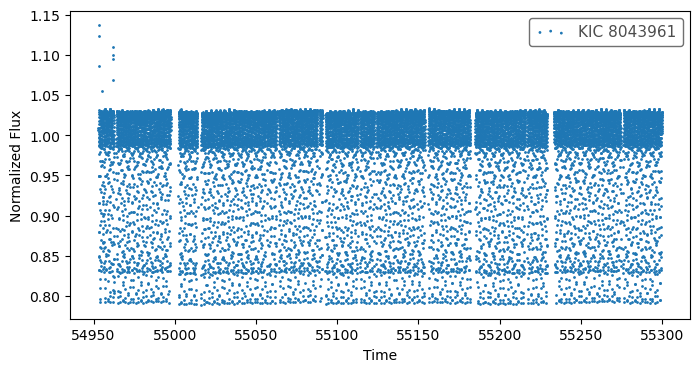

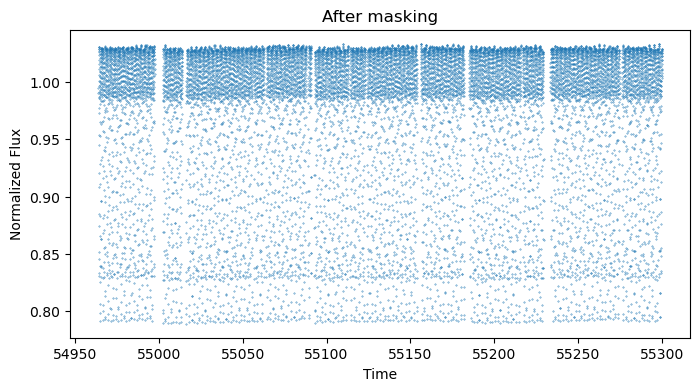

In [185]:
%matplotlib inline
# %matplotlib widget

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# t0 = 2337.376
# period_triple = 0.774

mask = (time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [8]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [7]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

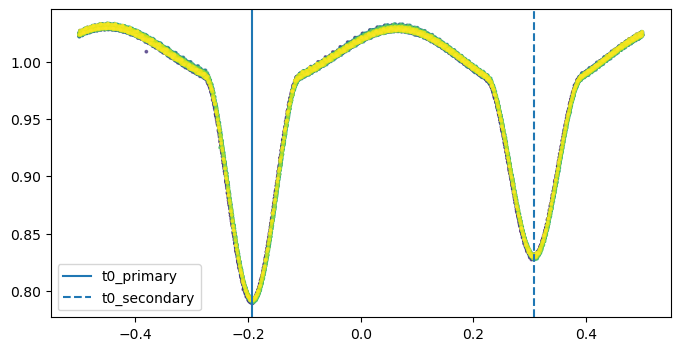

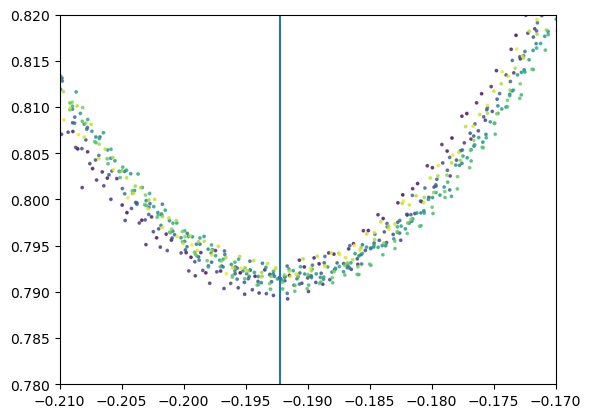

In [195]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# FILL-IN THE eclipse epoch / period, 
# caught both primary and secondary
# epoch=1683.4147, duration_hr=5.5736, period=0.779466, label="s0014-s0055:TCE1",
# Given it has known ETV, I used  1.5604812 (as the variation might confuse the period derived from a longer base line)
# VSX period: 1.559231 , based on Kepler EB 2nd release (2011), possibly a bit dated
# TESS EB period (S14,15): 1.5592013928014403
# period = np.mean([0.781250, 0.781250, 0.779620, 0.779623, 0.779460]) * 2  the mean of period of single sector TCEs,
# period = 1.559231  # VSX Period 
period = 1.559210  # 2013ApJ Period

# from TCE
# t0_primary = 1683.4147 + period /2
# t0_secondary = 1683.4147 

# from TESS EB
# the 0.004 offset is added after visual inspection of the folded data with the inital guess model, to center the eclipses
# t0_primary = 1684.1910518955988 - 0.004  # fits TESS data
# t0_secondary = 1684.1910518955988 - period / 2 - 0.004  # fits TESS data

# t0_primary = 1684.1910518955988  + period * 0.025   # the offset is applied by visual inspection to fit Kepler data for VSX Period
# t0_secondary = 1684.1910518955988 - period / 2 + period * 0.025

t0_primary = 1684.1910518955988 - 0.004  # fits Kepler data + 2013Apj Period
t0_secondary = 1684.1910518955988 - period / 2 - 0.004  # fits Kepler data + 2013Apj Period


# convert epoch from BTJD to commonly mjd used here
t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 5.5736  # used for the window to cut the lighcurve around eclipses in later cells
duration_hr_secondary = 5.5736

t0_for_plotting = 0  # keep 0 for plotting purposes
# t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(-0.21, -0.17);
plt.ylim(0.78, 0.82);
plt.show()

### Now that the data is ready we can start 

In [196]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,54964.011967,0.995139,0.000030,0.192570
1,54964.032401,0.990637,0.000030,0.205675
2,54964.052836,0.986264,0.000029,0.218781
3,54964.073270,0.977608,0.000029,0.231887
4,54964.093705,0.953602,0.000029,0.244992
...,...,...,...,...
15090,55299.897983,1.019370,0.000030,-0.386790
15091,55299.918417,1.015747,0.000030,-0.373685
15092,55299.938852,1.011667,0.000030,-0.360579
15093,55299.959286,1.007374,0.000030,-0.347473


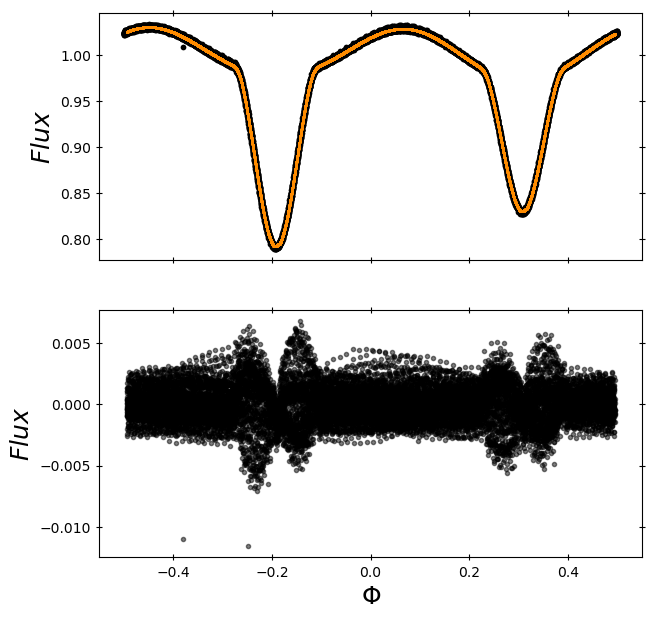

,time,flux,err,phase,flux_sub_binary,binary_model
0,54964.011967,0.995139,0.000030,0.192570,-0.001933,0.997072
1,54964.032401,0.990637,0.000030,0.205675,-0.001644,0.992281
2,54964.052836,0.986264,0.000029,0.218781,-0.001538,0.987802
3,54964.073270,0.977608,0.000029,0.231887,-0.002051,0.979659
4,54964.093705,0.953602,0.000029,0.244992,-0.003811,0.957413
...,...,...,...,...,...,...
15090,55299.897983,1.019370,0.000030,-0.386790,-0.001999,1.021369
15091,55299.918417,1.015747,0.000030,-0.373685,-0.002019,1.017766
15092,55299.938852,1.011667,0.000030,-0.360579,-0.002184,1.013851
15093,55299.959286,1.007374,0.000030,-0.347473,-0.002311,1.009686


In [197]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 14940 901
reached the end
10 14696 901
reached the end
10 14666 901
reached the end
10 14663 901
reached the end
10 14660 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,54964.011967,0.995139,0.000030,0.192570,-0.001933,0.997072,0.997226
1,54964.032401,0.990637,0.000030,0.205675,-0.001644,0.992281,0.992704
2,54964.052836,0.986264,0.000029,0.218781,-0.001538,0.987802,0.988312
3,54964.073270,0.977608,0.000029,0.231887,-0.002051,0.979659,0.979635
4,54964.093705,0.953602,0.000029,0.244992,-0.003811,0.957413,0.955608
...,...,...,...,...,...,...,...
15090,55299.897983,1.019370,0.000030,-0.386790,-0.001999,1.021369,1.021287
15091,55299.918417,1.015747,0.000030,-0.373685,-0.002019,1.017766,1.017674
15092,55299.938852,1.011667,0.000030,-0.360579,-0.002184,1.013851,1.013603
15093,55299.959286,1.007374,0.000030,-0.347473,-0.002311,1.009686,1.009318


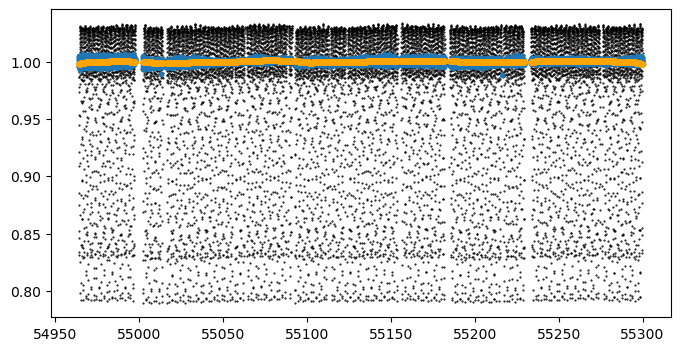

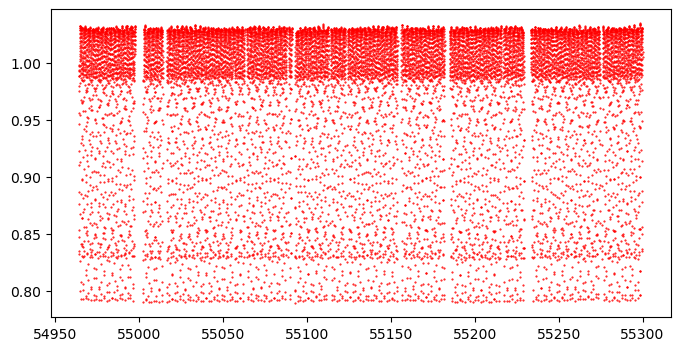

In [198]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

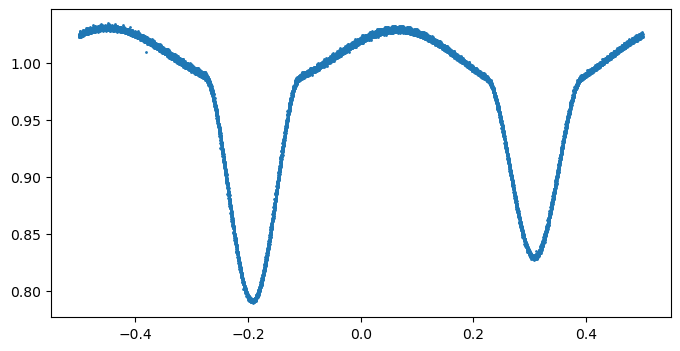

In [199]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

Primary:   54964.9712018956 -0.1922243343776074
window_width_p (phase): 0.095
Secondary: 54964.1915968956 0.30777566562490577
window_width_s (phase): 0.095


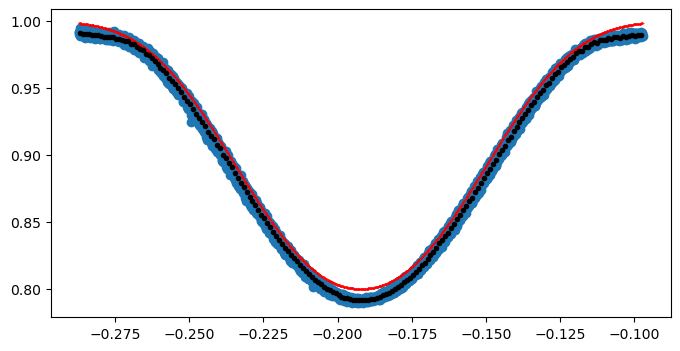

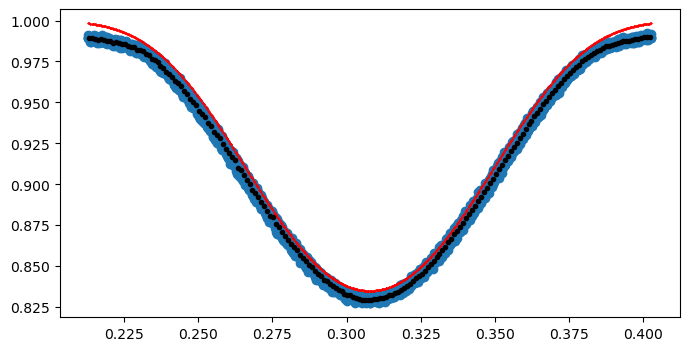

In [200]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
# window_width_p = 1.2 * duration_hr_primary / 24 / period
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p) & (data['phase'] < midpoint_p + window_width_p) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)
    
    # window_width_s = 1.2 * duration_hr_secondary / 24 / period
    window_width_s = 0.095
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s) & (data['phase'] < midpoint_s + window_width_s) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1, -0.20, midpoint_p, 0.0387, 1.063]
start_vals_s = [1, -0.165, midpoint_s, 0.0394, 1.017]
    
# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

100%|██████████████████████████████████████████████████████████| 1000/1000 [02:51<00:00,  5.85it/s]


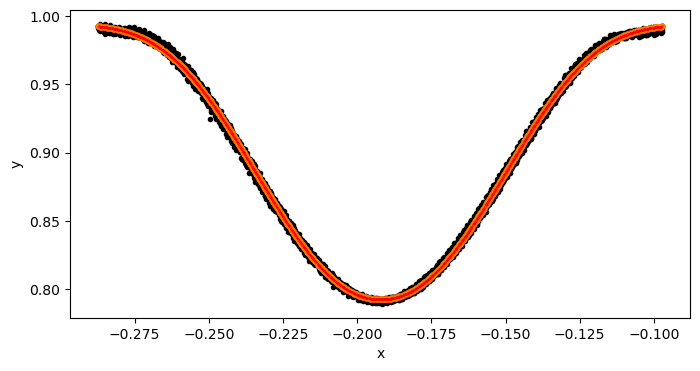

100%|██████████████████████████████████████████████████████████| 1000/1000 [02:57<00:00,  5.64it/s]


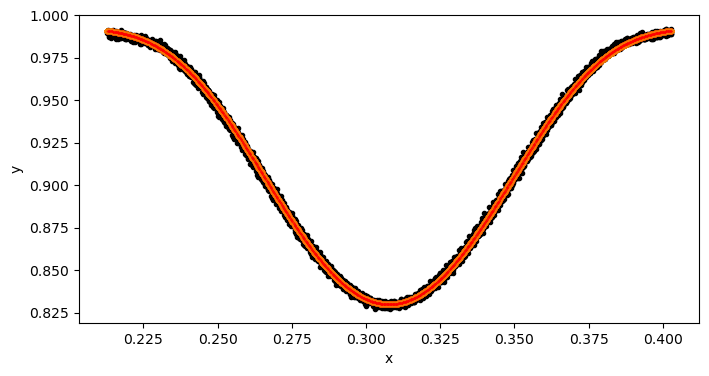

In [201]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = True

if run_init_fit:
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [203]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed

    # initial fit params from Kepler data (2 ETV cycles) + VSX Period
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 0.9941370201988319, -0.20127319673925692, 0.3289392856563206, 0.038710201064129375, 1.055302318011405
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s =  0.992638768157505, -0.16238346026701805, -0.17125340065746109, 0.039516264898283186, 1.0074853024803954

    # TODO: initial fit params from Kepler data (1 ETV cycles) + 2013Apj Period
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 0.9941936579424828, -0.20175775108936497, -0.19210856727520179, 0.03864675722489779, 1.0555246906828057
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9926195344277585, -0.16264266399832372, 0.30771509622178456, 0.03943563619781758, 1.0081195241744432

    print("Use pre-defined inital model params:")
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 0.9941370201988319, -0.20127319673925692, 0.3289392856563206, 0.038710201064129375, 1.055302318011405
    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s =  0.992638768157505, -0.16238346026701805, -0.17125340065746109, 0.039516264898283186, 1.0074853024803954
        etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [204]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 0.9941936579424828, -0.20175775108936497, -0.19210856727520179, 0.03864675722489779, 1.0555246906828057
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9926195344277585, -0.16264266399832372, 0.30771509622178456, 0.03943563619781758, 1.0081195241744432


214

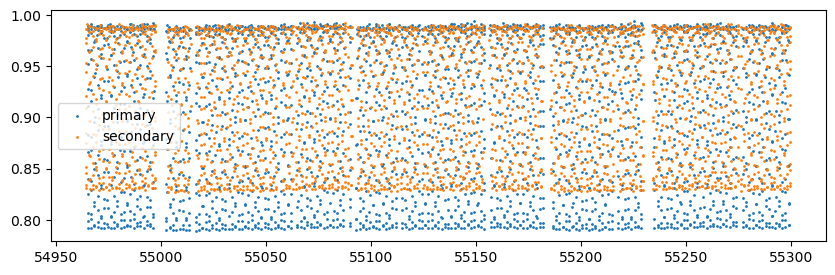

In [205]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

54964.9712018956 1.55921 54964.9712018956


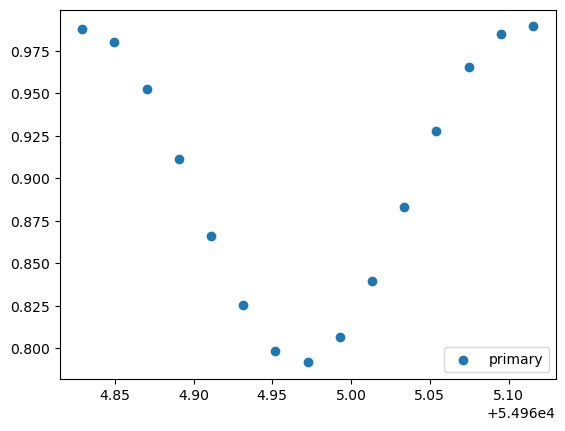

54964.9712018956 1.55921 54966.5304118956


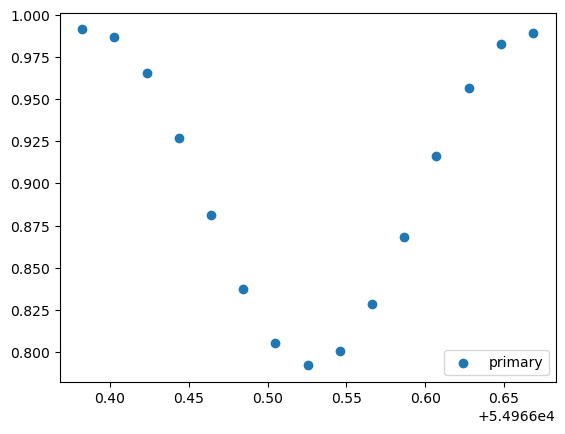

54964.9712018956 1.55921 54968.0896218956


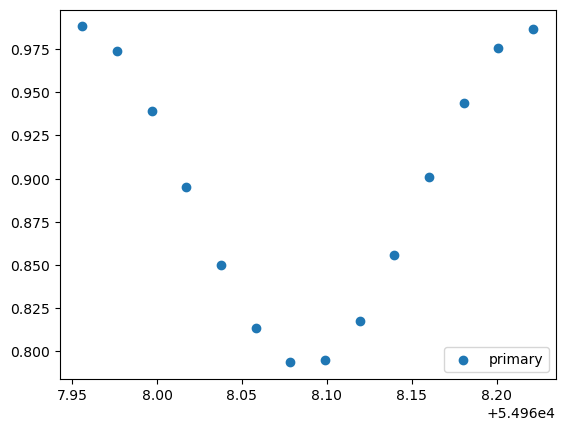

54964.1915968956 1.55921 54964.1915968956


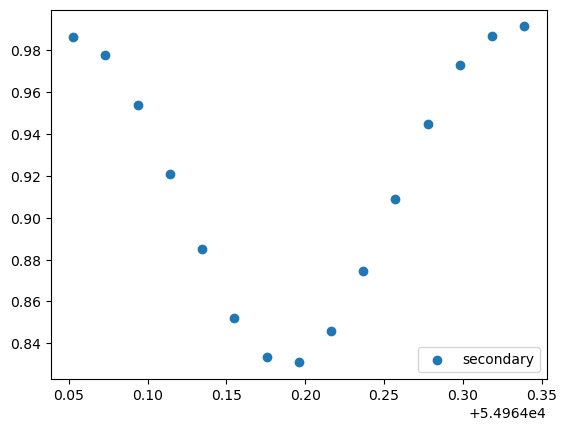

54964.1915968956 1.55921 54965.7508068956


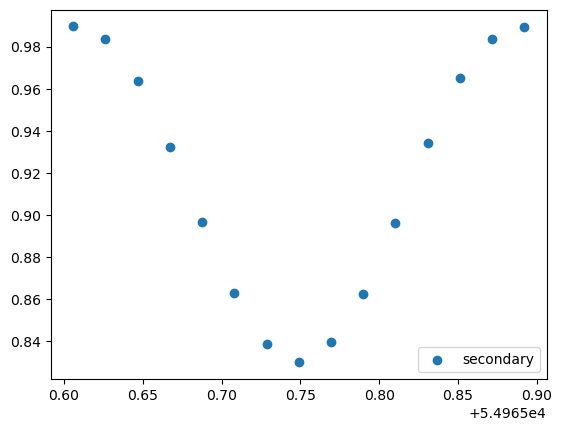

54964.1915968956 1.55921 54967.3100168956


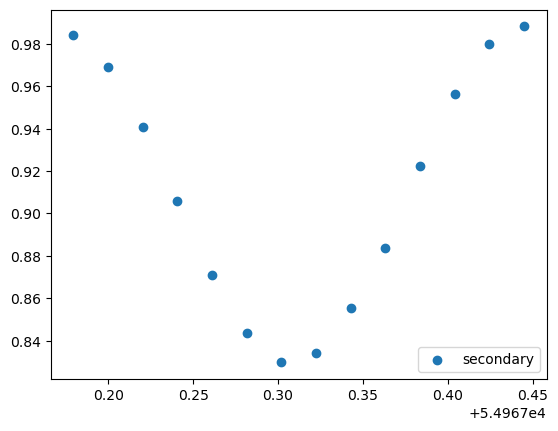

In [206]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Creating new manifest file
54964.9712018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 478.74it/s]


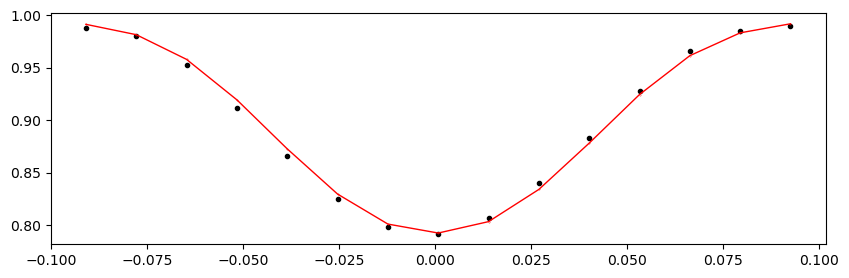

54966.5304118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 457.25it/s]


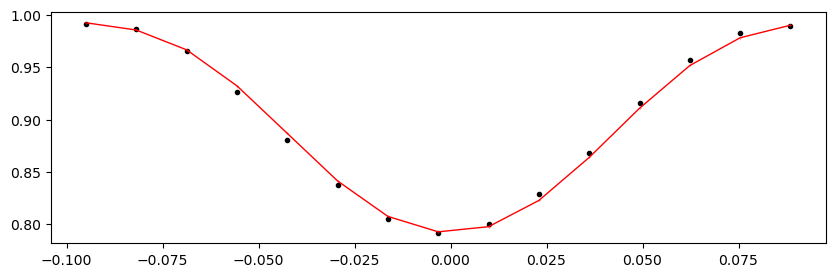

54968.0896218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 476.35it/s]


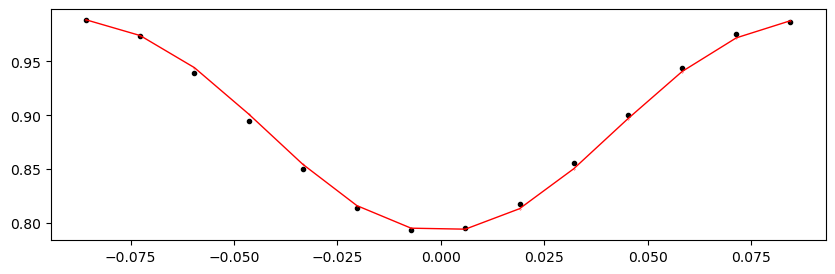

54969.648831895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 467.57it/s]


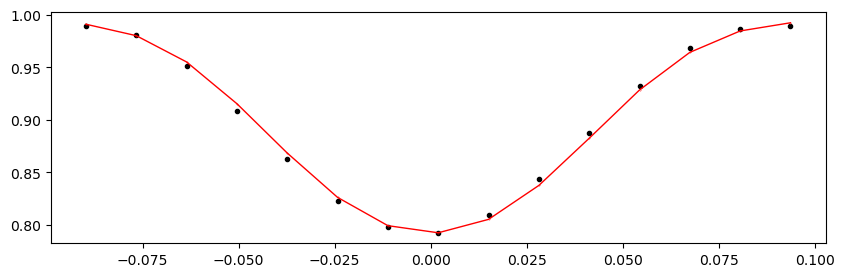

54971.208041895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 489.12it/s]


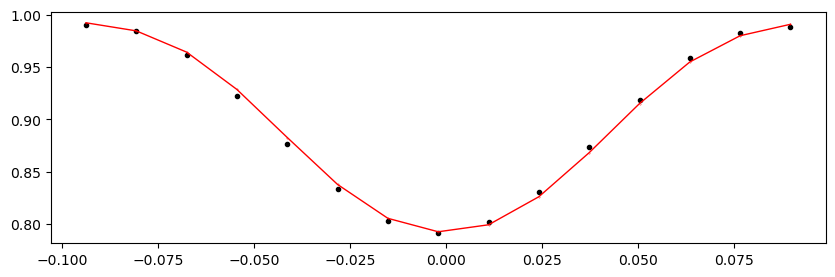

54972.767251895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 472.90it/s]


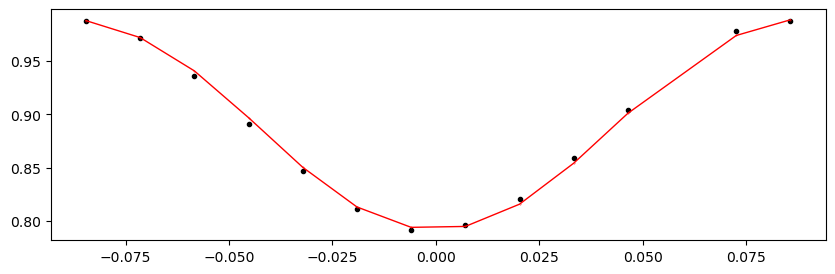

54974.326461895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 460.13it/s]


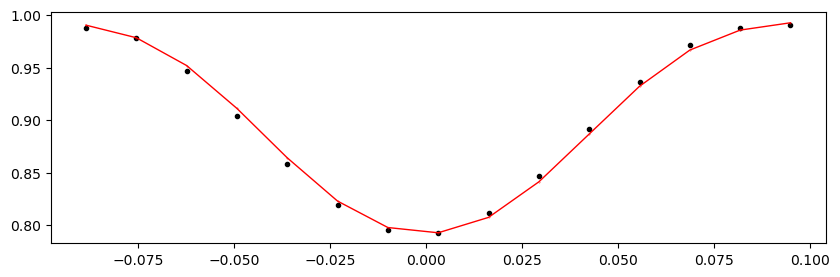

54975.8856718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 528.27it/s]


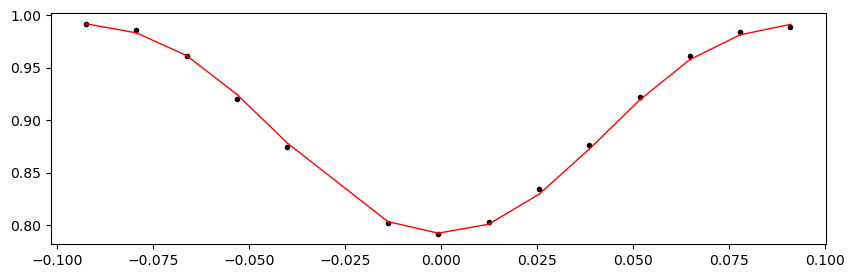

54977.4448818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:19<00:00, 511.23it/s]


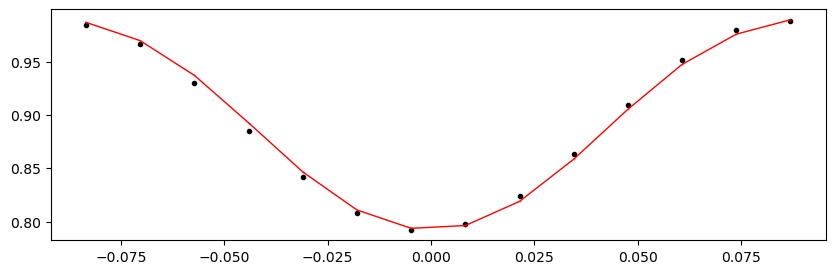

54979.0040918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 499.82it/s]


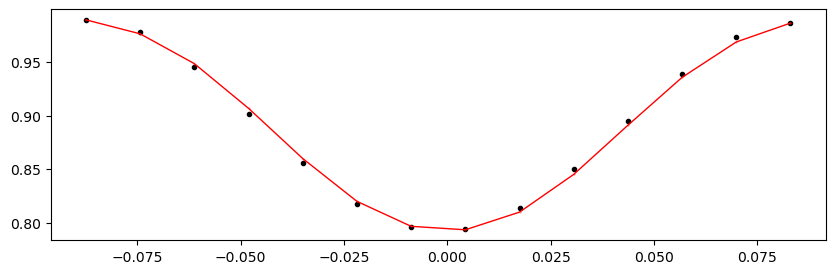

54980.5633018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 473.83it/s]


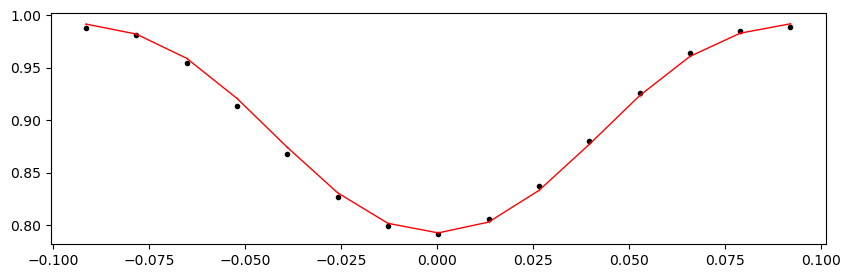

54982.1225118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 477.03it/s]


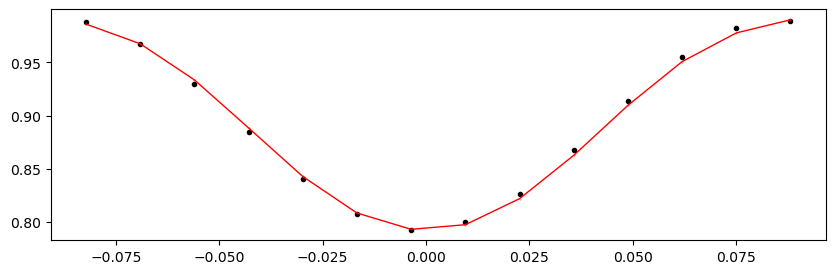

54983.6817218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 496.73it/s]


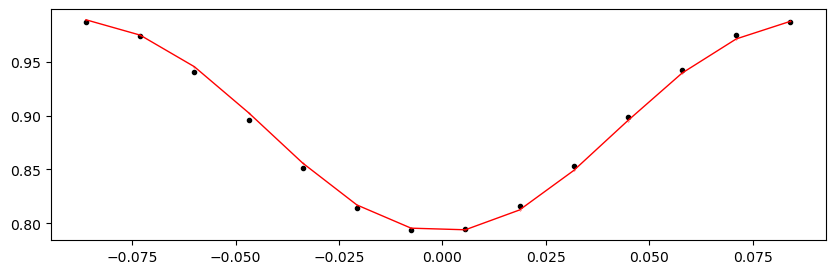

54985.2409318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 494.00it/s]


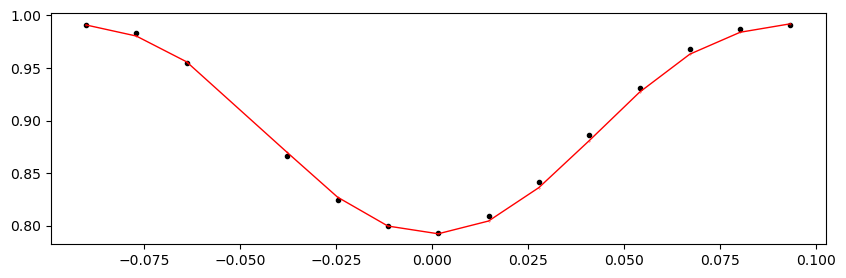

54986.8001418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 474.66it/s]


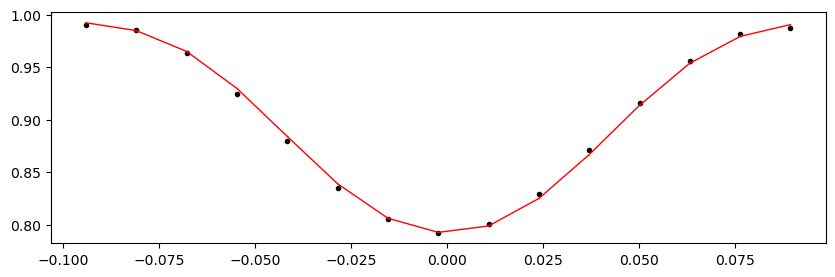

54988.3593518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:19<00:00, 512.01it/s]


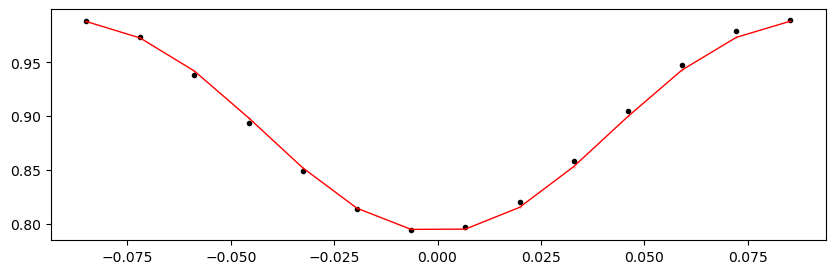

54989.918561895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:17<00:00, 574.84it/s]


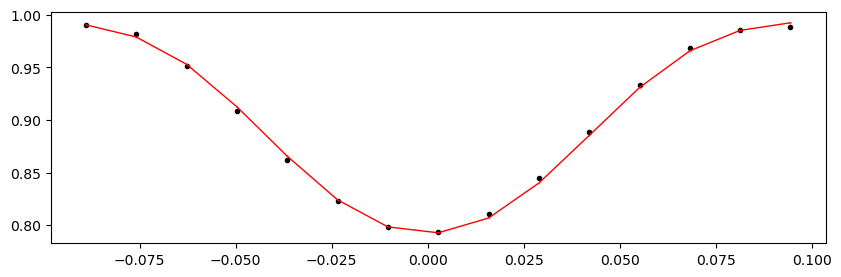

54991.477771895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 527.90it/s]


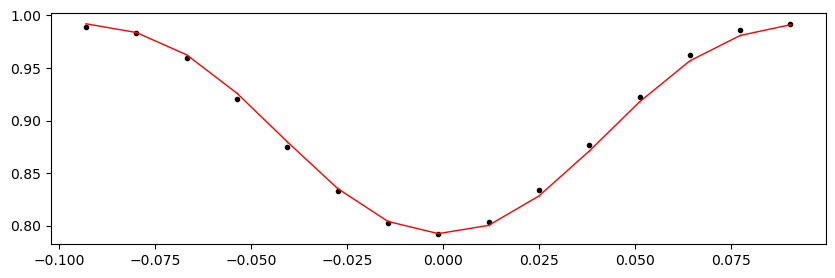

54993.036981895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 499.94it/s]


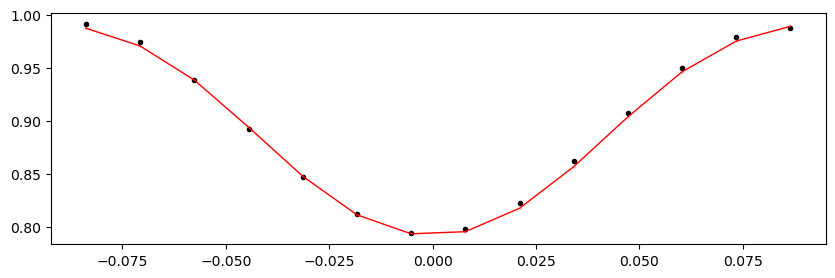

54994.596191895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 449.82it/s]


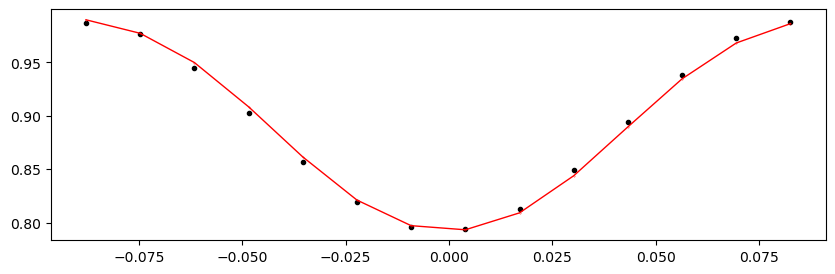

54996.1554018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 449.10it/s]


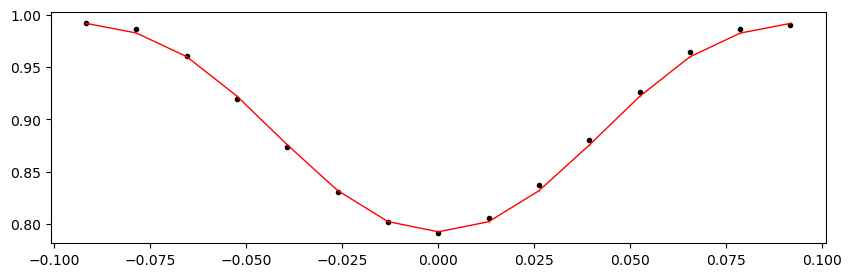

55002.3922418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 493.00it/s]


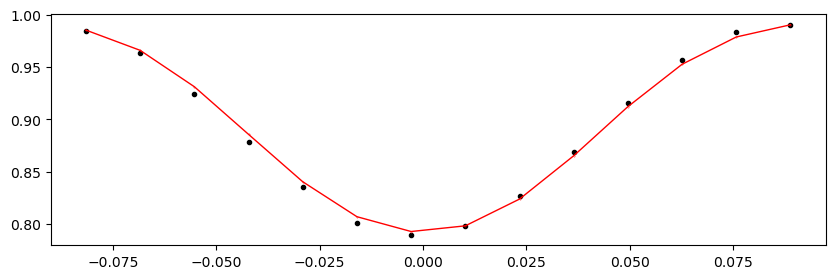

55003.9514518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 472.15it/s]


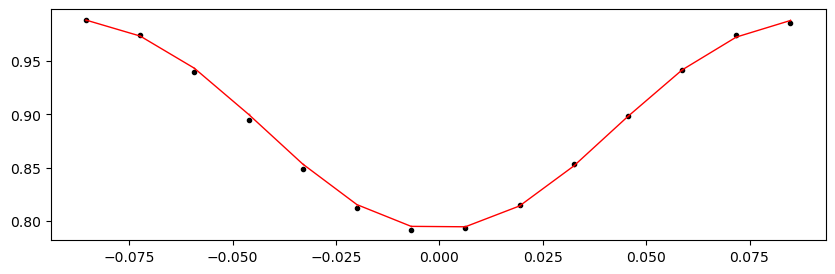

55005.5106618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:19<00:00, 510.75it/s]


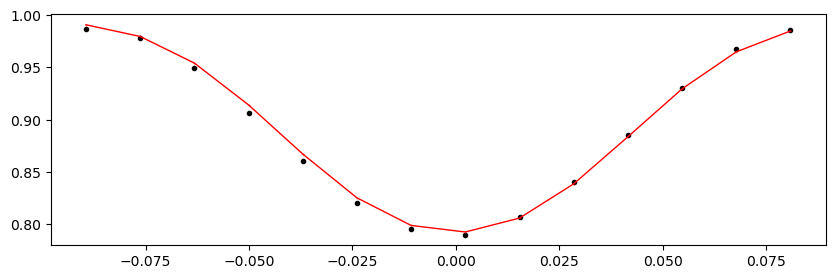

55007.0698718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 468.33it/s]


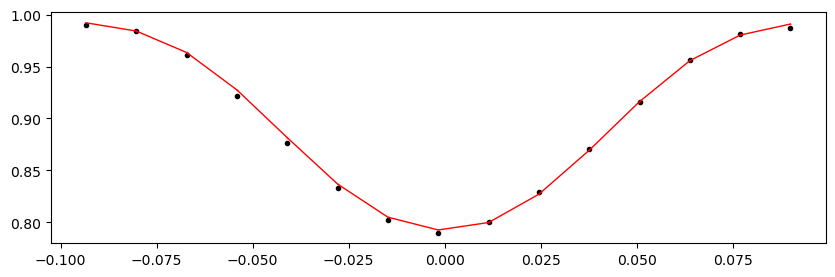

55008.6290818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 474.91it/s]


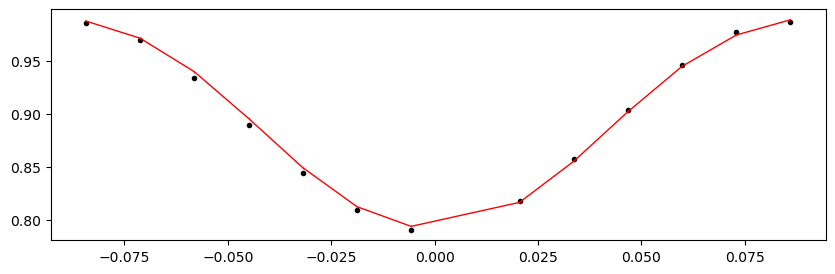

55010.188291895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 479.33it/s]


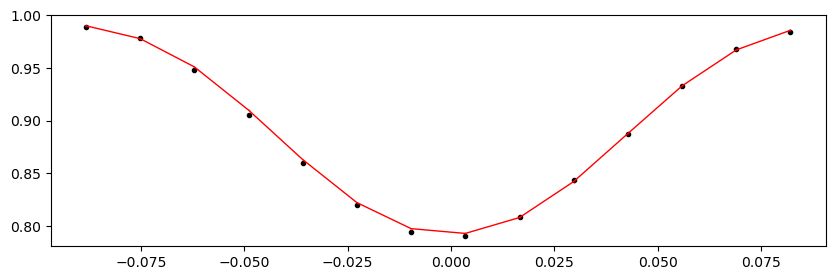

55011.747501895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 476.10it/s]


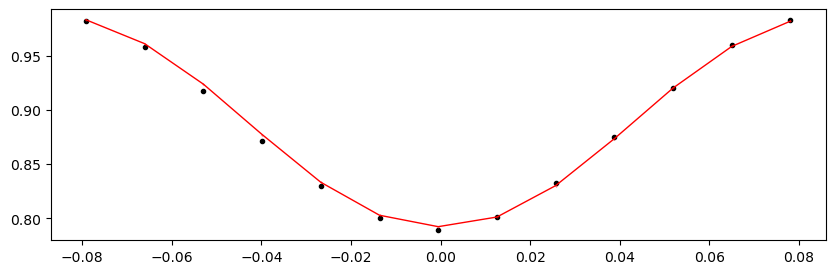

55013.306711895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 477.66it/s]


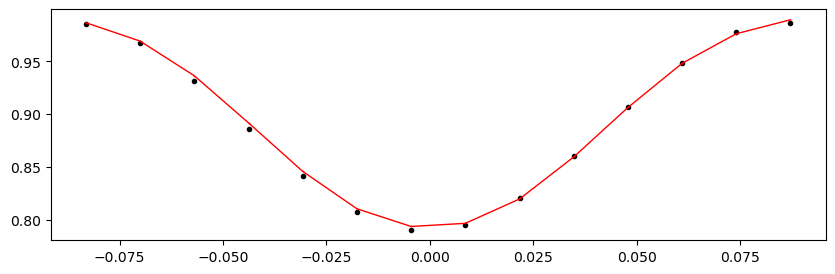

55016.4251318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 461.33it/s]


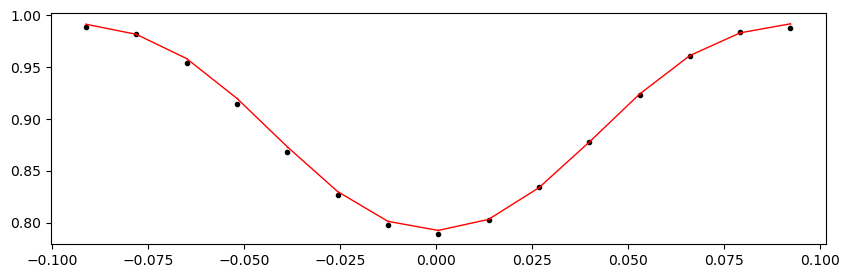

55017.9843418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 462.84it/s]


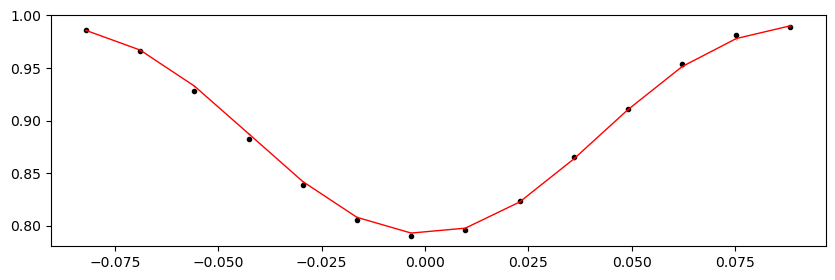

55019.5435518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 450.13it/s]


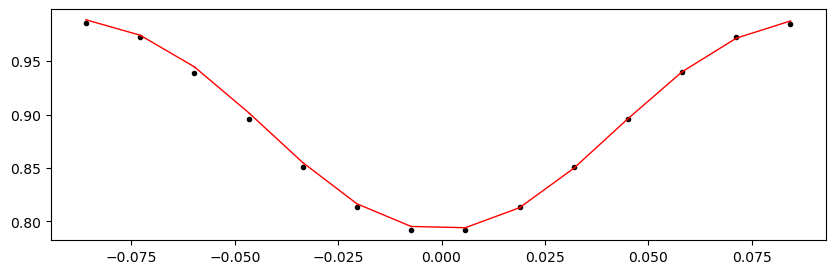

55021.1027618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.75it/s]


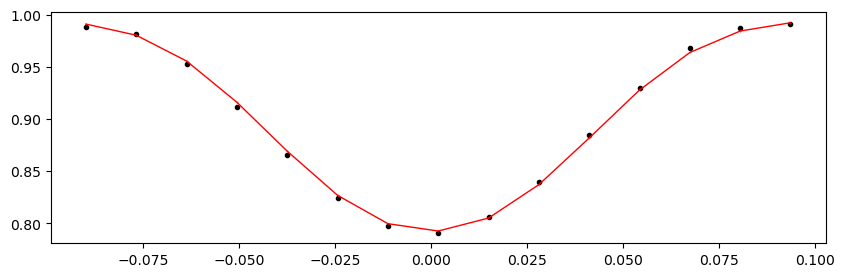

55022.6619718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 451.58it/s]


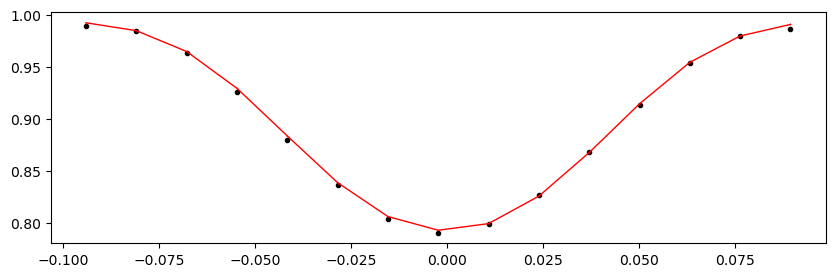

55024.2211818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 448.78it/s]


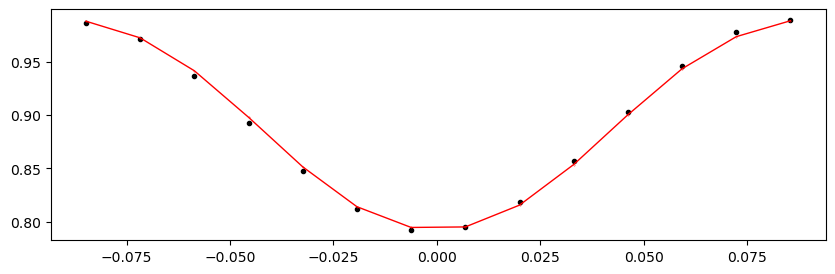

55025.7803918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 457.36it/s]


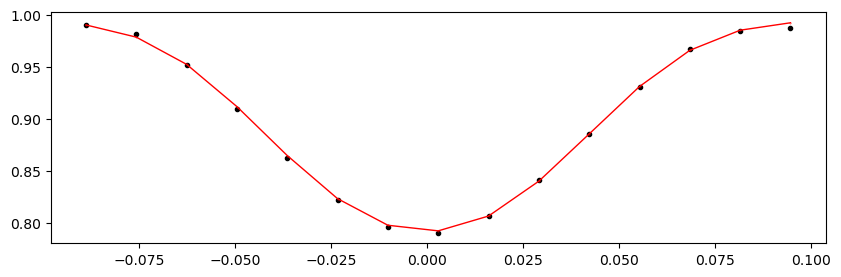

55027.3396018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 483.74it/s]


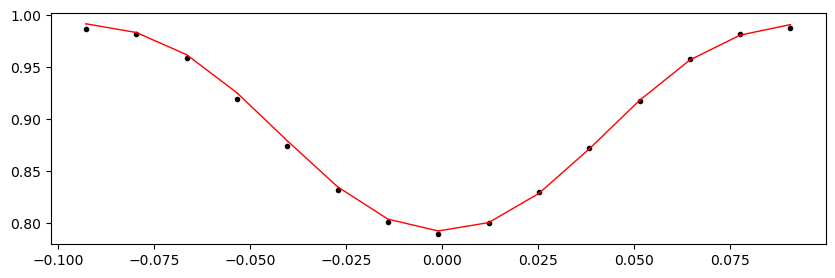

55028.8988118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|███████████████████████████████████████████████████████| 10000/10000 [00:12<00:00, 815.43it/s]


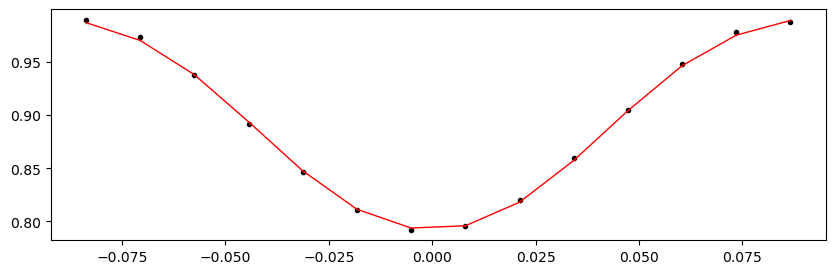

55030.458021895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1083.08it/s]


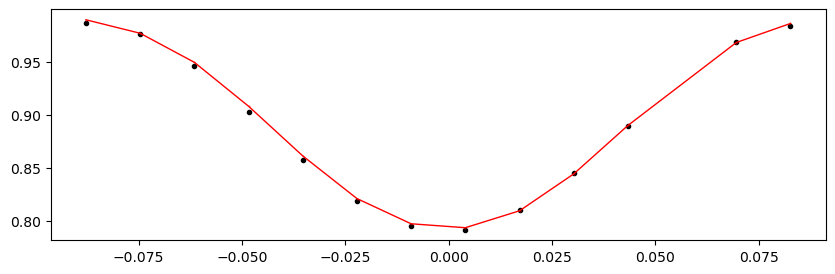

55032.017231895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1304.29it/s]


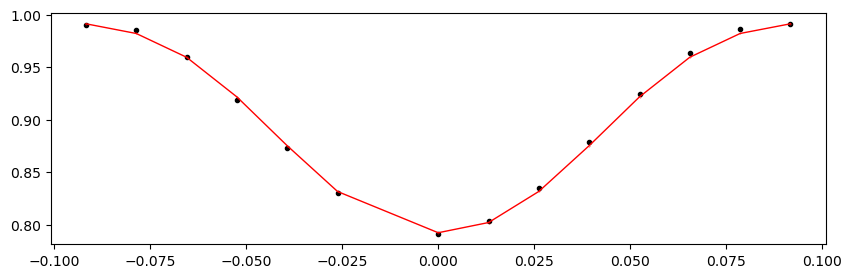

55033.576441895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1323.35it/s]


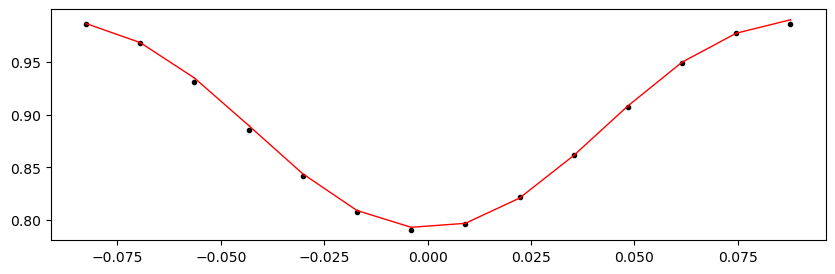

55035.135651895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.08it/s]


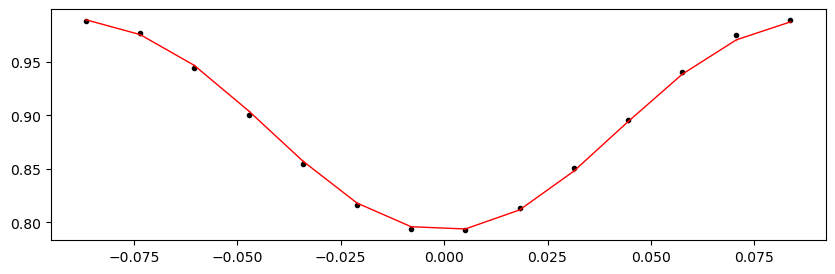

55036.6948618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.98it/s]


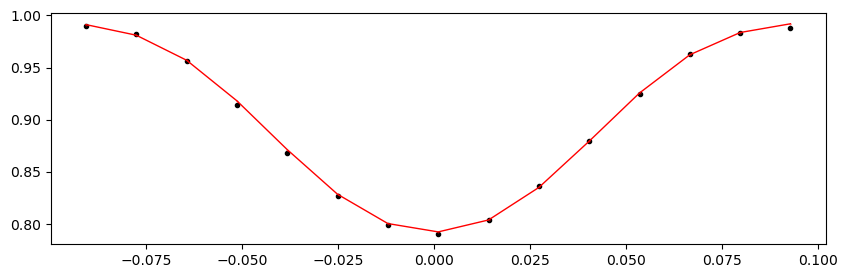

55038.2540718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.06it/s]


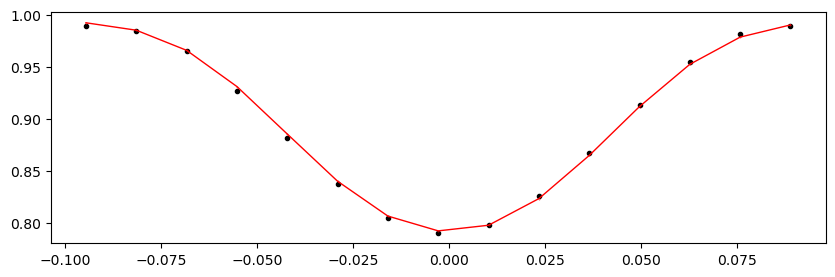

55039.8132818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.74it/s]


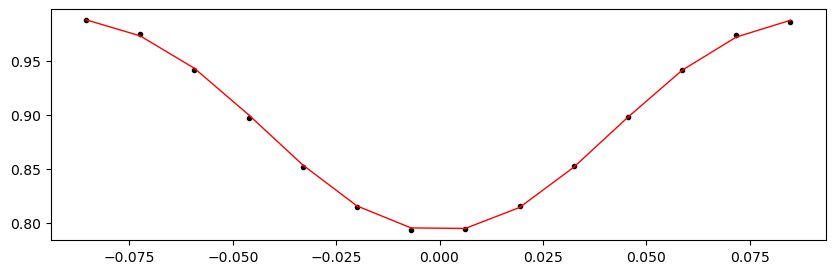

55041.3724918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.81it/s]


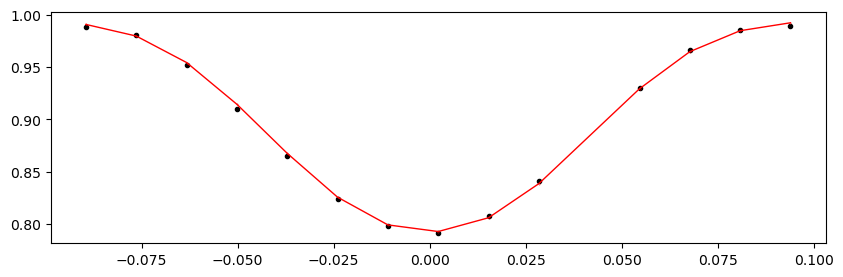

55042.9317018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.12it/s]


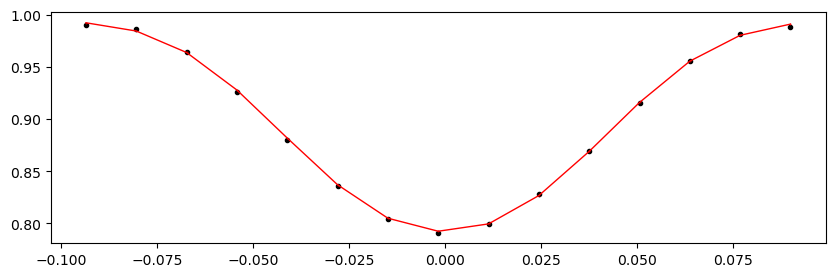

55044.4909118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.27it/s]


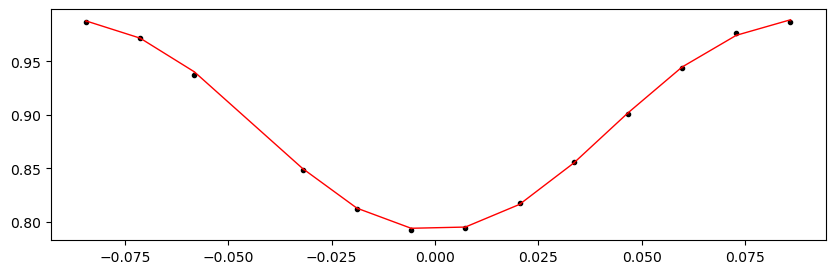

55046.0501218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1165.99it/s]


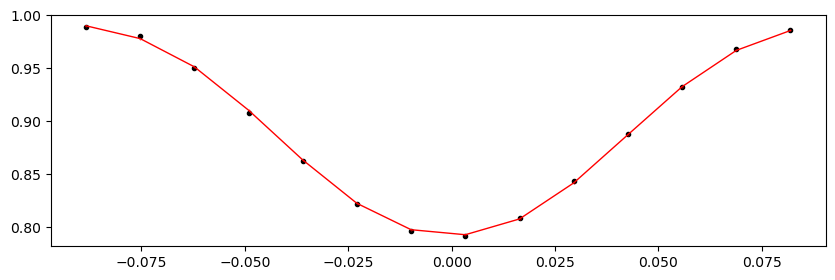

55047.6093318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1051.71it/s]


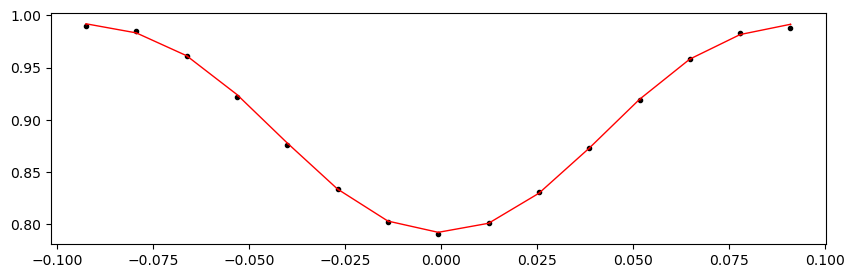

55049.1685418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1229.05it/s]


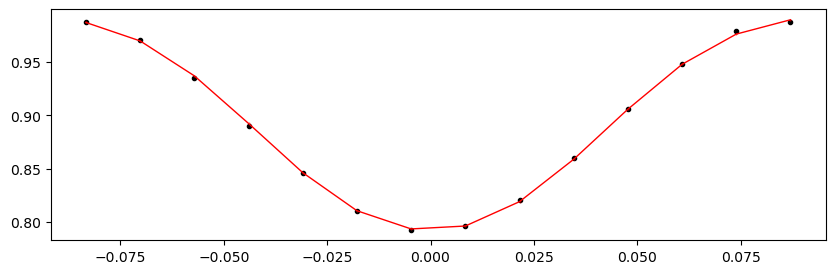

55050.727751895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.41it/s]


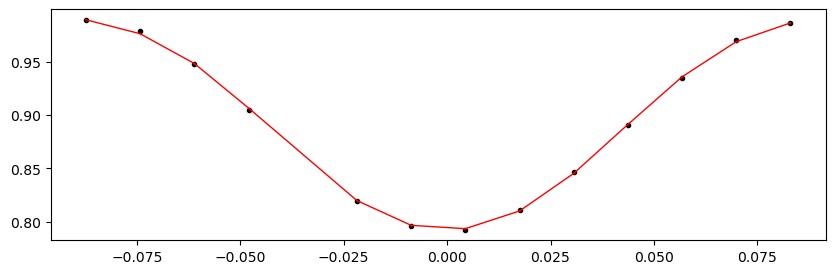

55052.286961895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.55it/s]


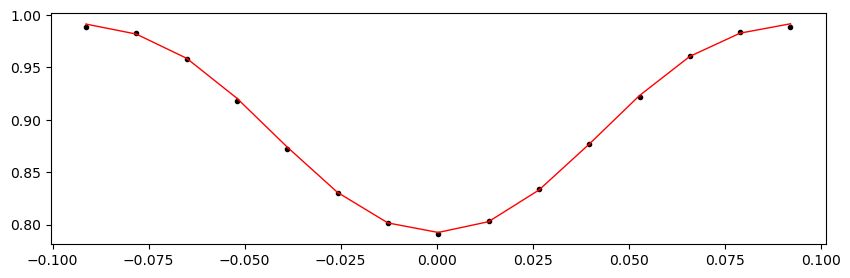

55053.846171895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.33it/s]


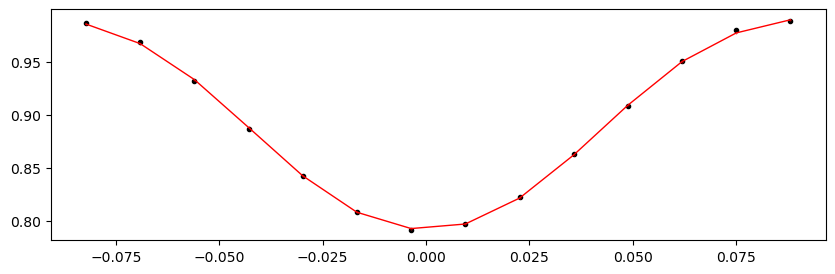

55055.405381895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.11it/s]


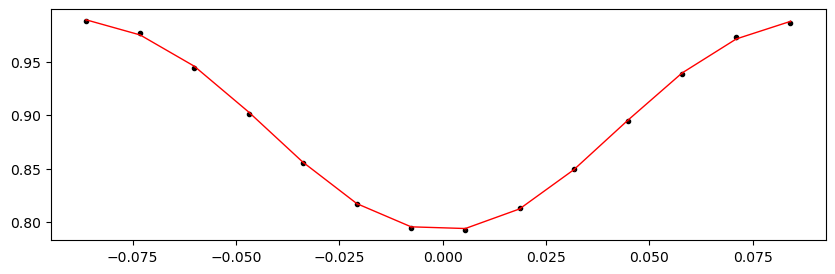

55056.9645918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.72it/s]


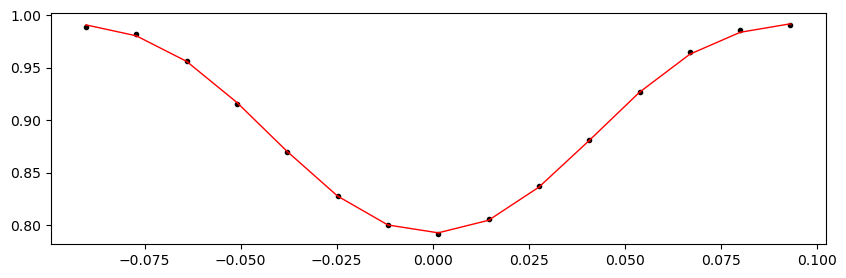

55058.5238018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1329.24it/s]


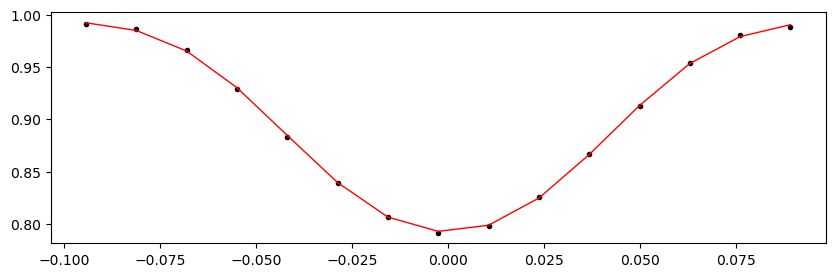

55060.0830118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1309.68it/s]


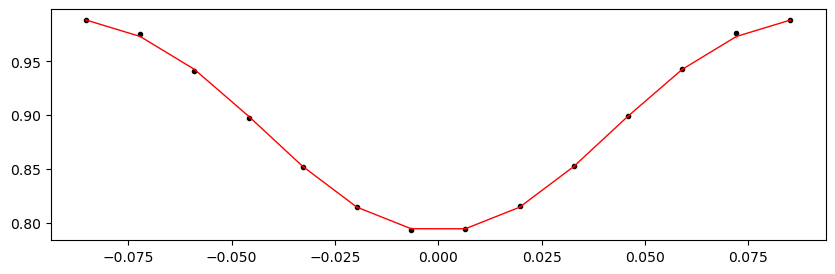

55061.6422218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1318.09it/s]


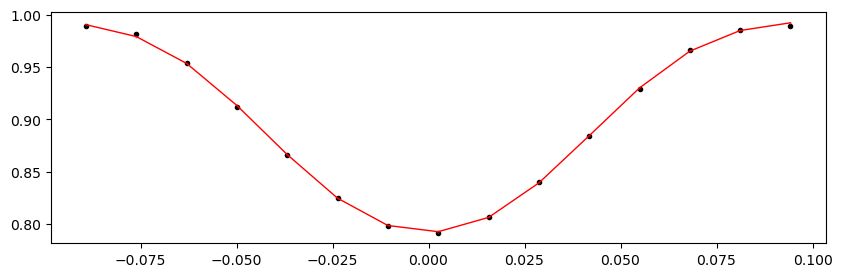

55064.7606418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.99it/s]


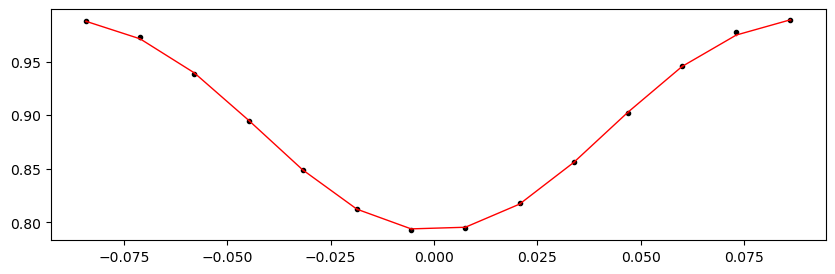

55066.3198518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1281.02it/s]


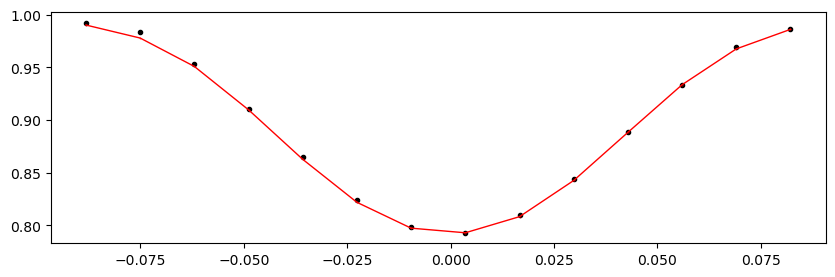

55067.8790618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1320.60it/s]


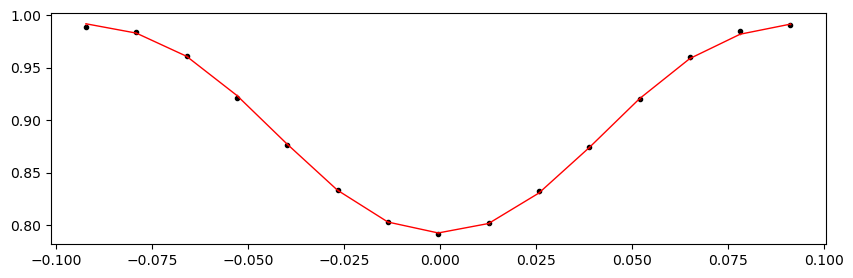

55069.4382718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.04it/s]


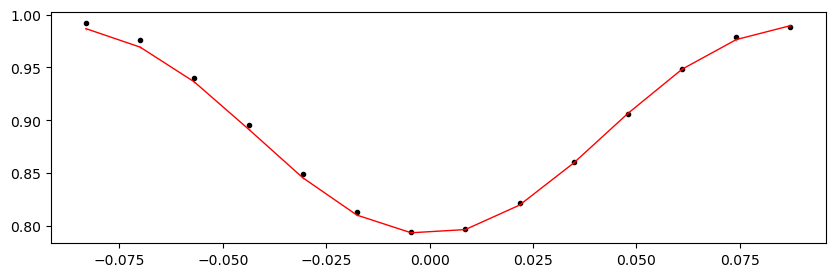

55070.997481895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1257.30it/s]


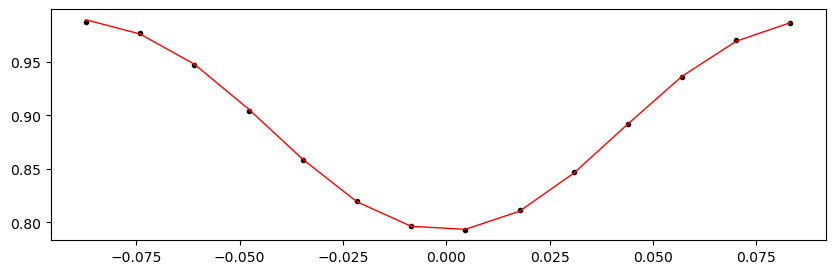

55072.556691895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1260.30it/s]


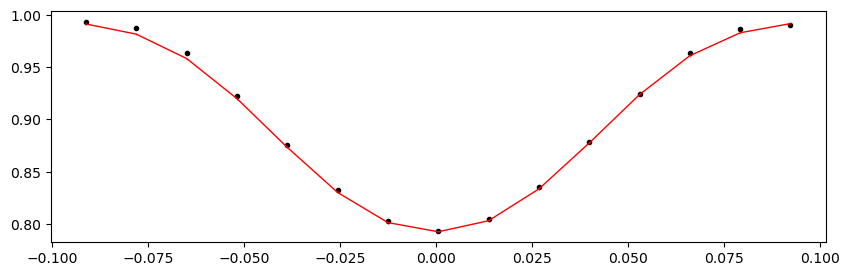

55074.115901895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1272.44it/s]


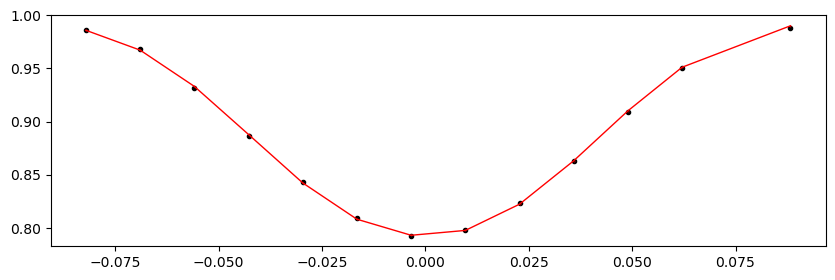

55075.675111895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1244.26it/s]


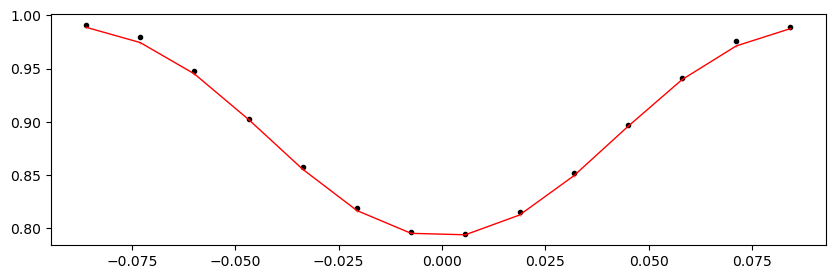

55077.2343218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1262.63it/s]


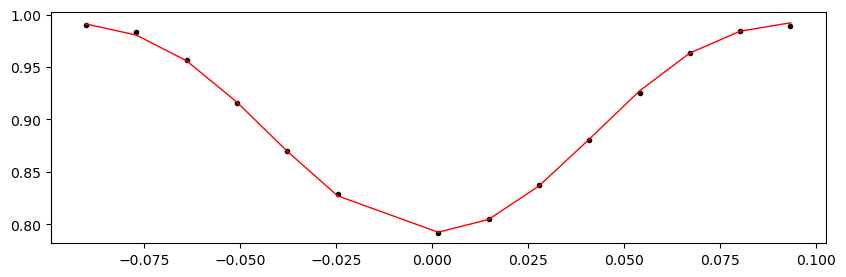

55078.7935318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.06it/s]


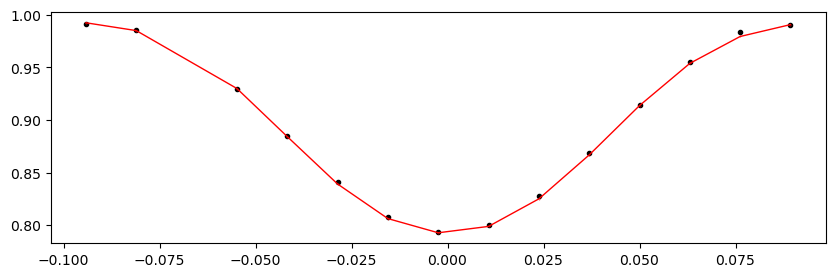

55081.9119518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1272.35it/s]


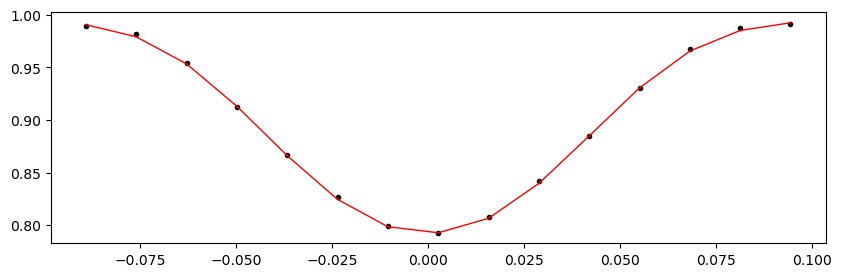

55083.4711618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.47it/s]


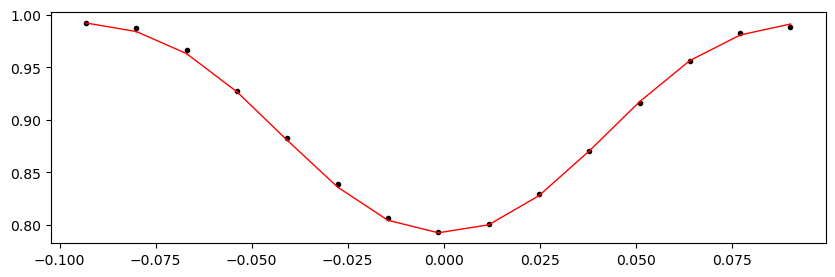

55085.0303718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1280.65it/s]


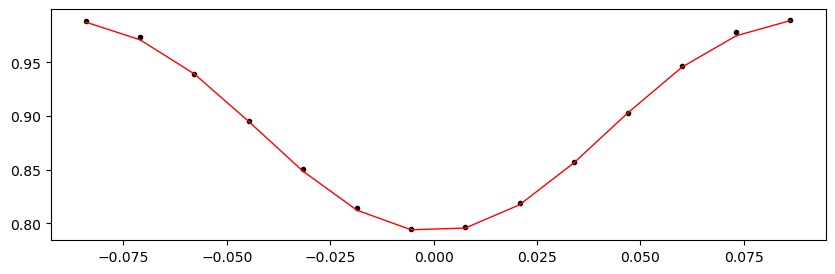

55086.5895818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.02it/s]


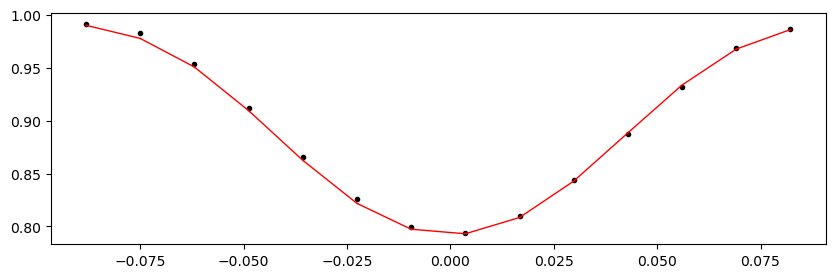

55089.7080018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1249.48it/s]


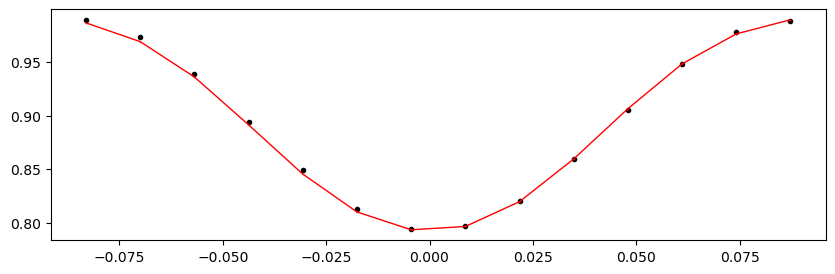

55094.385631895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.80it/s]


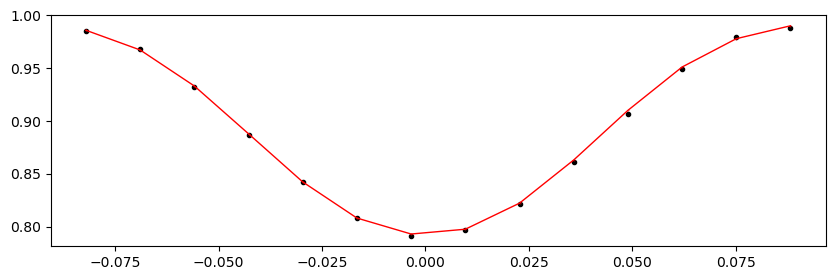

55095.944841895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1240.63it/s]


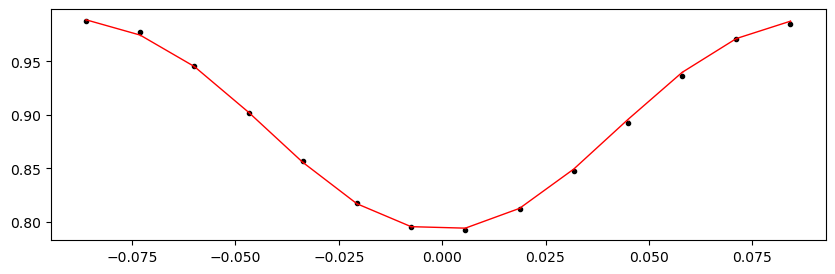

55097.5040518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.06it/s]


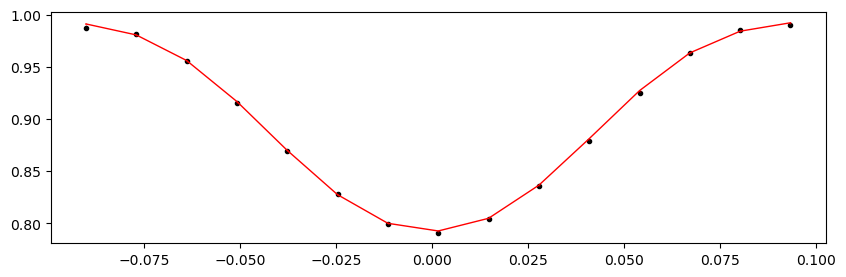

55099.0632618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.80it/s]


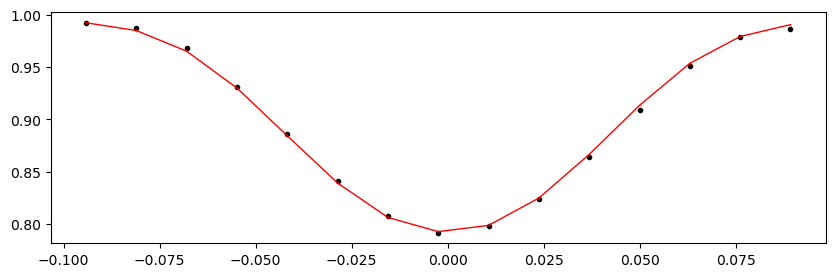

55100.6224718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1270.11it/s]


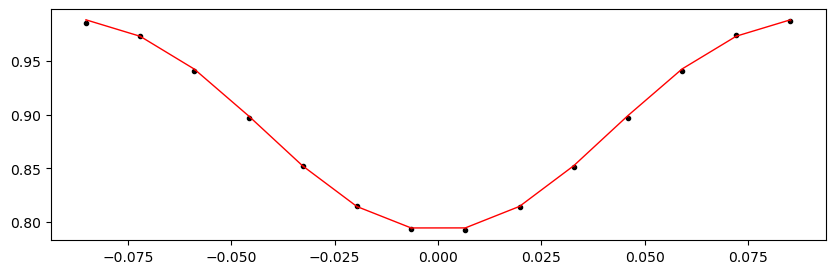

55102.1816818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1268.98it/s]


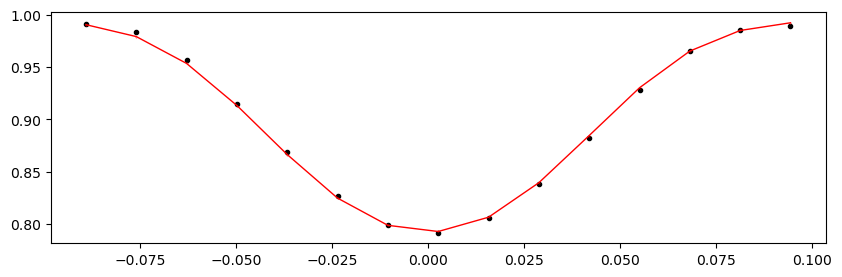

55103.7408918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1225.43it/s]


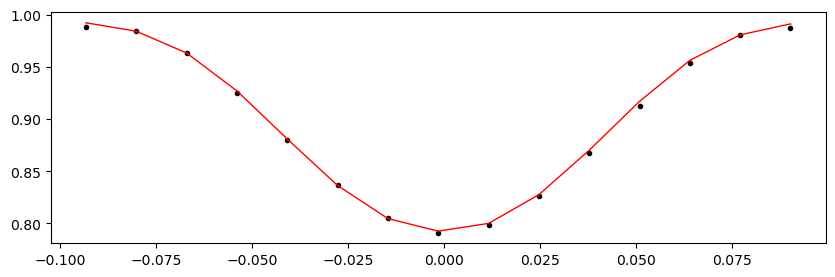

55105.3001018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1260.99it/s]


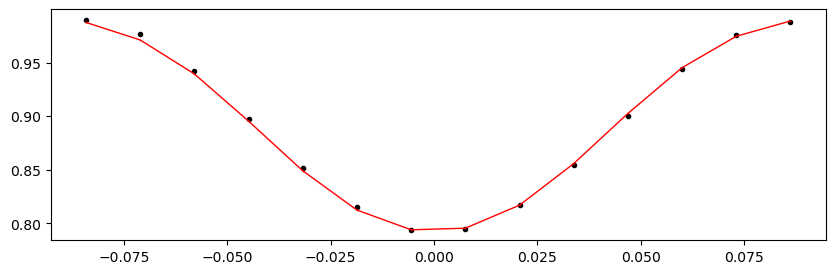

55106.8593118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1262.37it/s]


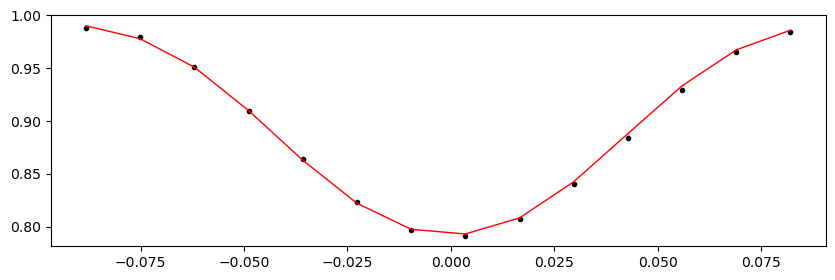

55108.4185218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1276.97it/s]


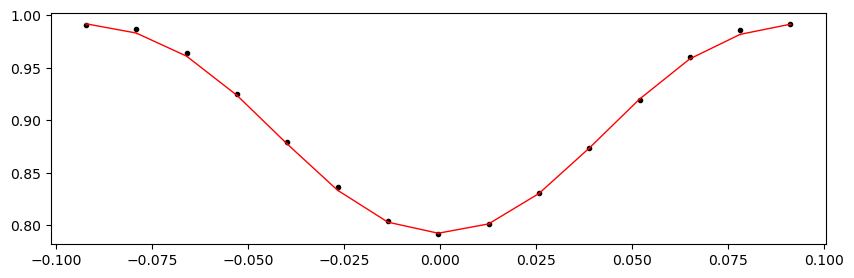

55109.9777318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1262.46it/s]


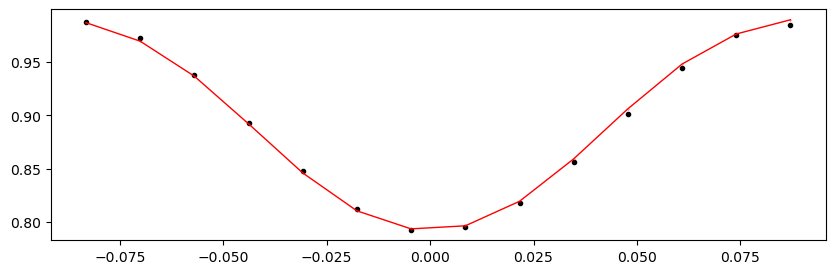

55111.536941895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1248.26it/s]


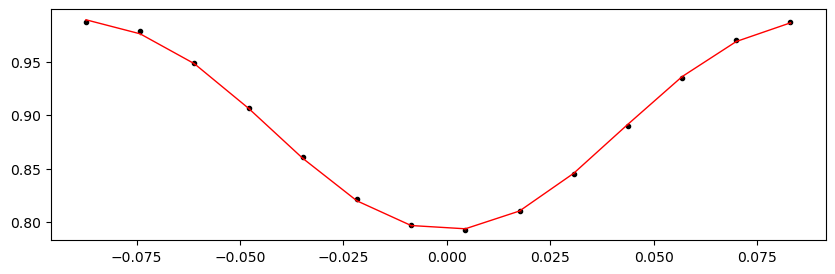

55114.655361895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1221.06it/s]


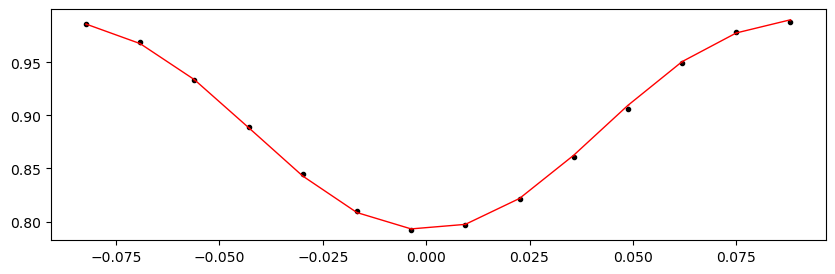

55116.214571895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1219.47it/s]


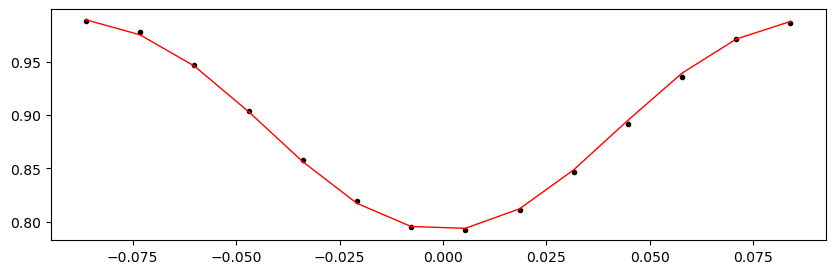

55117.7737818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1249.23it/s]


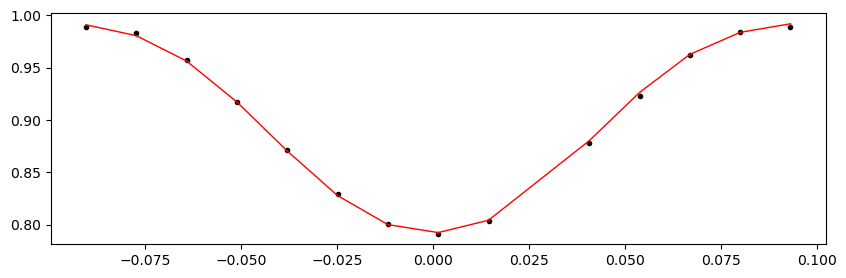

55119.3329918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.58it/s]


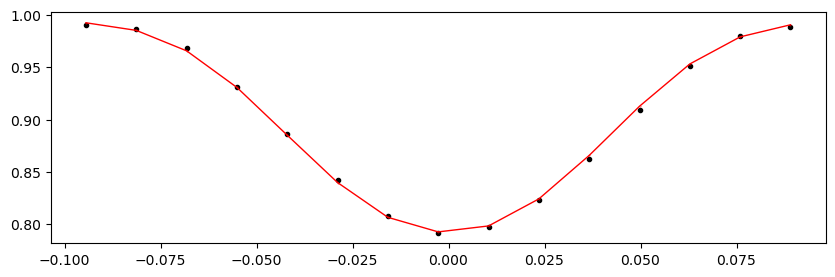

55120.8922018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.07it/s]


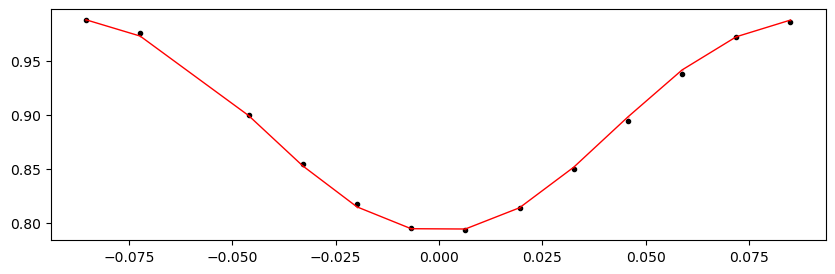

55122.4514118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1260.16it/s]


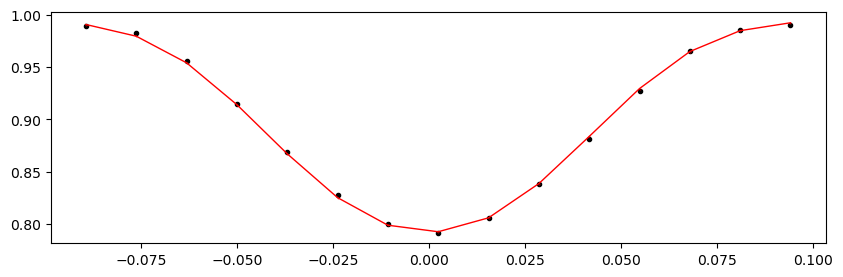

55125.5698318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1272.07it/s]


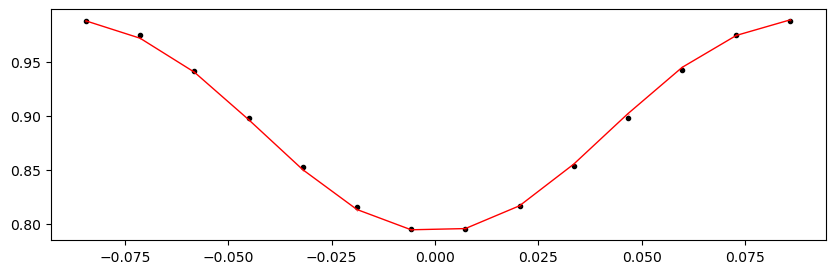

55127.1290418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1275.92it/s]


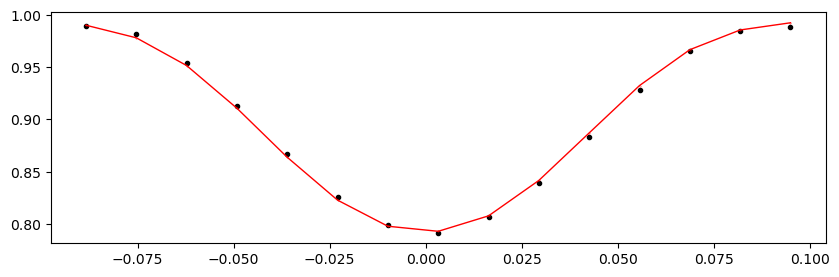

55128.6882518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1255.29it/s]


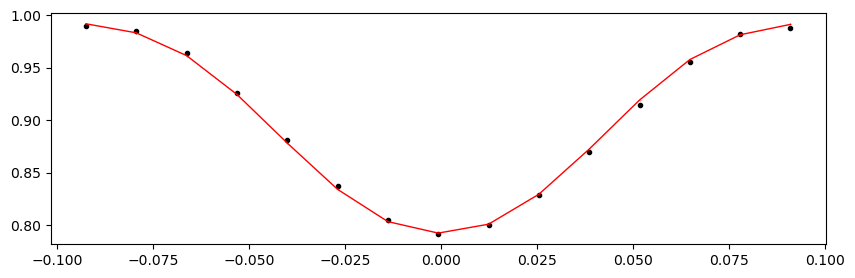

55130.2474618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1247.61it/s]


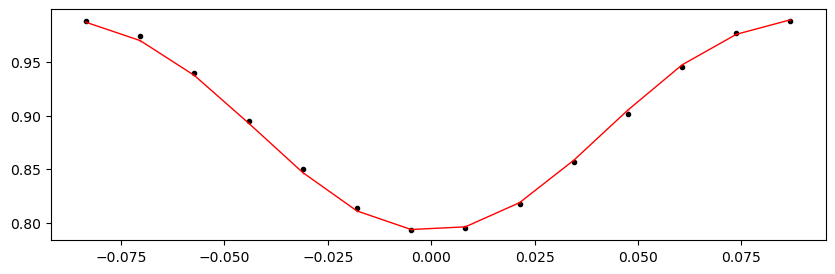

55131.806671895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1277.11it/s]


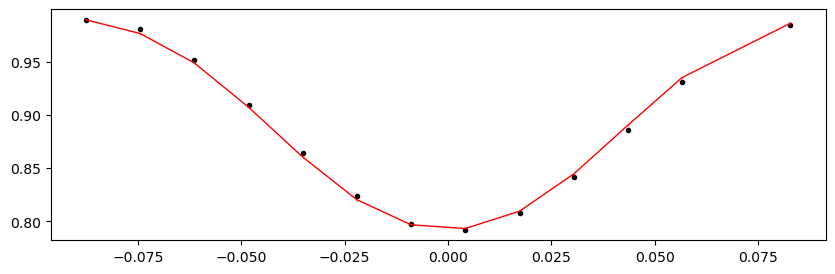

55133.365881895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1277.13it/s]


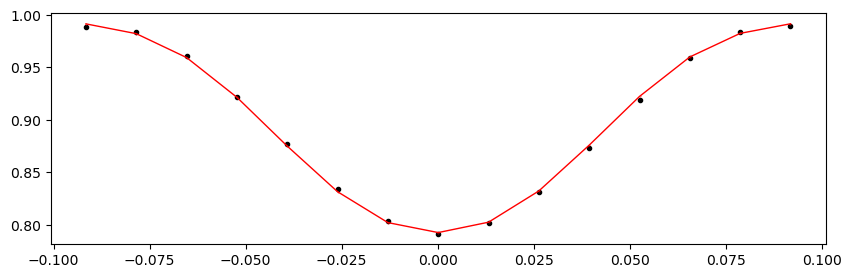

55134.925091895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1251.53it/s]


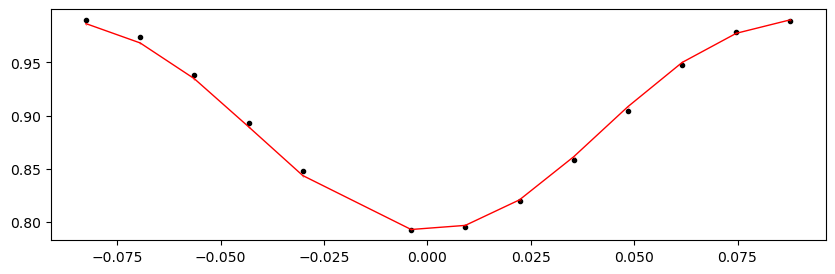

55136.484301895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1267.44it/s]


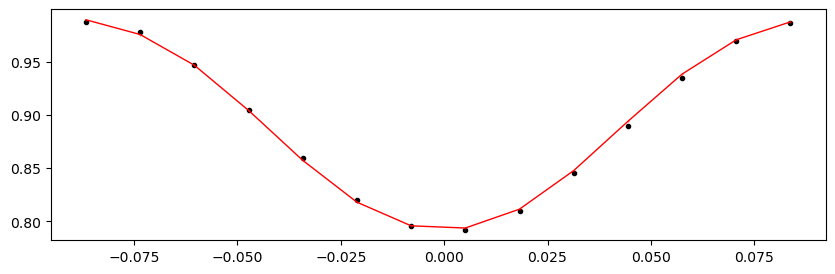

55138.0435118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1256.76it/s]


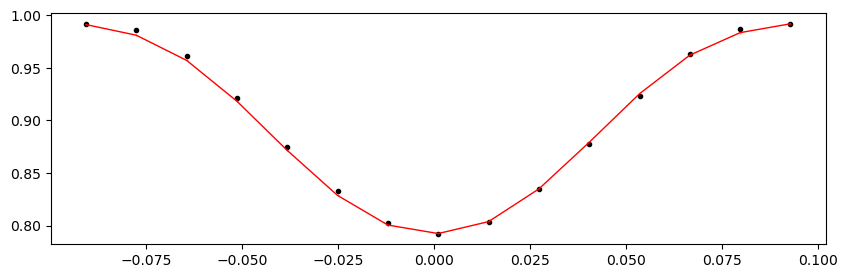

55139.6027218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1238.19it/s]


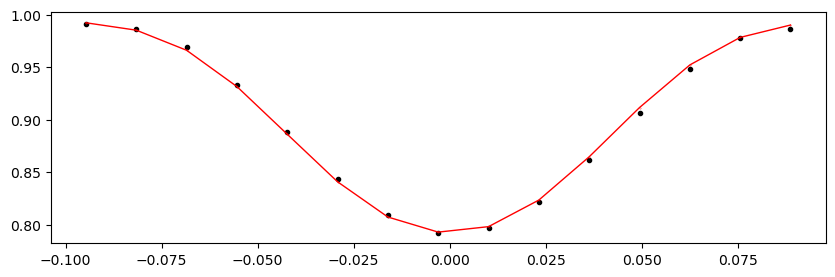

55141.1619318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1259.22it/s]


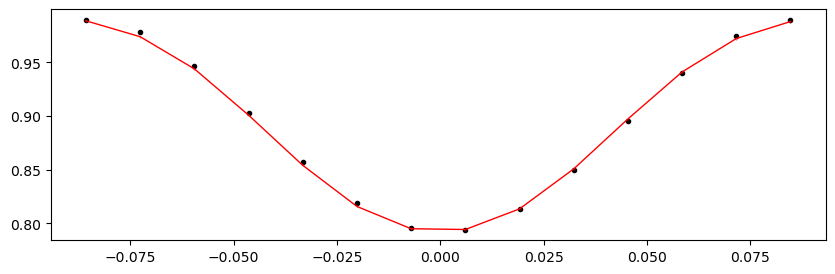

55142.7211418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1231.49it/s]


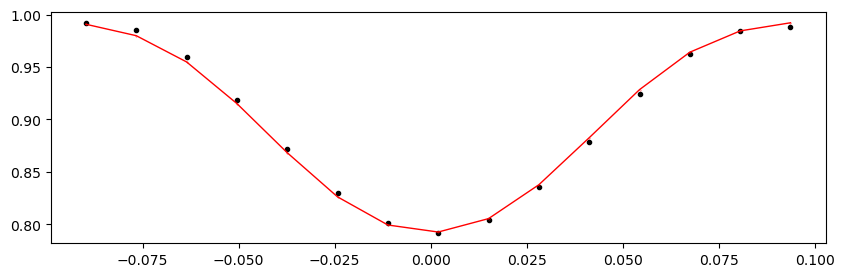

55144.2803518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1302.44it/s]


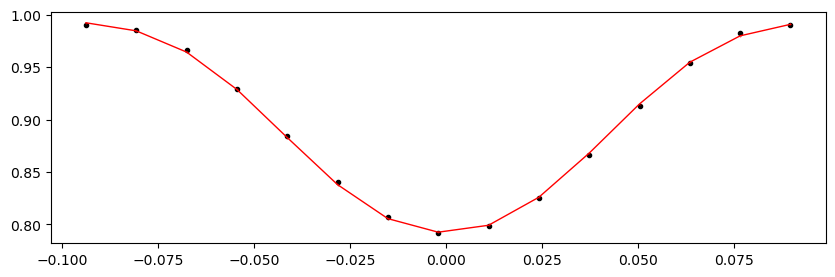

55145.8395618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1240.65it/s]


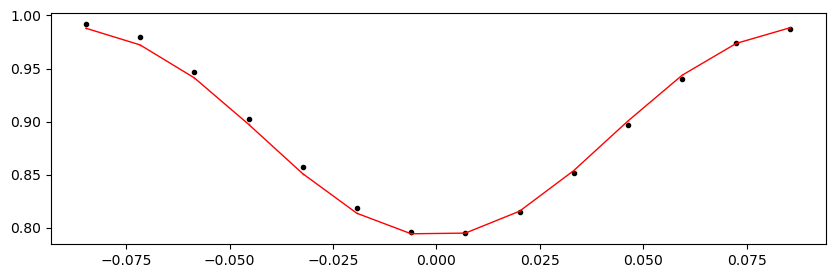

55147.3987718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1320.93it/s]


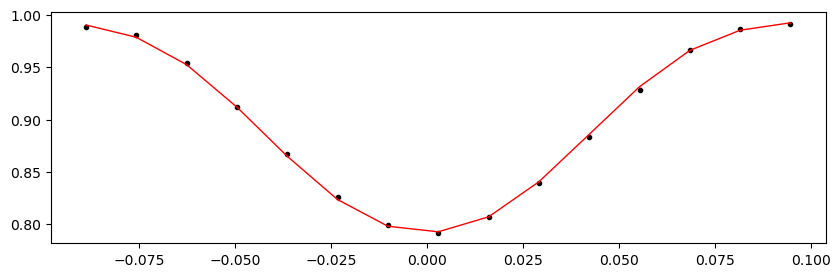

55148.9579818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1268.84it/s]


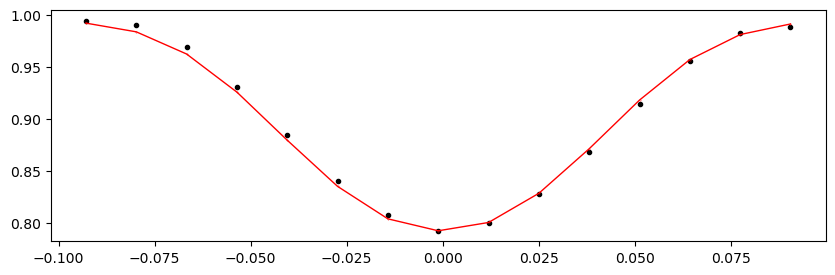

55150.5171918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1225.15it/s]


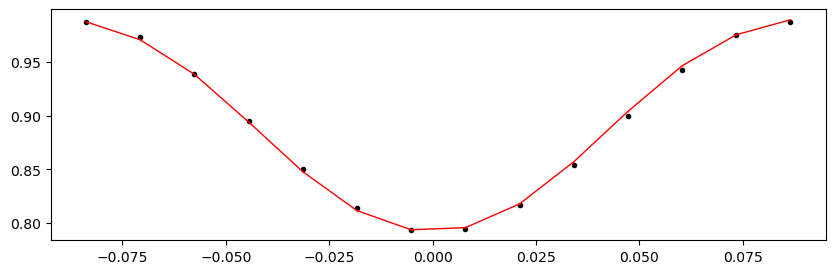

55152.076401895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1206.28it/s]


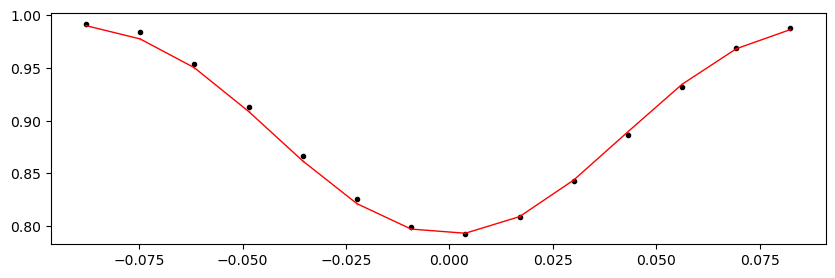

55153.635611895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.49it/s]


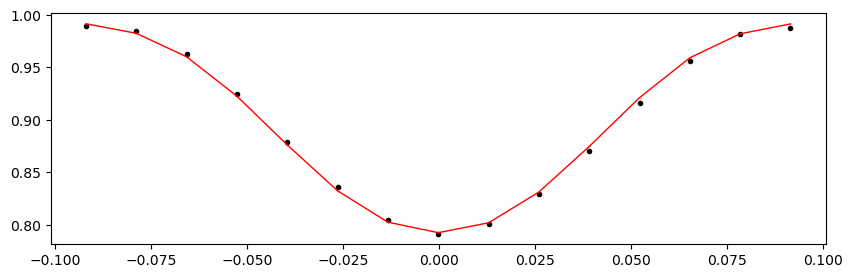

55156.754031895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1252.50it/s]


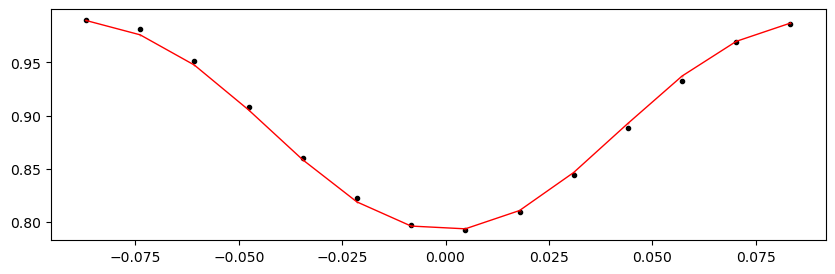

55158.3132418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1203.85it/s]


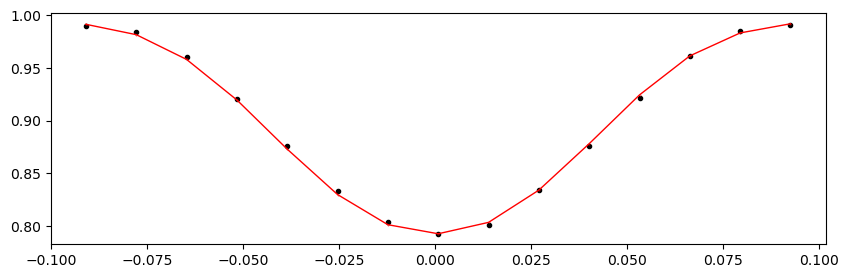

55159.8724518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1251.11it/s]


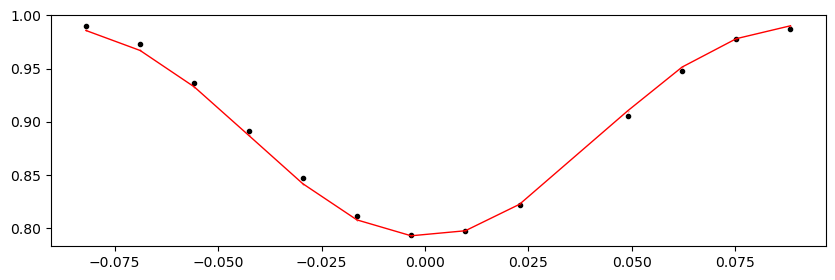

55161.4316618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1169.81it/s]


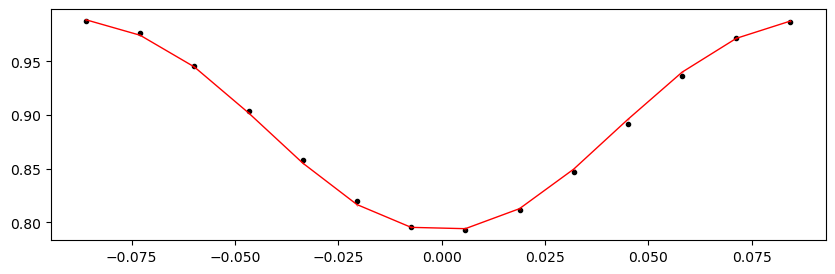

55162.9908718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1231.54it/s]


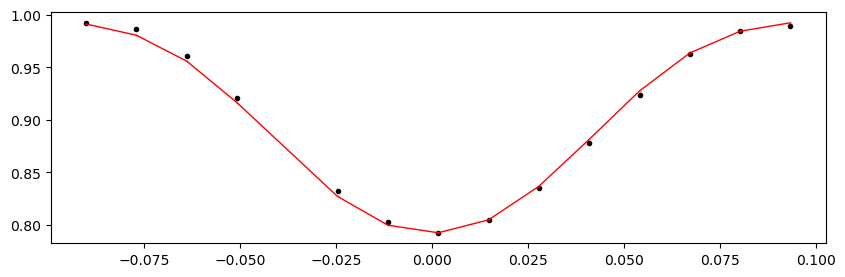

55164.5500818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1194.38it/s]


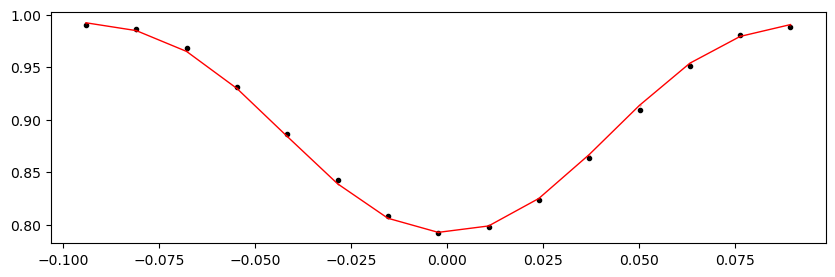

55166.1092918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1251.54it/s]


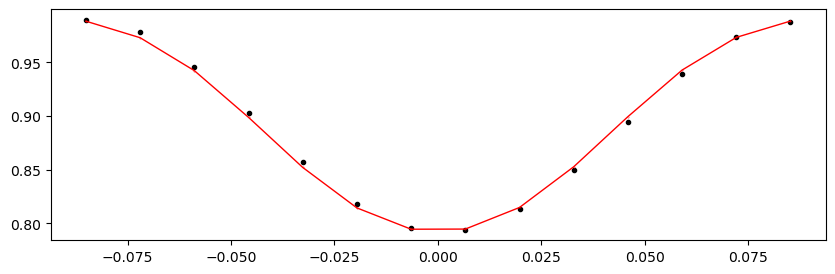

55167.6685018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1255.32it/s]


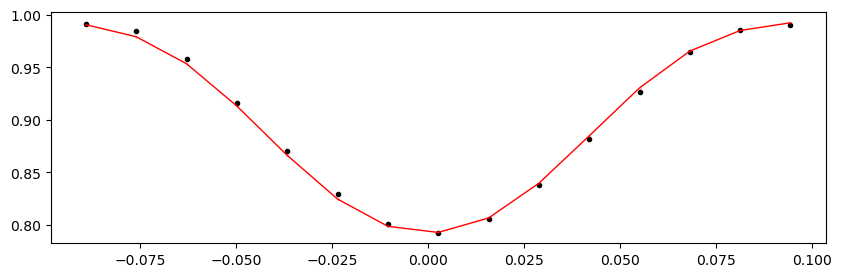

55169.2277118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1236.05it/s]


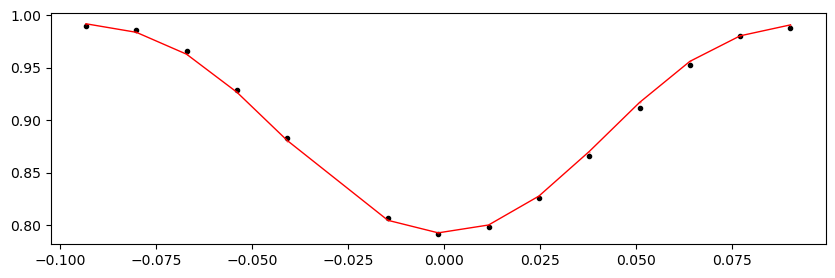

55170.7869218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1270.62it/s]


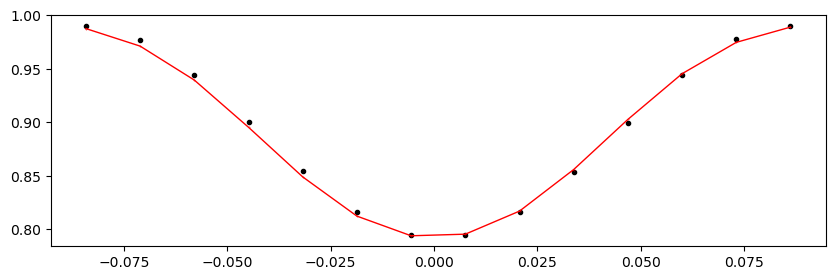

55172.346131895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1212.57it/s]


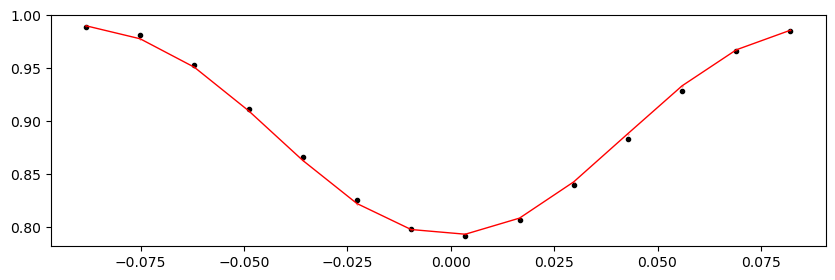

55173.905341895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1239.64it/s]


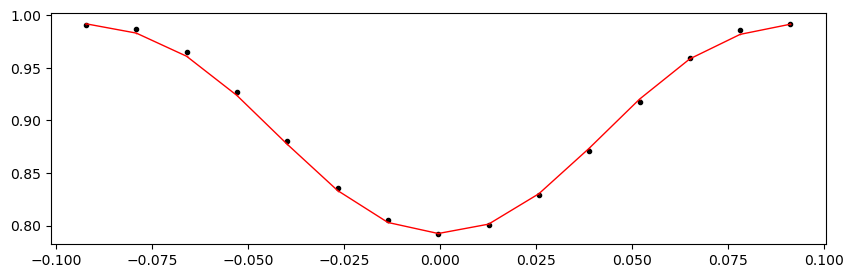

55175.464551895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.04it/s]


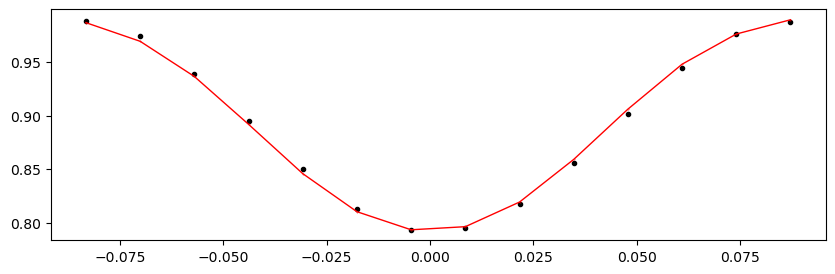

55177.023761895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1242.81it/s]


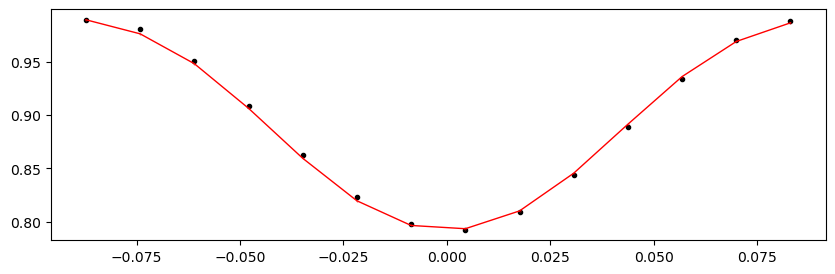

55178.5829718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1248.43it/s]


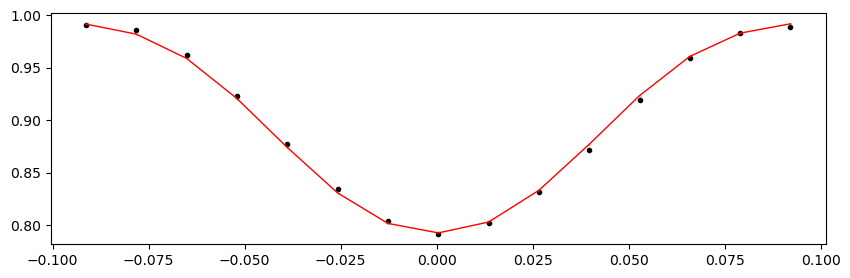

55180.1421818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1240.48it/s]


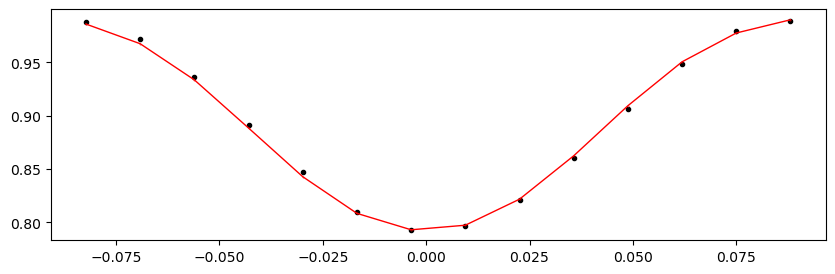

55181.7013918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1223.78it/s]


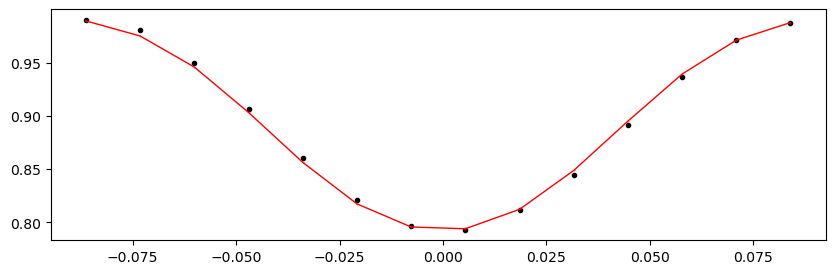

55186.3790218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1240.92it/s]


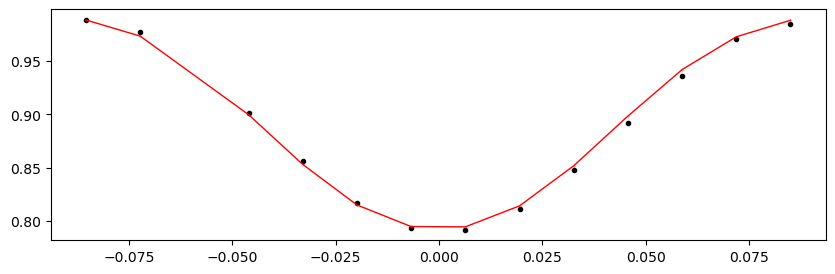

55187.9382318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1231.59it/s]


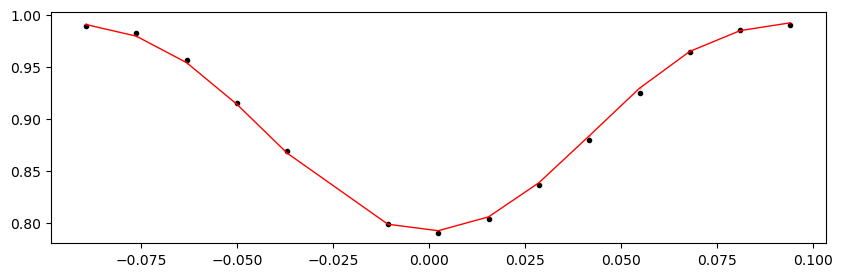

55189.4974418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1243.89it/s]


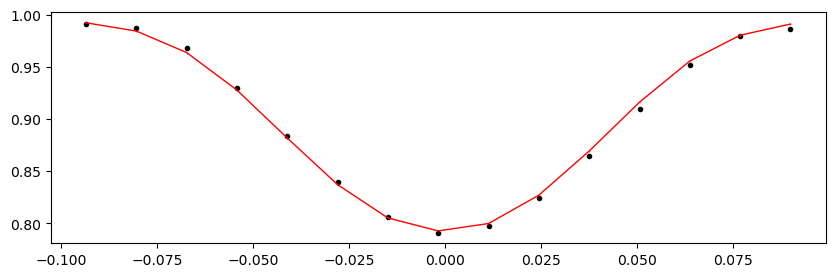

55191.0566518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1254.95it/s]


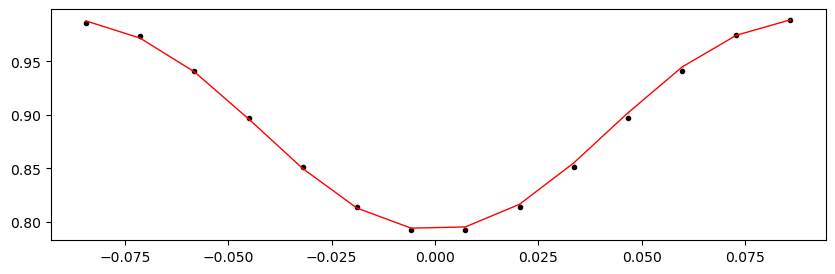

55192.615861895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1206.25it/s]


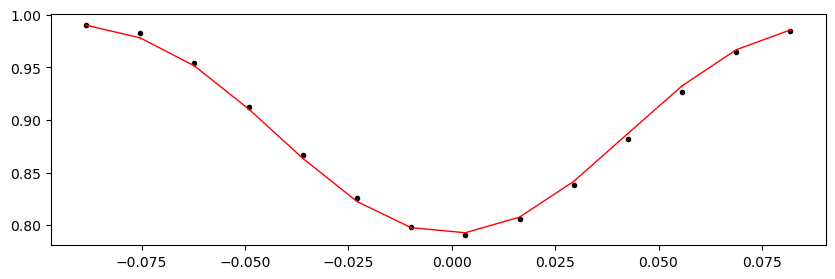

55194.175071895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1235.24it/s]


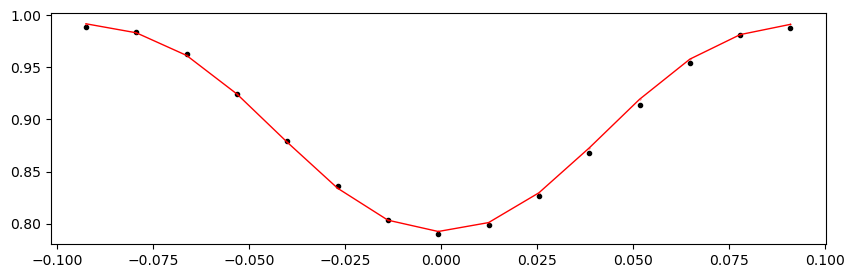

55195.734281895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1264.18it/s]


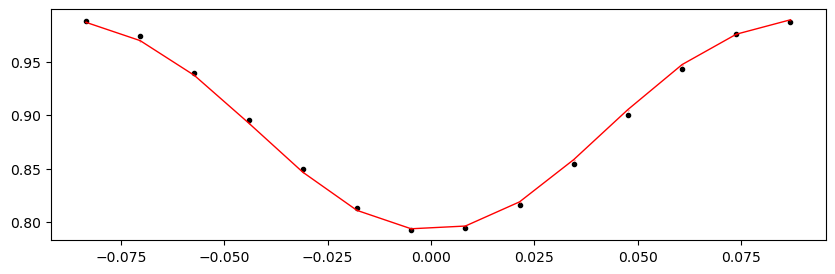

55197.293491895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1276.58it/s]


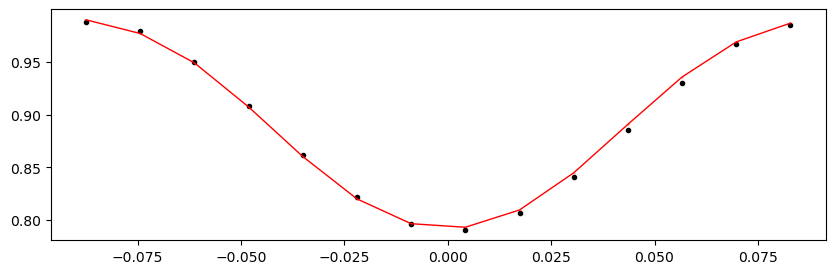

55198.8527018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1217.97it/s]


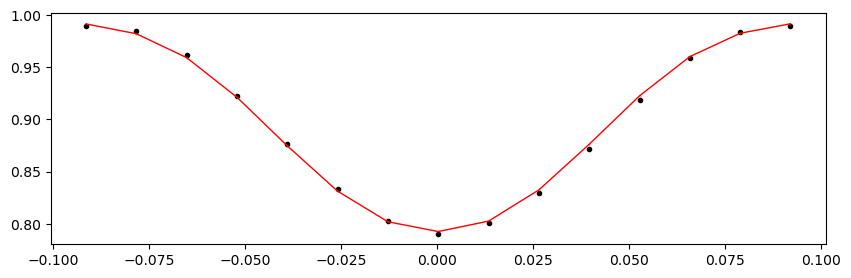

55200.4119118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1252.34it/s]


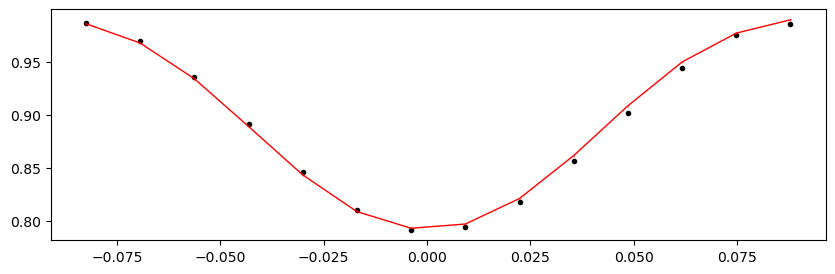

55201.9711218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1231.79it/s]


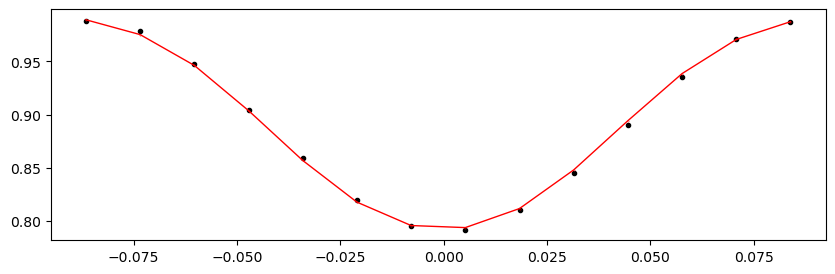

55203.5303318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1218.06it/s]


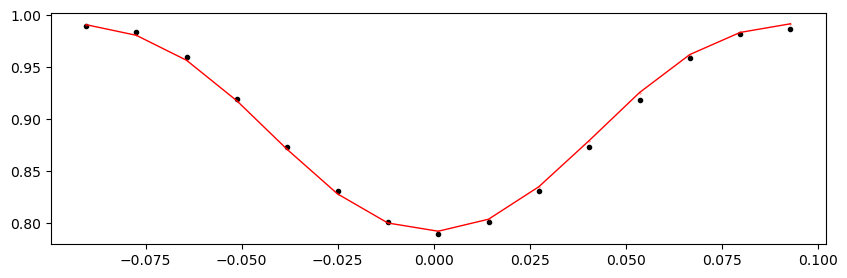

55205.0895418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1237.63it/s]


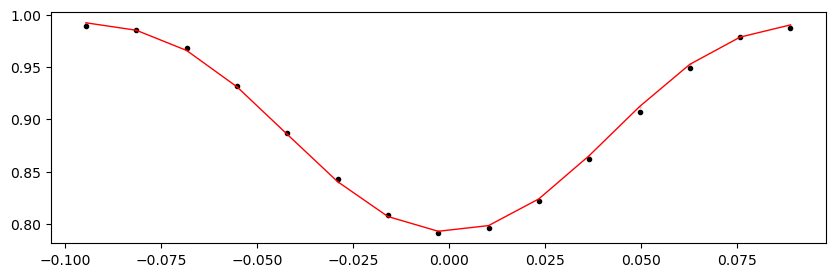

55206.6487518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1200.66it/s]


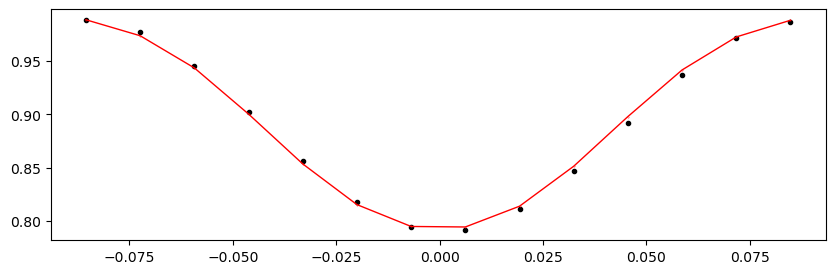

55208.2079618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1189.04it/s]


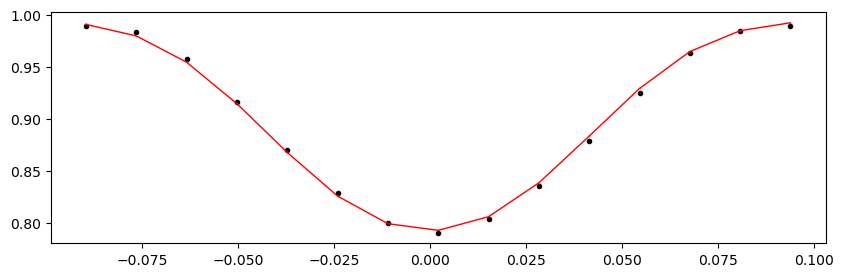

55209.7671718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1246.05it/s]


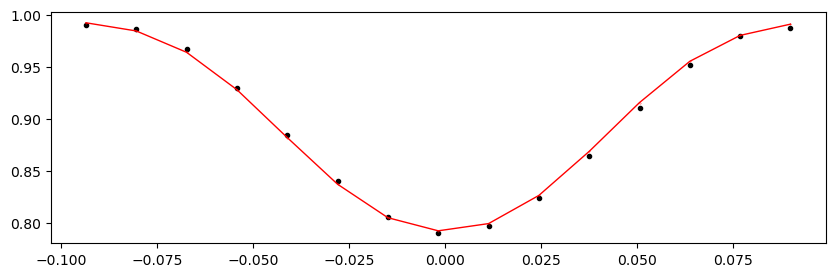

55211.3263818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1243.77it/s]


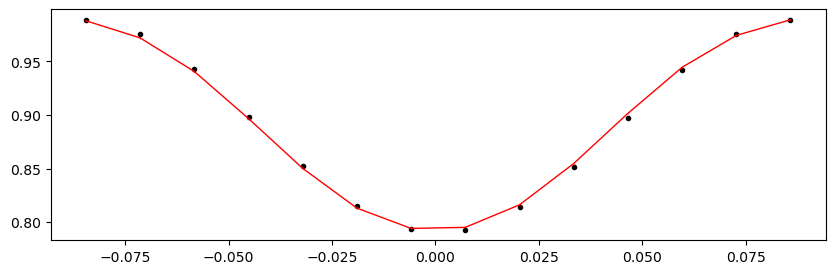

55212.885591895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1244.82it/s]


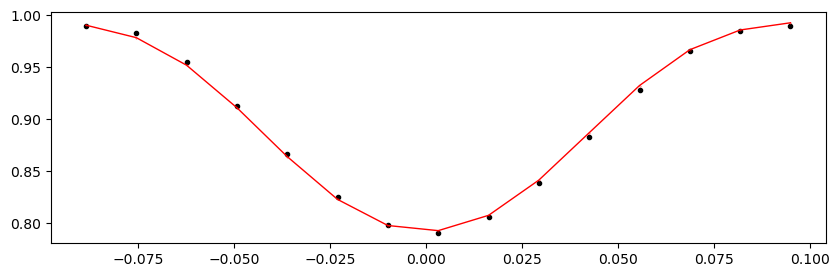

55214.444801895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1268.57it/s]


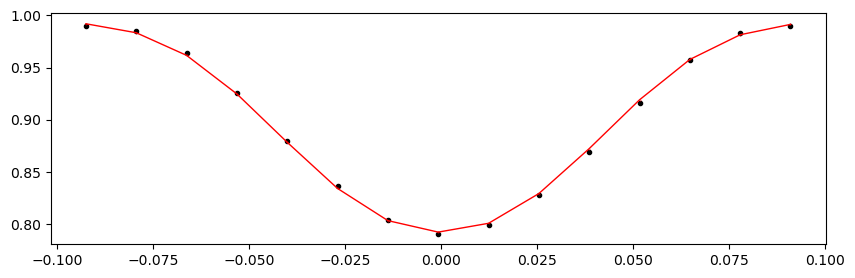

55217.563221895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1196.19it/s]


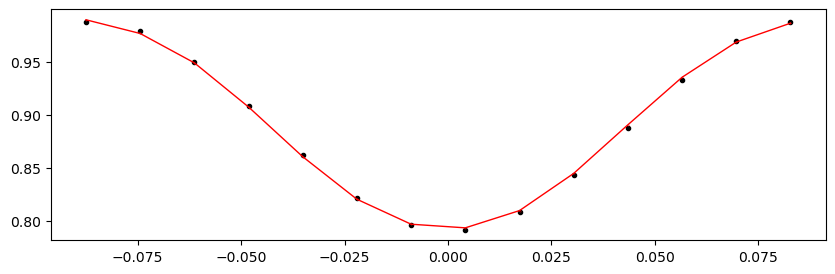

55219.1224318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1248.40it/s]


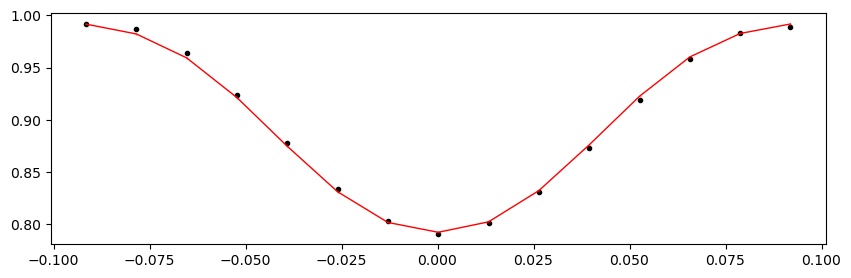

55220.6816418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1222.87it/s]


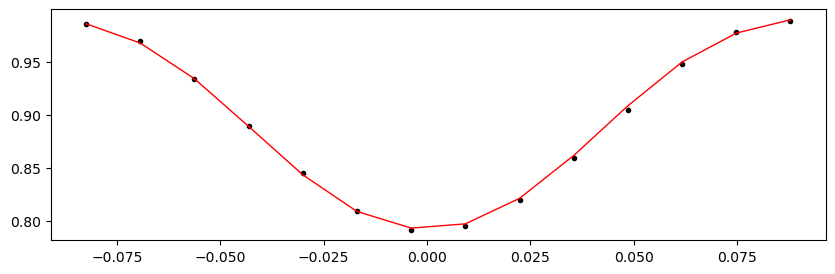

55222.2408518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1248.41it/s]


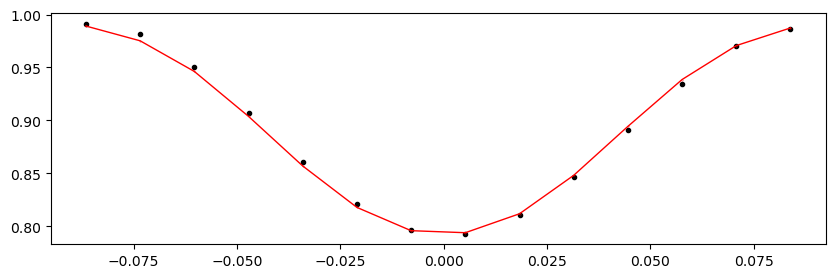

55223.8000618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.89it/s]


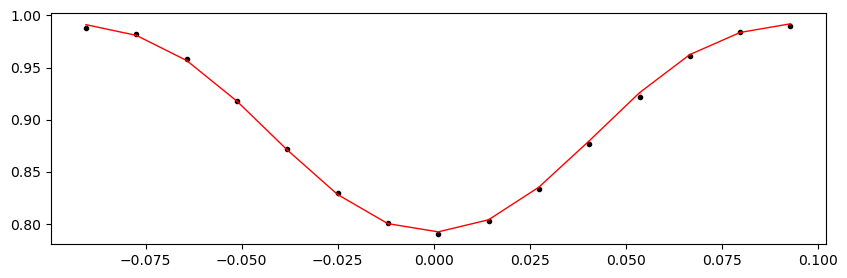

55225.3592718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1227.23it/s]


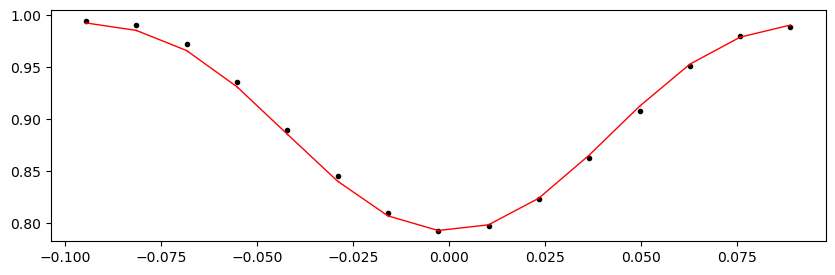

55226.9184818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.25it/s]


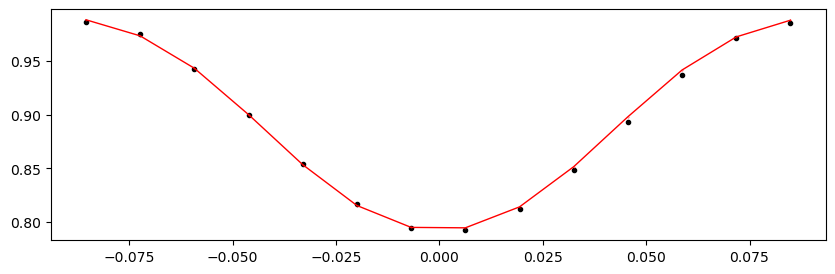

55228.4776918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1267.46it/s]


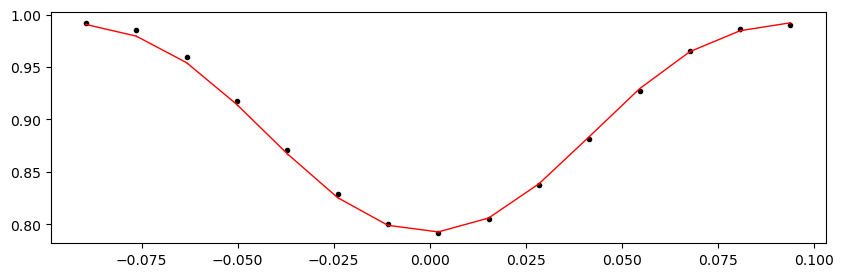

55234.714531895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1294.12it/s]


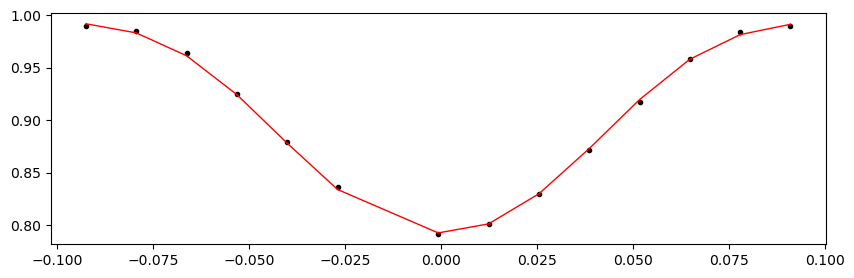

55236.273741895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1313.40it/s]


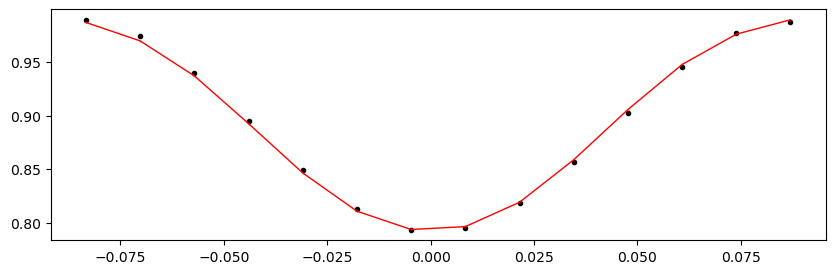

55237.832951895594 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1257.88it/s]


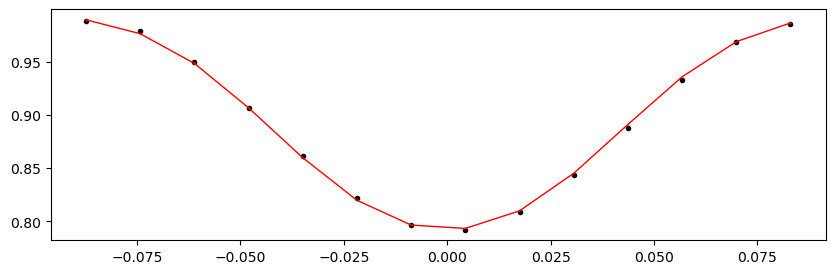

55239.3921618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1298.89it/s]


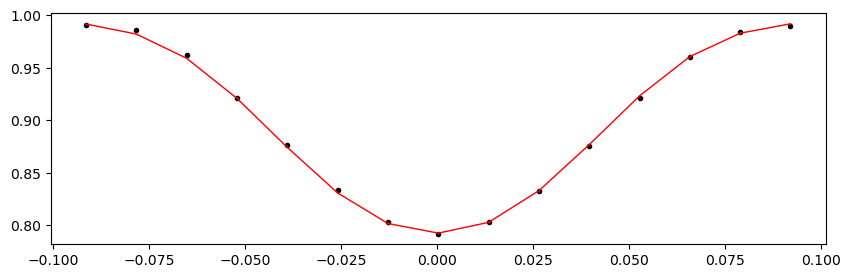

55240.9513718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1325.10it/s]


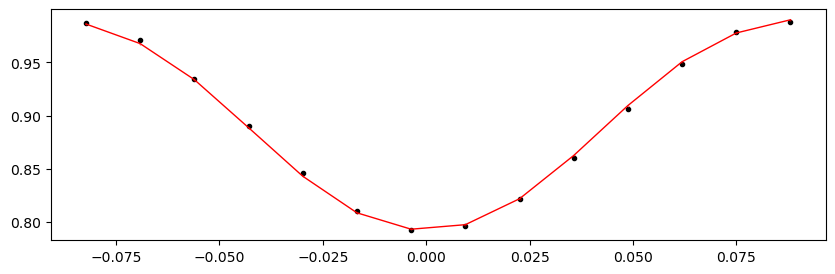

55242.5105818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1251.64it/s]


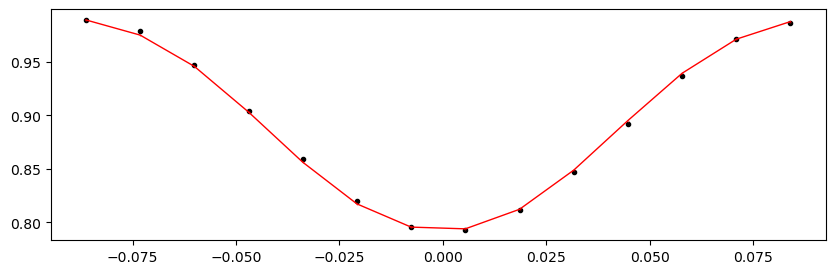

55244.0697918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1252.25it/s]


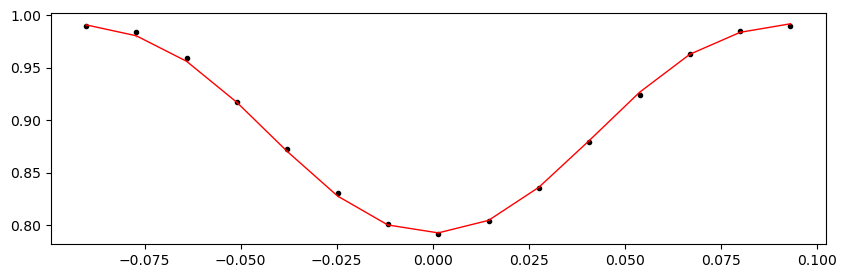

55245.6290018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1273.83it/s]


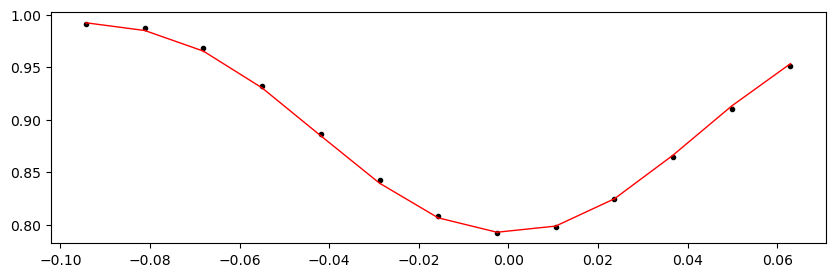

55247.1882118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1168.05it/s]


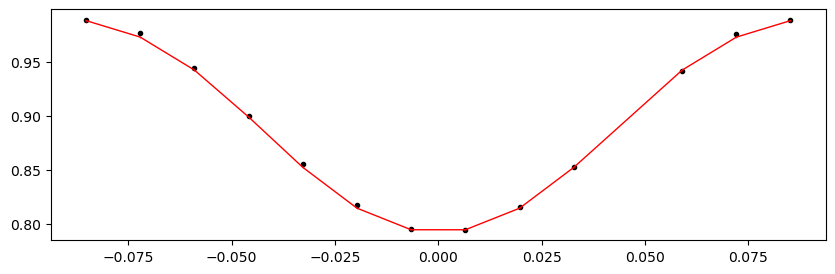

55248.7474218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1234.62it/s]


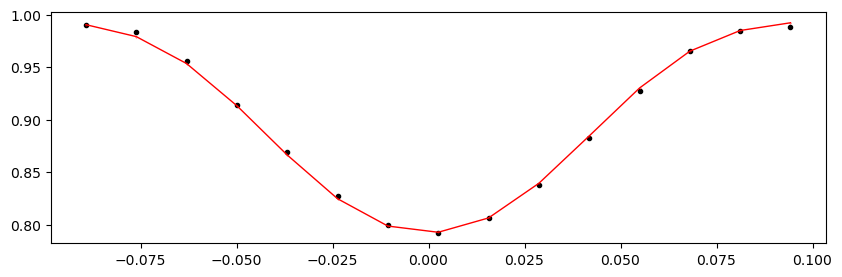

55250.3066318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1225.94it/s]


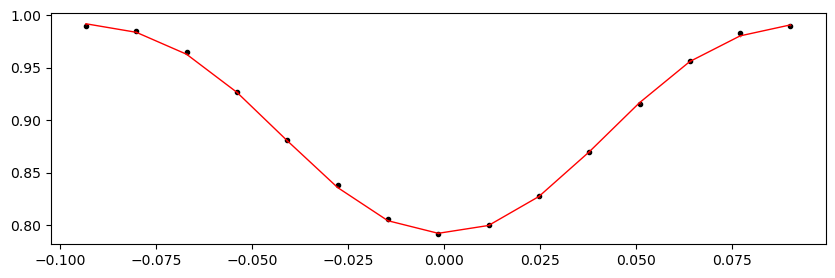

55251.8658418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.28it/s]


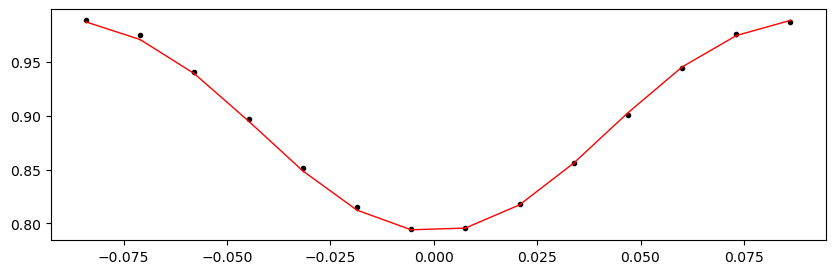

55253.425051895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1233.03it/s]


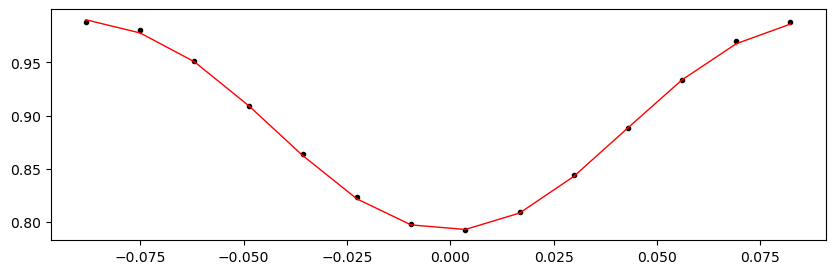

55254.984261895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.97it/s]


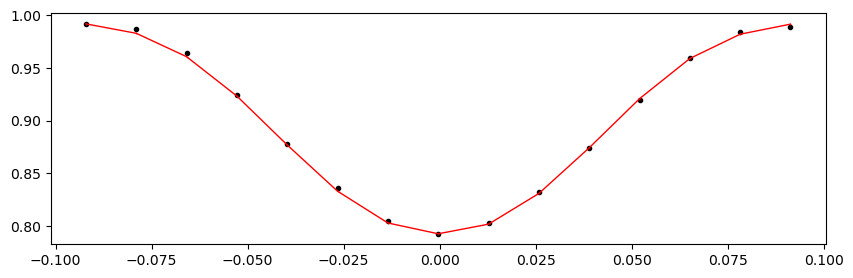

55256.543471895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1196.86it/s]


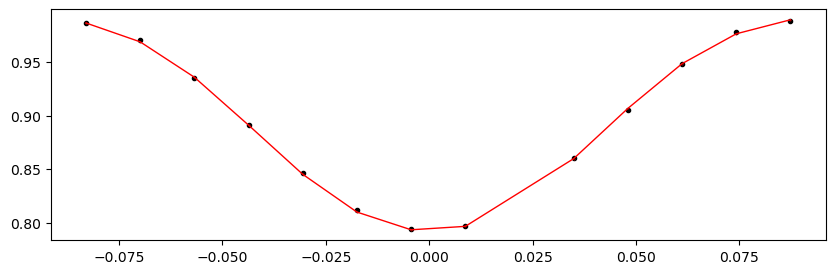

55258.1026818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1233.88it/s]


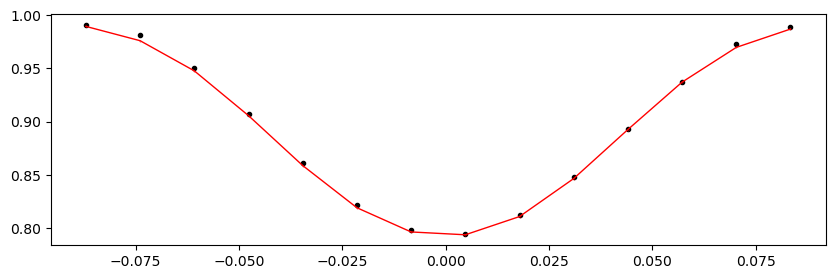

55259.6618918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1275.52it/s]


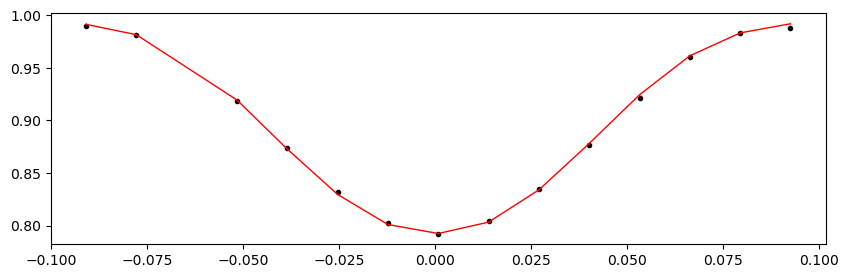

55261.2211018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1260.12it/s]


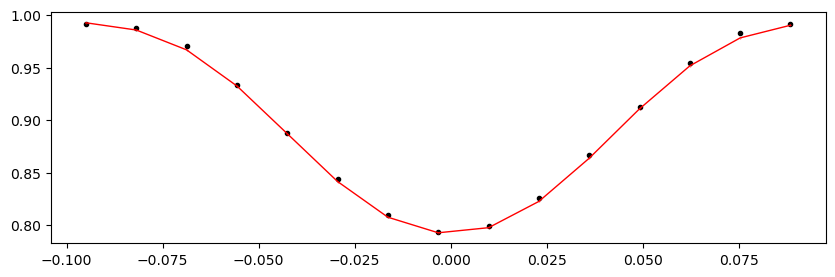

55262.7803118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1237.62it/s]


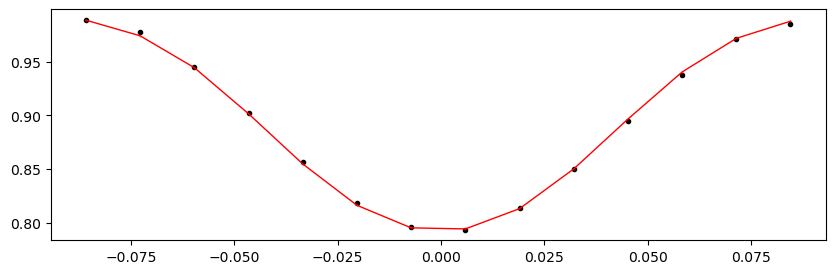

55264.3395218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1257.85it/s]


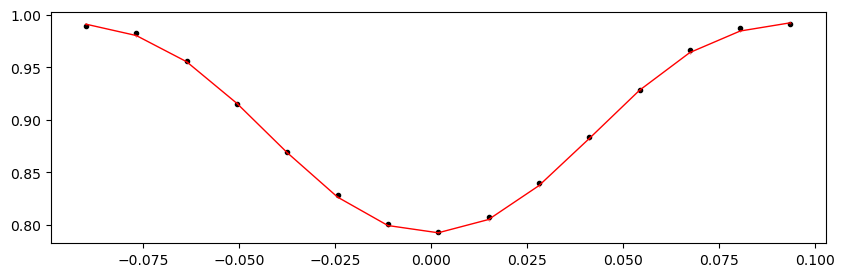

55265.8987318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1241.48it/s]


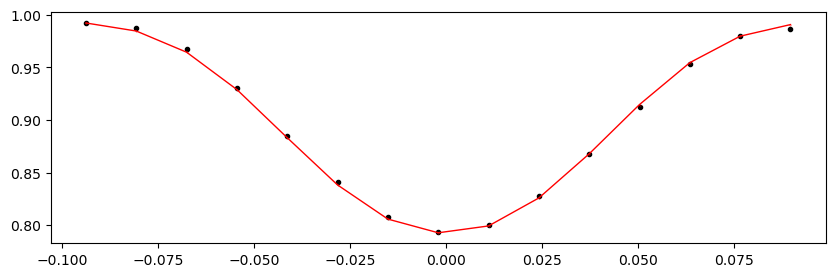

55267.4579418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1277.10it/s]


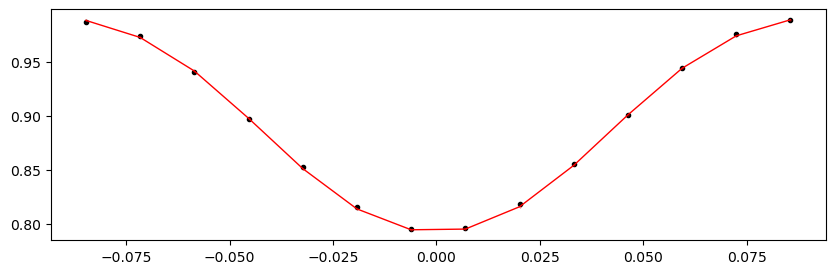

55269.0171518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1246.87it/s]


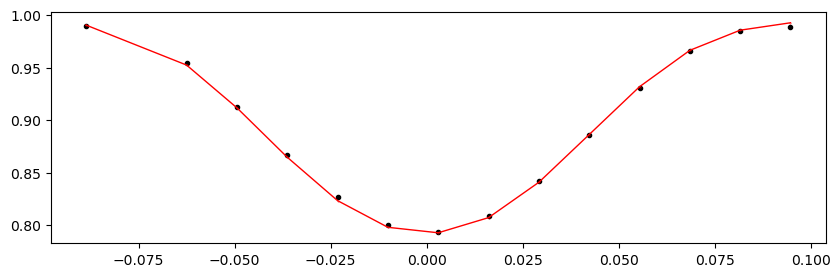

55270.5763618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1191.98it/s]


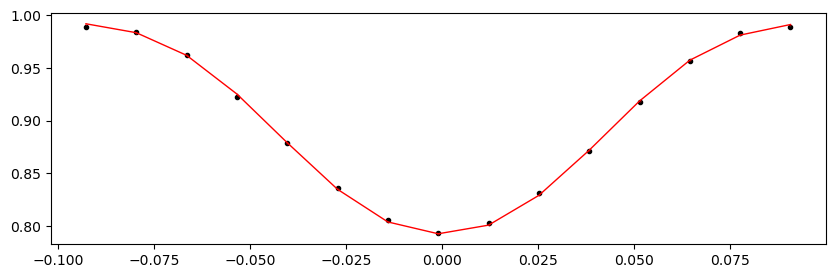

55272.1355718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.58it/s]


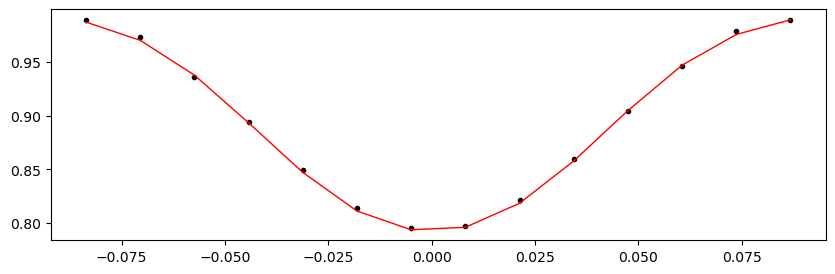

55273.694781895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1221.77it/s]


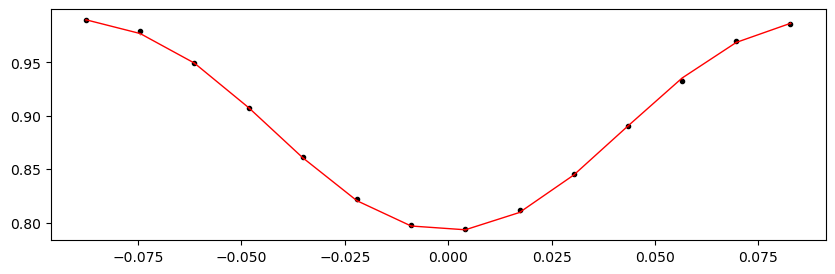

55276.813201895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1256.23it/s]


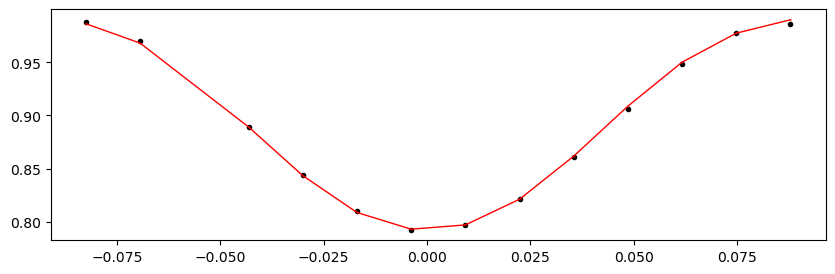

55278.3724118956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.75it/s]


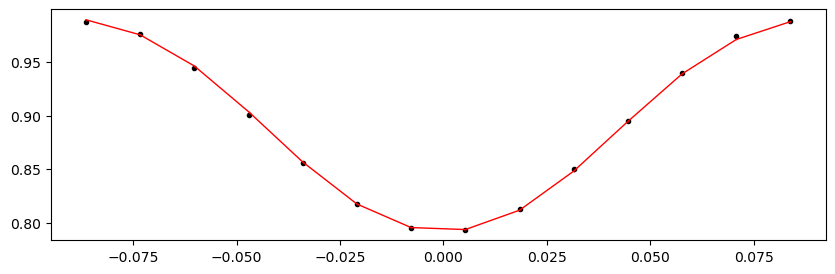

55279.9316218956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1252.05it/s]


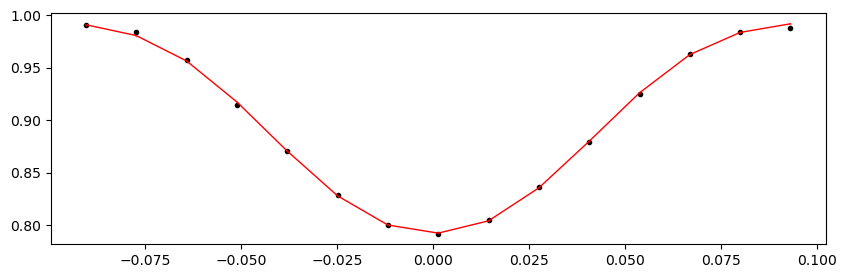

55281.4908318956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1251.61it/s]


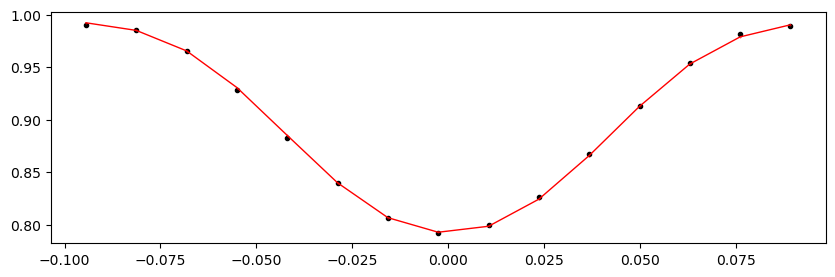

55283.0500418956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1243.79it/s]


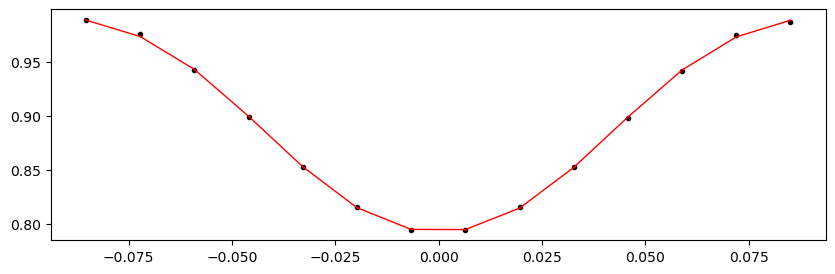

55284.6092518956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1233.09it/s]


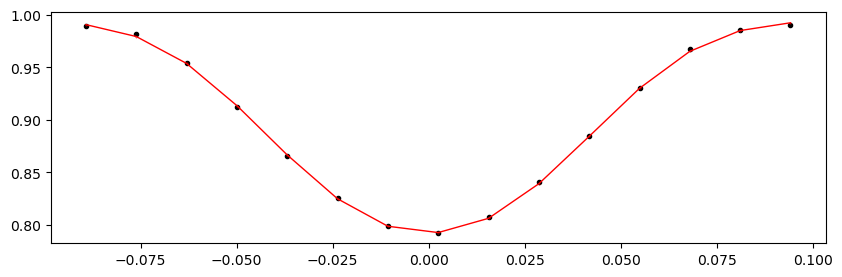

55286.1684618956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1249.69it/s]


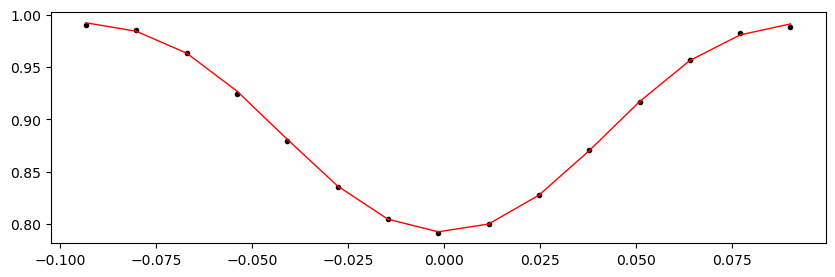

55287.7276718956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1253.10it/s]


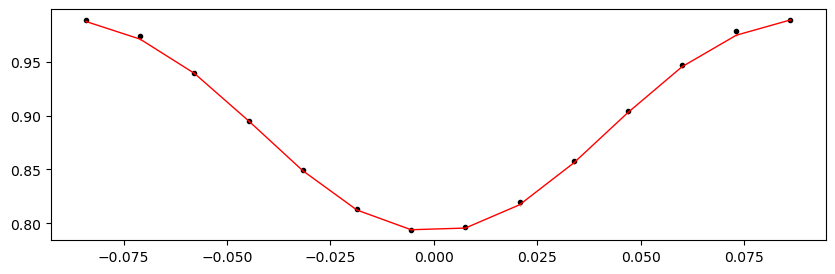

55289.2868818956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.54it/s]


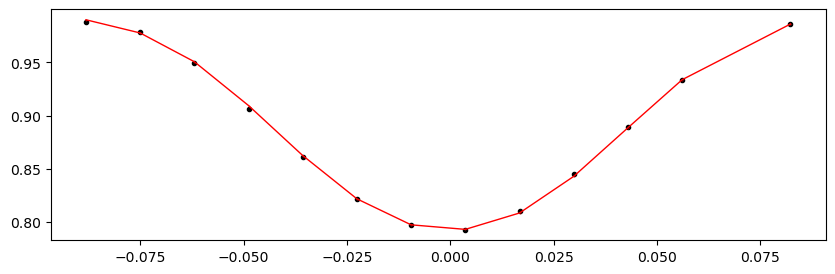

55290.8460918956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1240.38it/s]


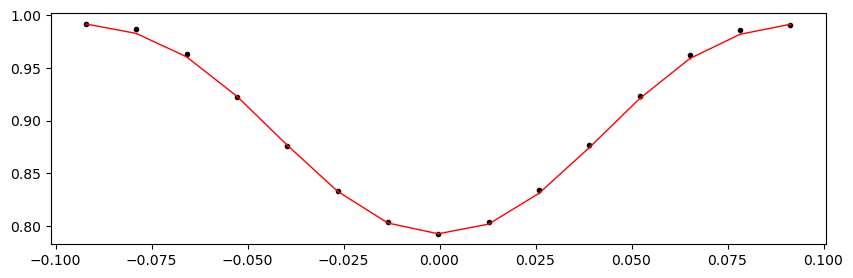

55292.4053018956 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.57it/s]


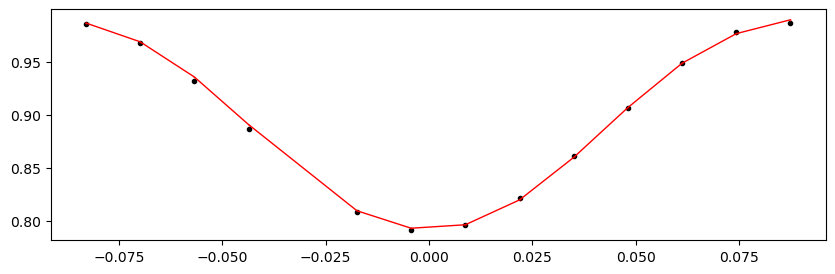

55293.964511895596 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.75it/s]


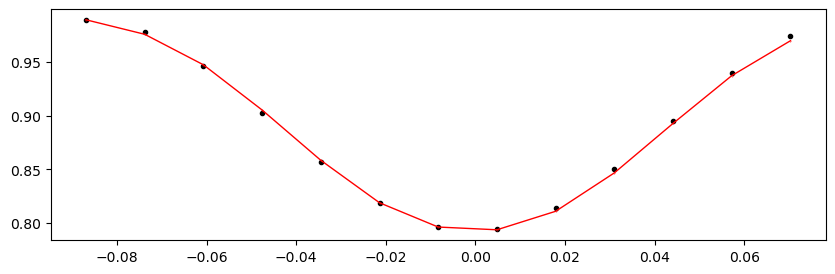

55295.523721895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1214.61it/s]


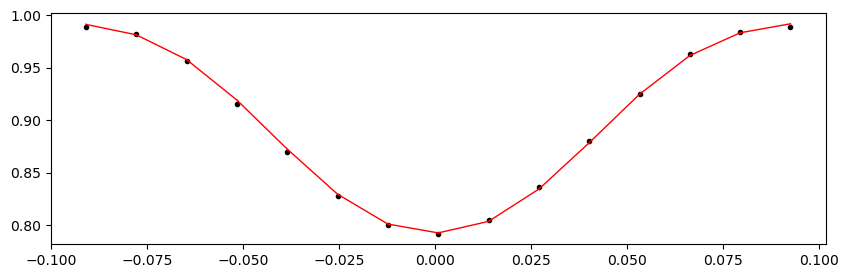

55297.082931895595 0.9941936579424828 -0.20175775108936497 -0.19210856727520179


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1254.73it/s]


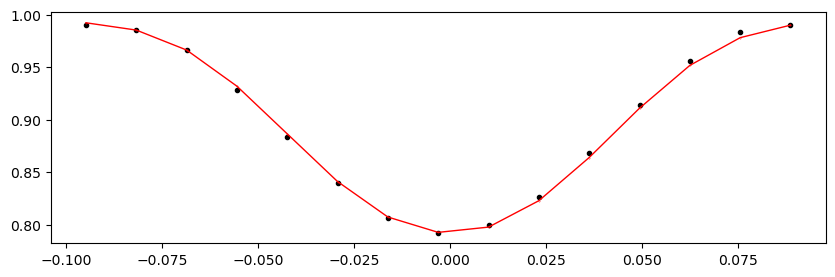

In [215]:
%matplotlib inline

from importlib import reload
reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=12,  # Kepler 30-min cadene data requires a lower min_number_data
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"

Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
54964.1915968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1296.04it/s]


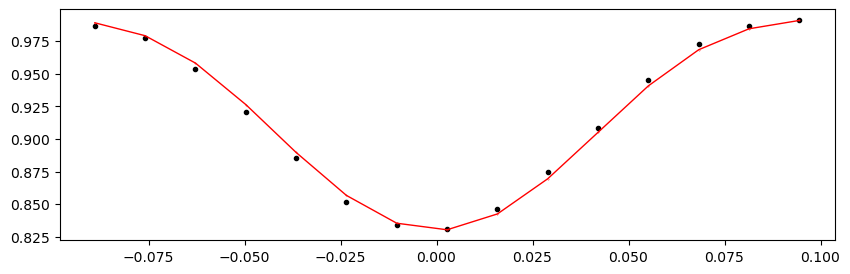

54965.7508068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.38it/s]


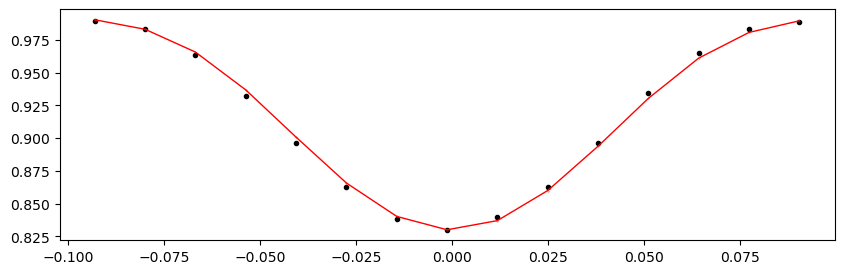

54967.3100168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.00it/s]


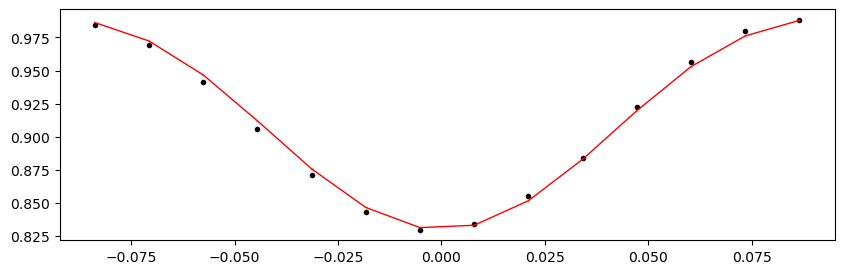

54968.8692268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1286.55it/s]


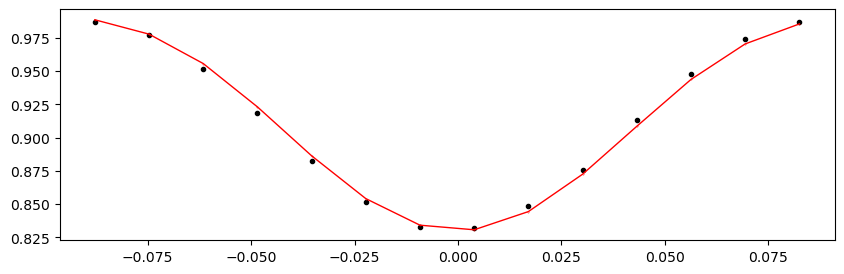

54970.4284368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1240.64it/s]


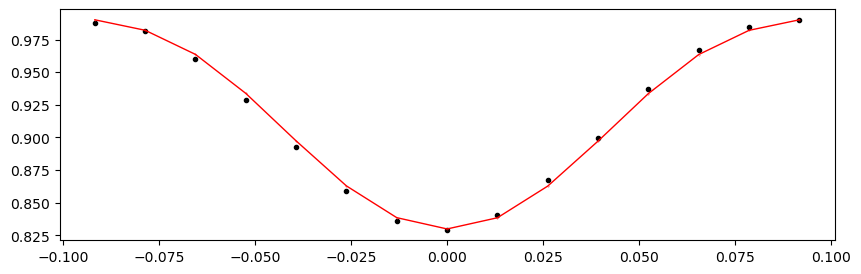

54971.9876468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.59it/s]


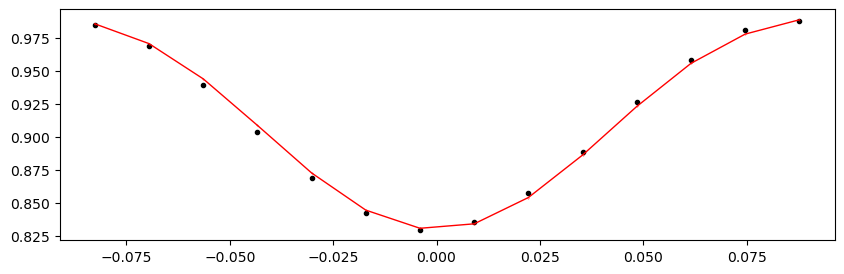

54973.5468568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.66it/s]


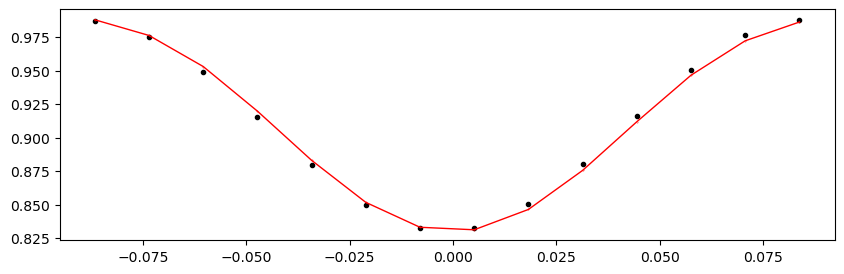

54975.106066895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1229.58it/s]


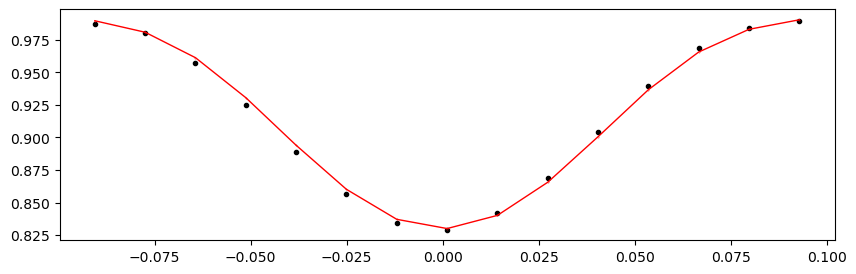

54976.665276895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.00it/s]


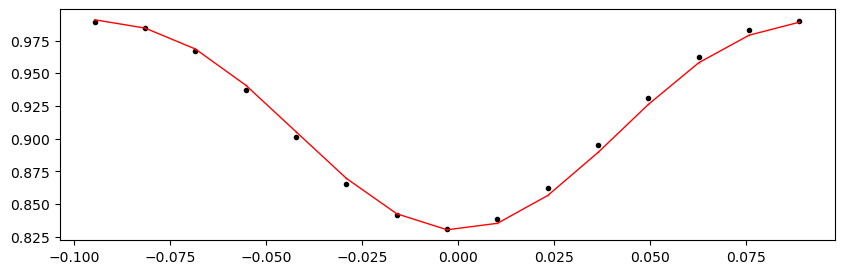

54978.224486895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1121.45it/s]


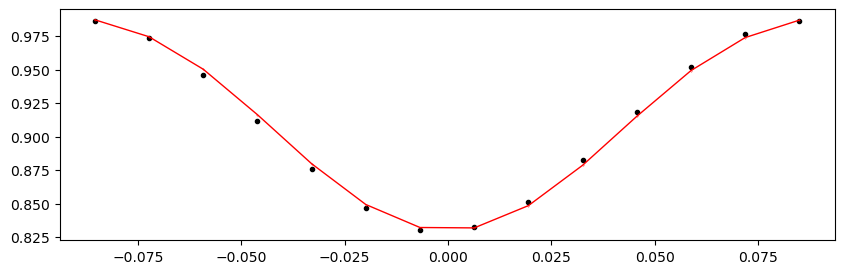

54979.7836968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1218.03it/s]


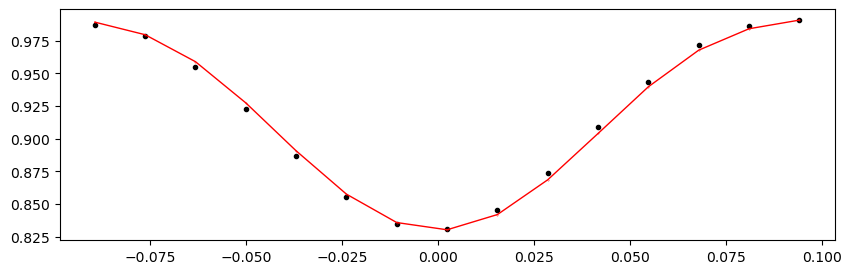

54981.3429068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1212.61it/s]


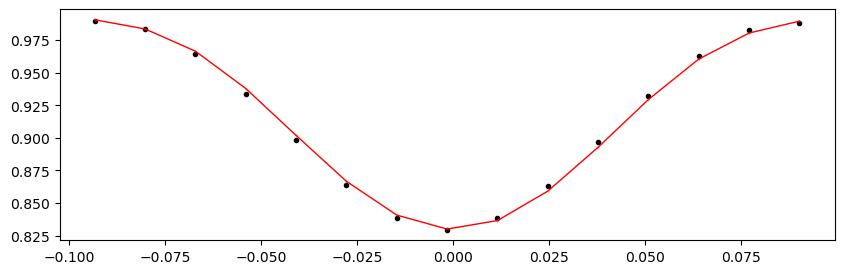

54982.9021168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1200.03it/s]


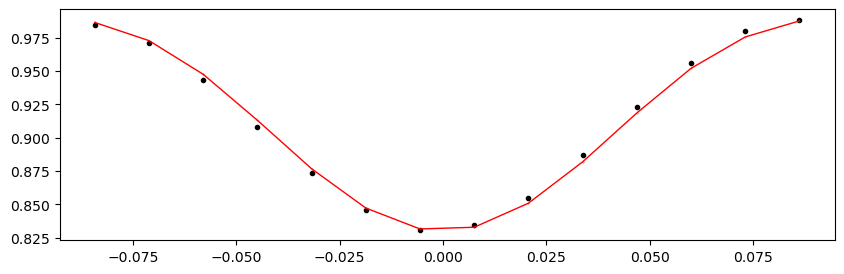

54984.4613268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1218.20it/s]


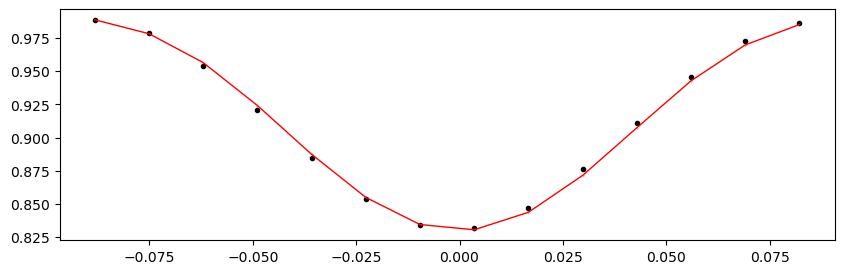

54986.0205368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1232.61it/s]


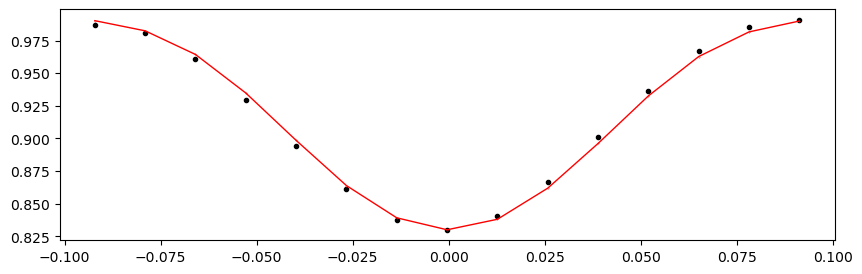

54987.5797468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1199.06it/s]


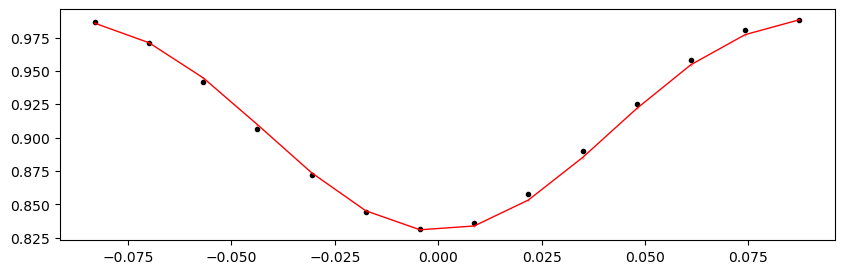

54989.1389568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1227.62it/s]


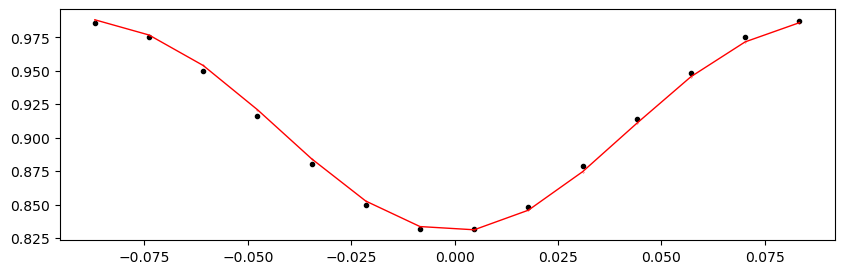

54990.6981668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1200.49it/s]


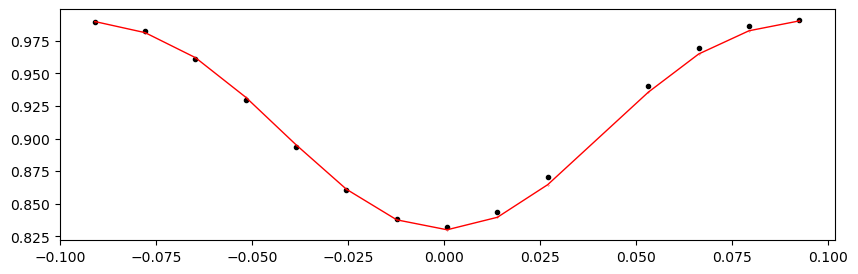

54992.2573768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1189.02it/s]


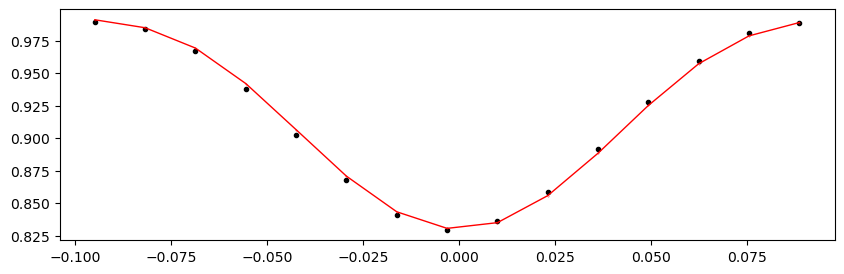

54993.8165868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1199.36it/s]


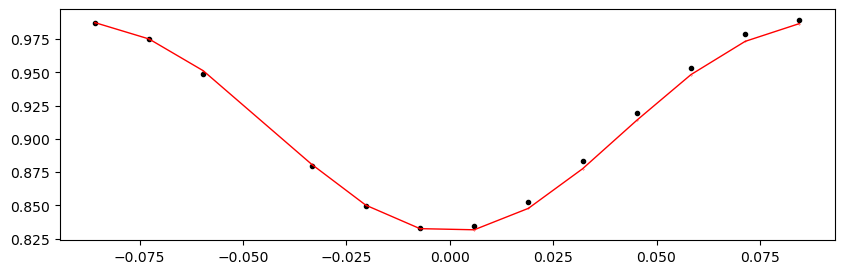

54995.375796895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1229.10it/s]


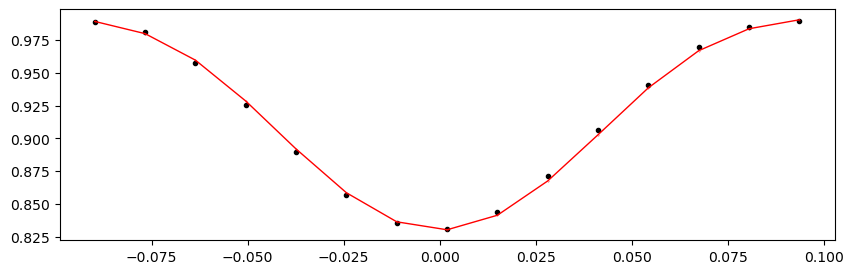

54996.935006895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1226.00it/s]


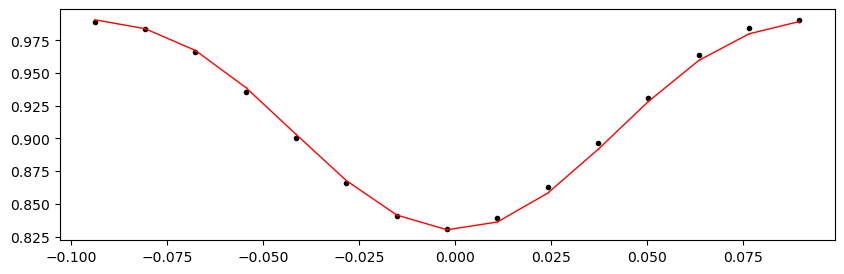

55003.1718468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.58it/s]


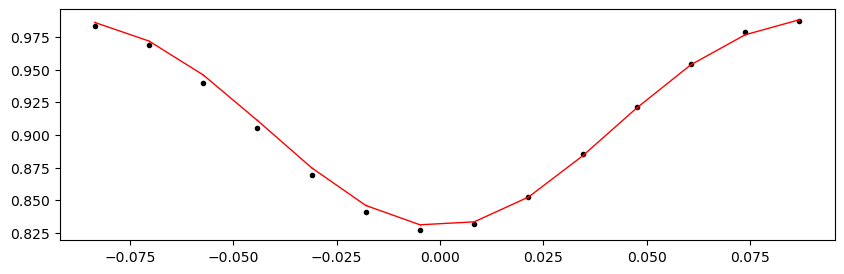

55004.7310568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1237.59it/s]


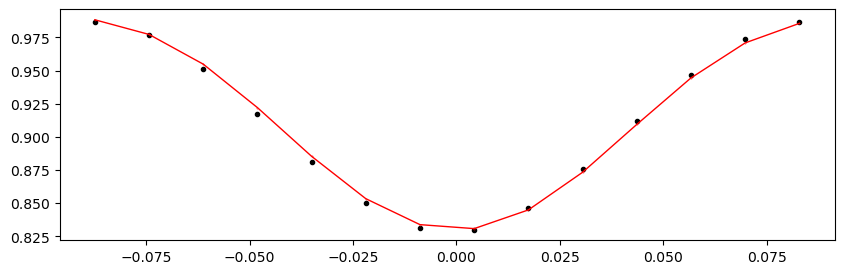

55006.2902668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1234.59it/s]


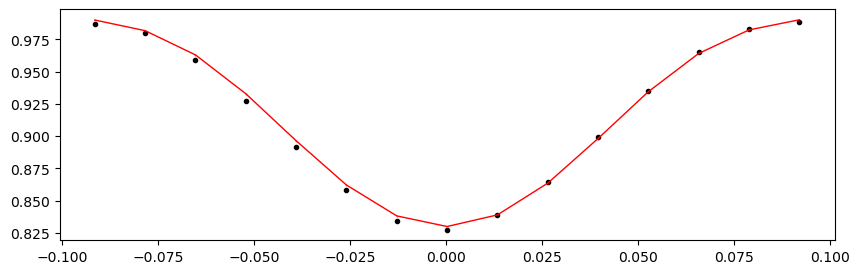

55007.8494768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1223.97it/s]


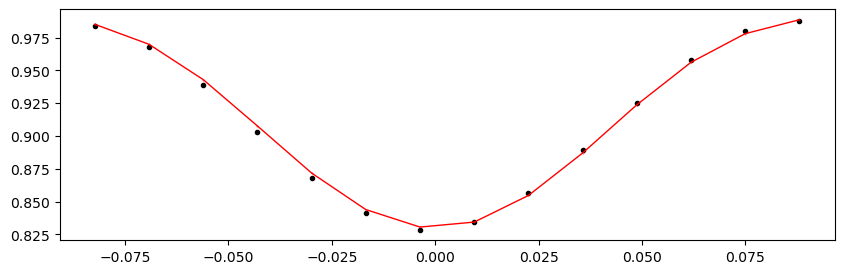

55009.4086868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1201.94it/s]


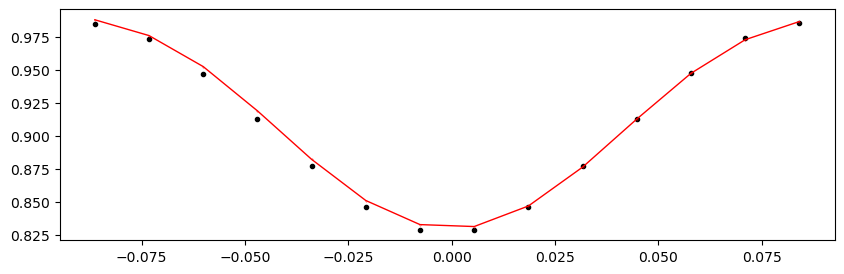

55010.9678968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1197.73it/s]


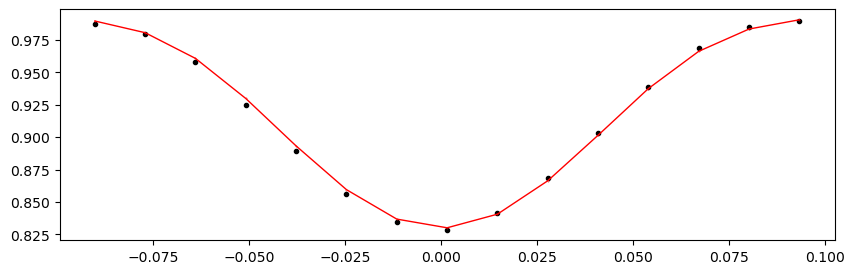

55012.5271068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1191.11it/s]


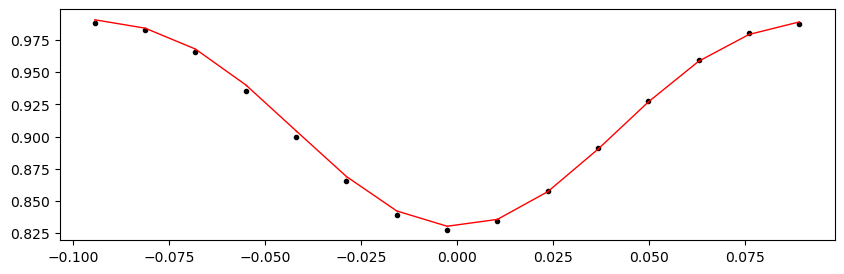

55017.204736895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1235.31it/s]


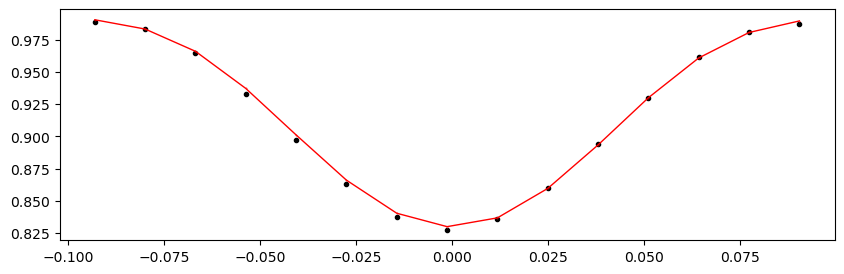

55018.763946895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1241.25it/s]


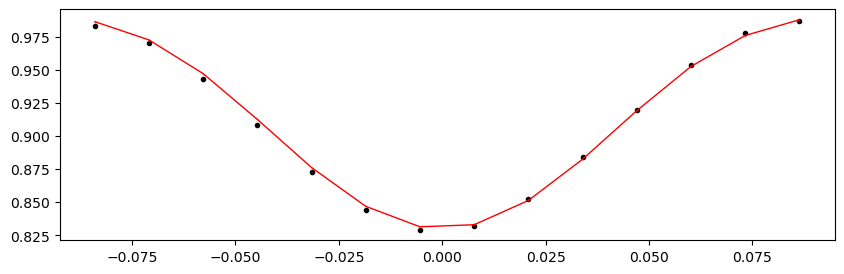

55020.3231568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1236.44it/s]


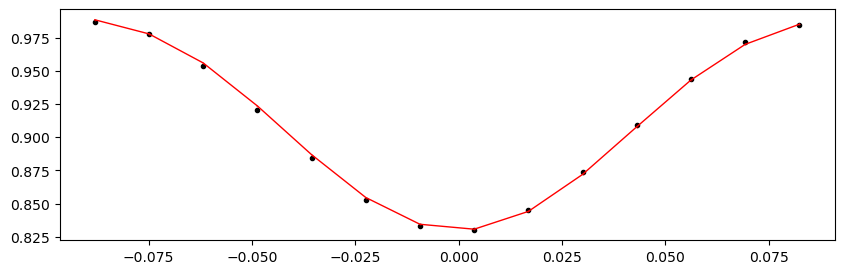

55021.8823668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1200.00it/s]


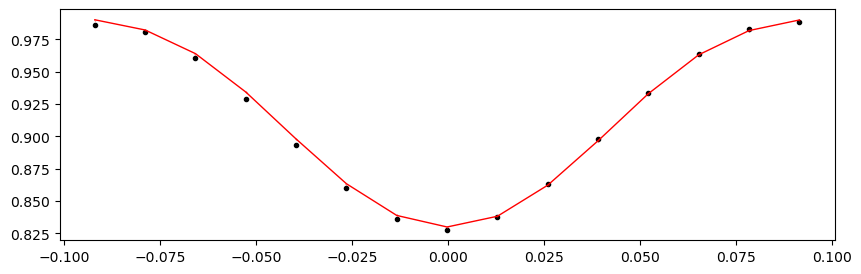

55023.4415768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1165.22it/s]


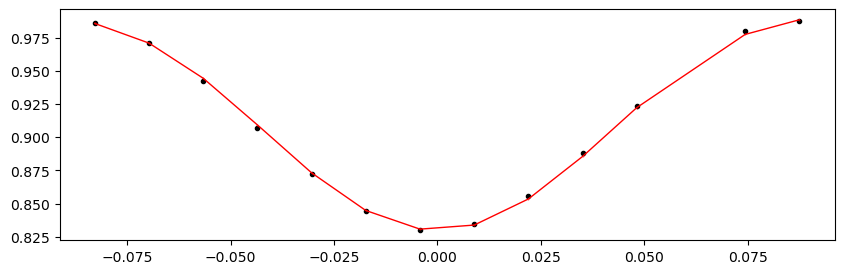

55025.0007868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.29it/s]


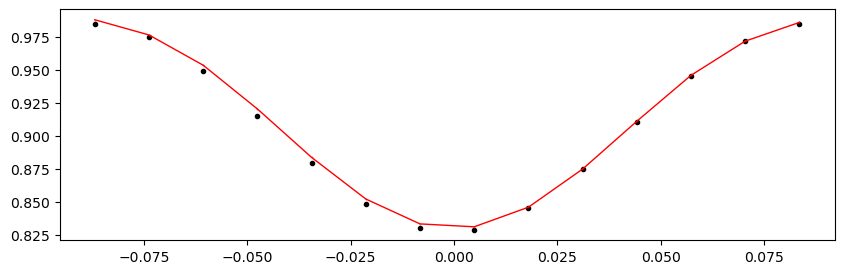

55026.5599968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.07it/s]


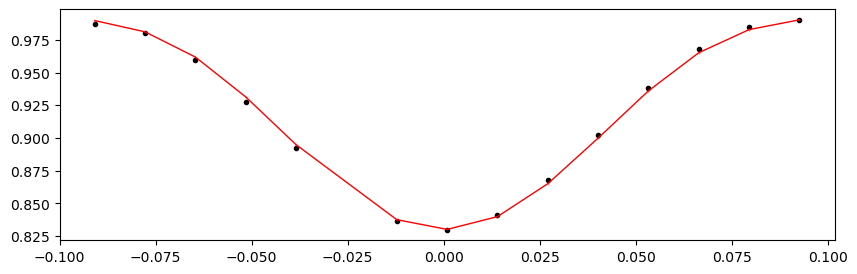

55028.1192068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1146.71it/s]


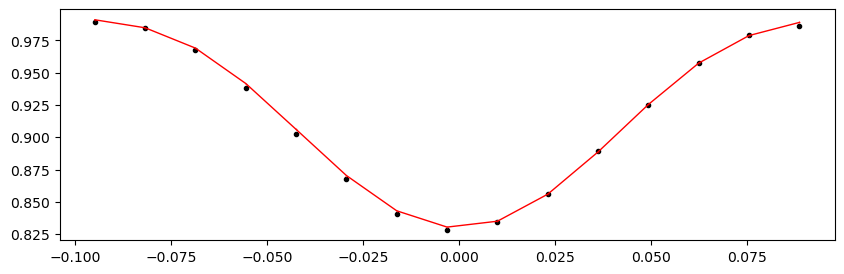

55029.6784168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1216.56it/s]


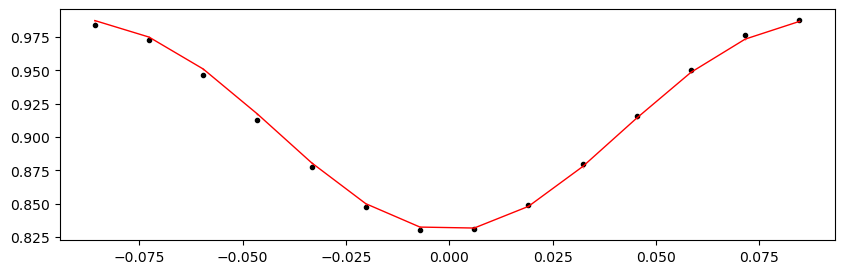

55031.2376268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1189.05it/s]


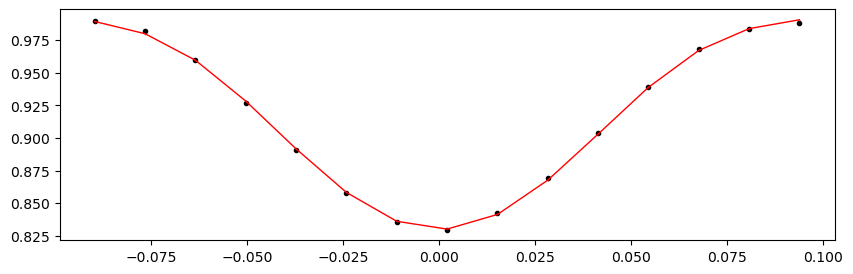

55032.7968368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1213.58it/s]


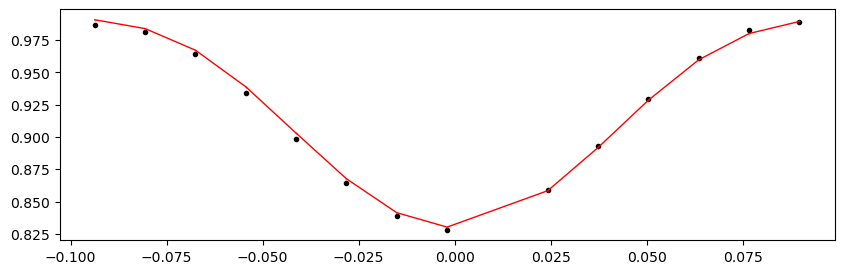

55034.3560468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1183.46it/s]


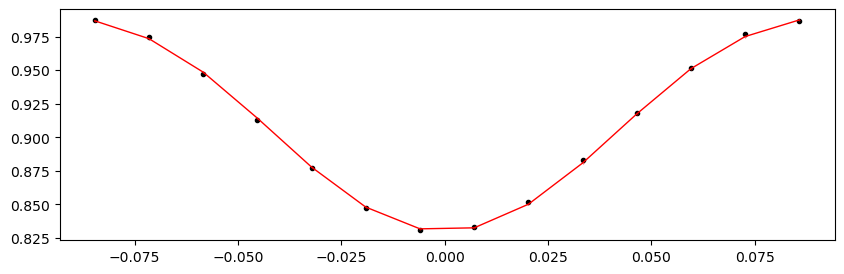

55035.915256895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1193.29it/s]


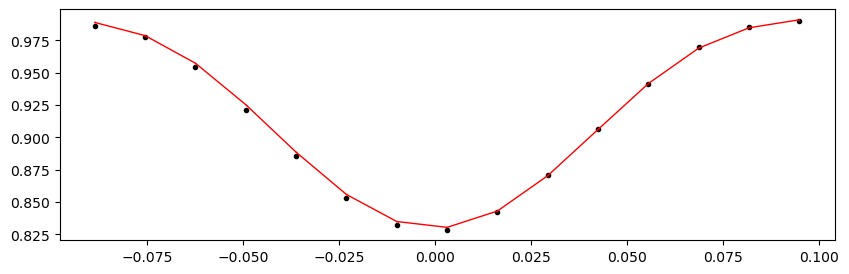

55037.474466895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1213.62it/s]


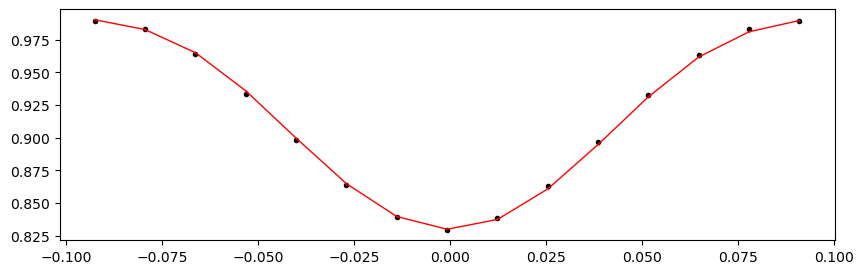

55039.033676895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1187.67it/s]


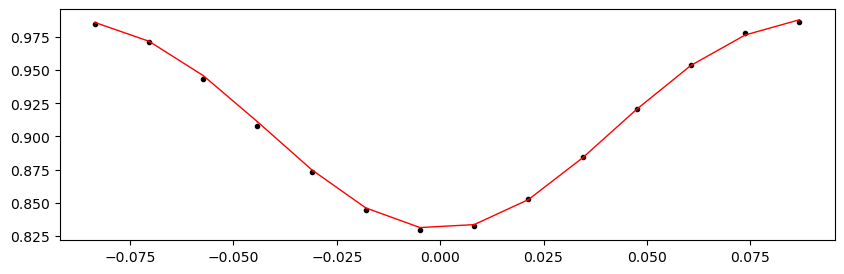

55040.5928868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1231.47it/s]


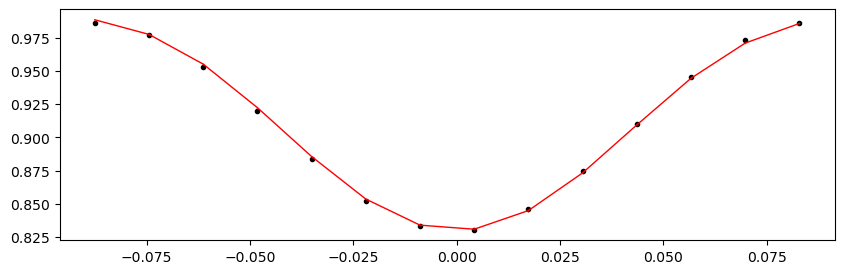

55042.1520968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.75it/s]


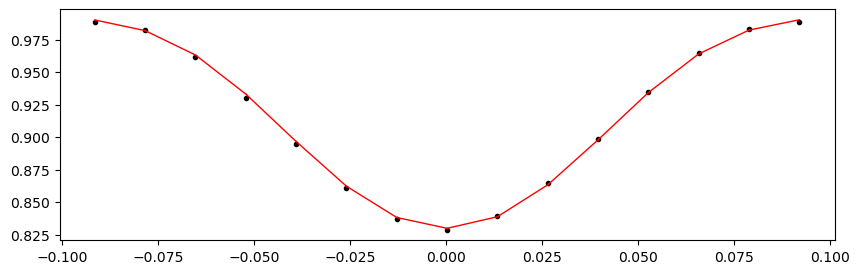

55043.7113068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1239.76it/s]


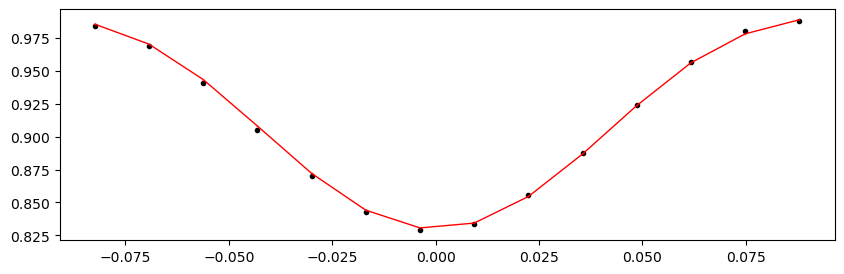

55045.2705168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1245.56it/s]


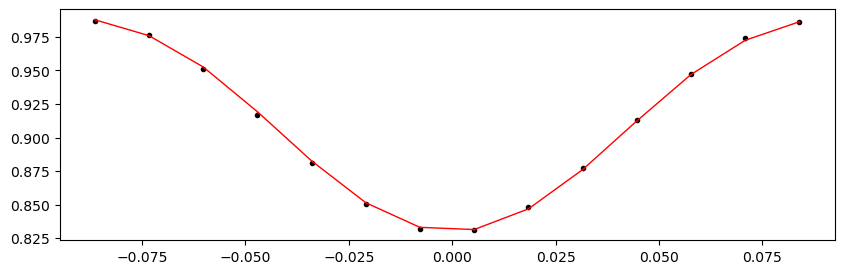

55046.8297268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1193.30it/s]


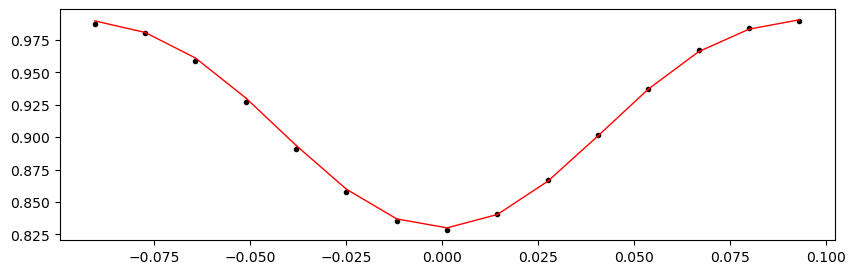

55048.3889368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1215.03it/s]


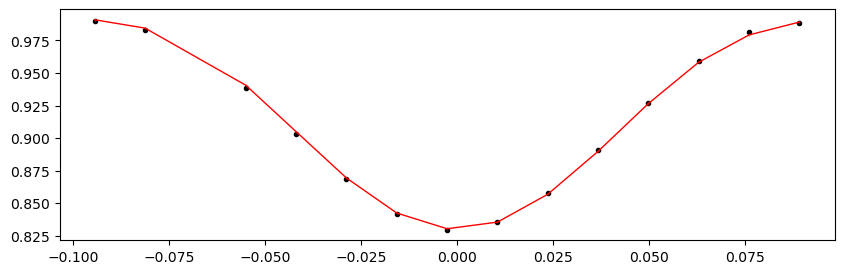

55049.9481468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1191.72it/s]


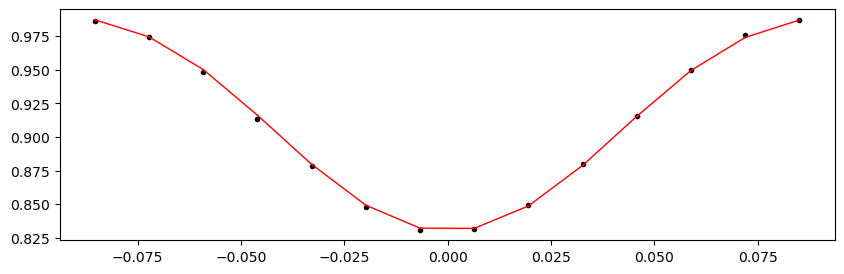

55051.5073568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1191.02it/s]


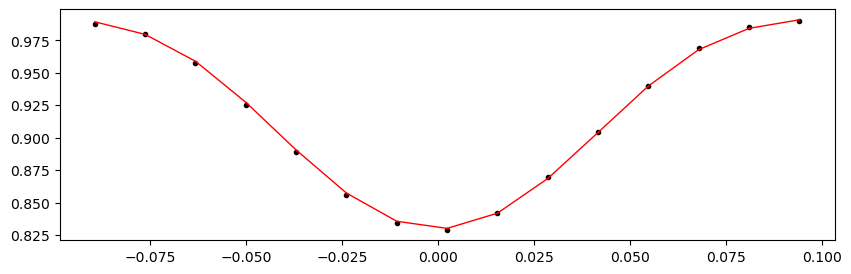

55053.0665668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1194.83it/s]


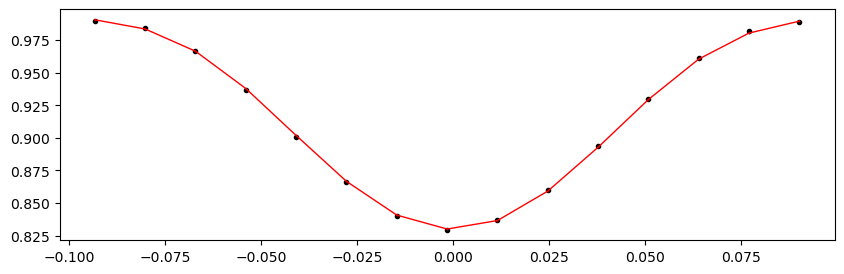

55054.6257768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1187.68it/s]


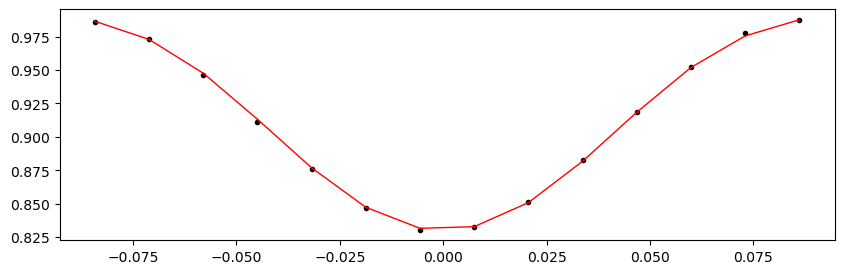

55057.744196895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1209.68it/s]


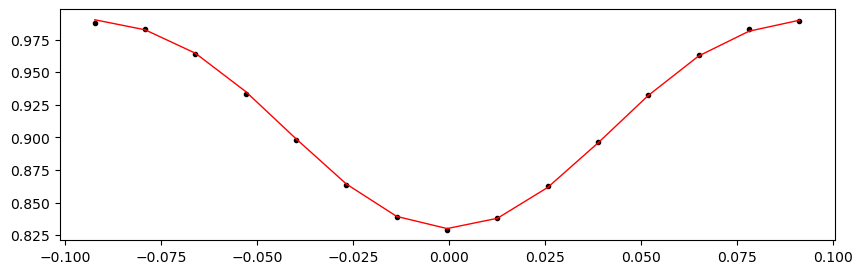

55060.8626168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1203.63it/s]


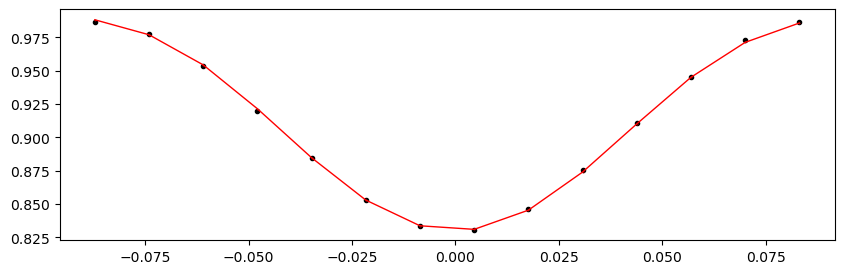

55062.4218268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1210.66it/s]


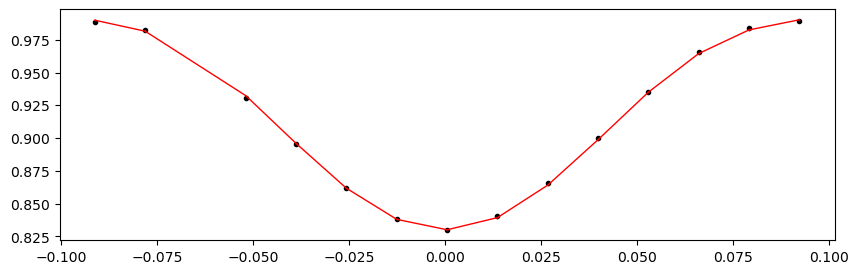

55065.5402468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1225.90it/s]


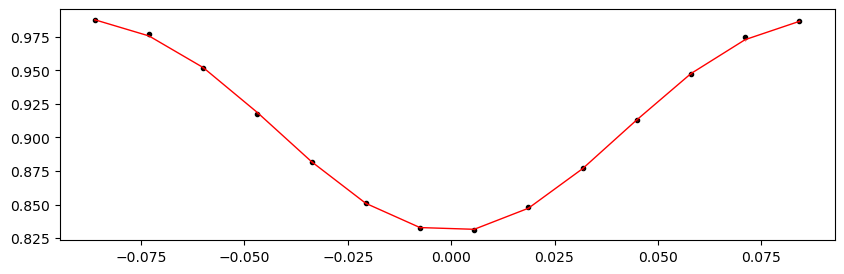

55067.0994568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1172.34it/s]


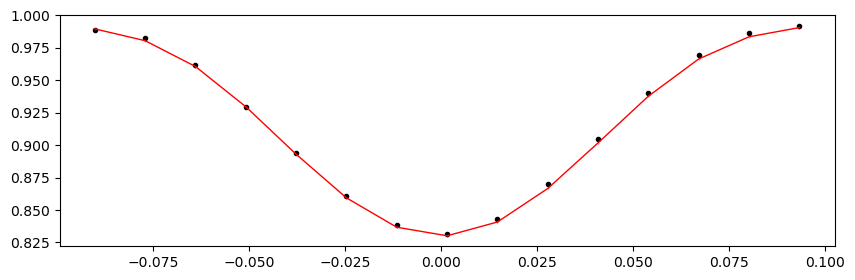

55068.6586668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1199.76it/s]


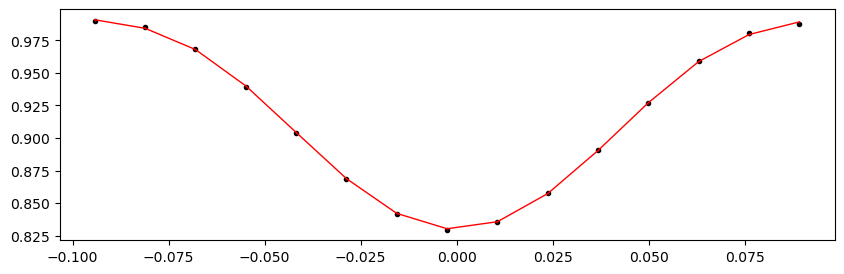

55070.2178768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1210.49it/s]


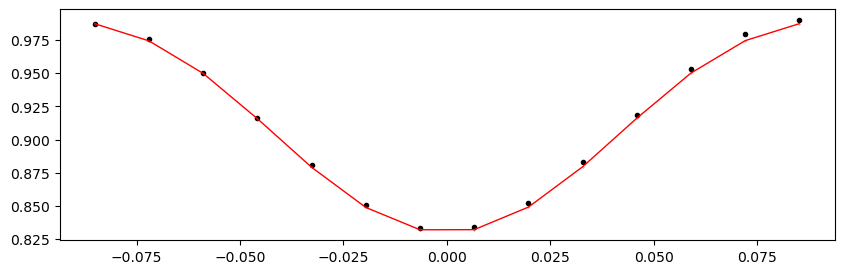

55071.7770868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.05it/s]


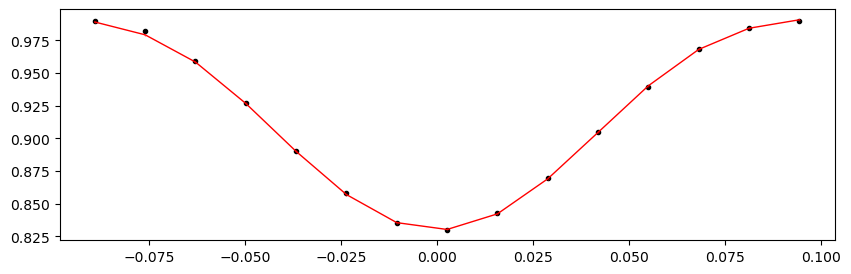

55073.3362968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1188.29it/s]


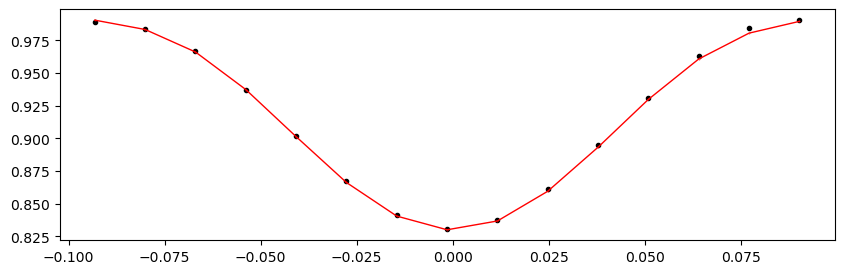

55074.8955068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1177.60it/s]


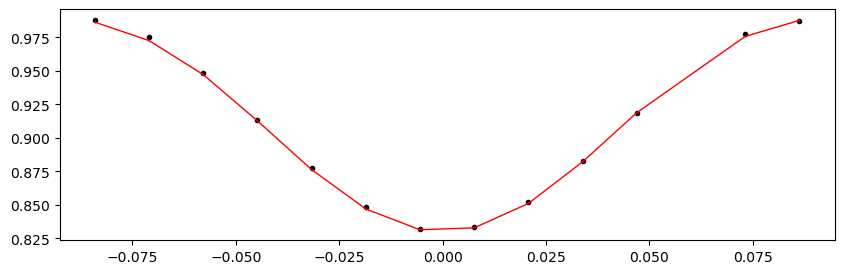

55076.454716895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1181.89it/s]


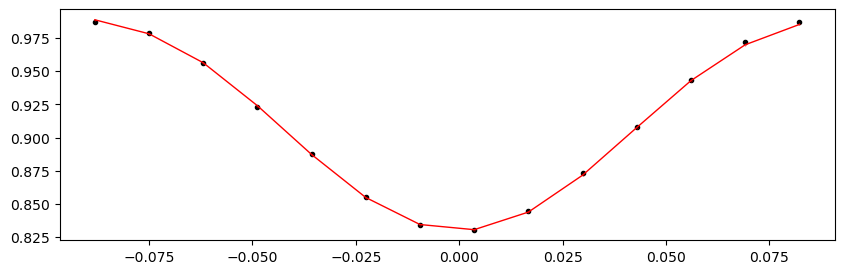

55078.013926895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1180.65it/s]


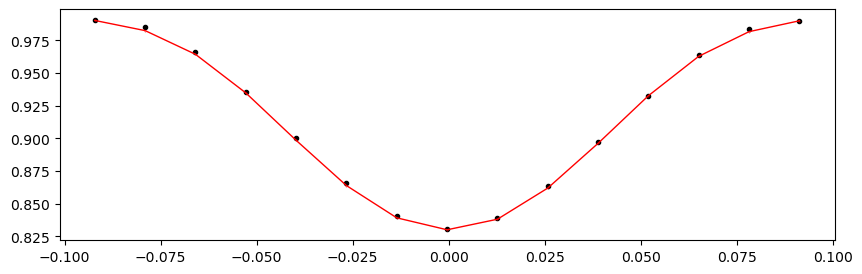

55079.573136895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1196.15it/s]


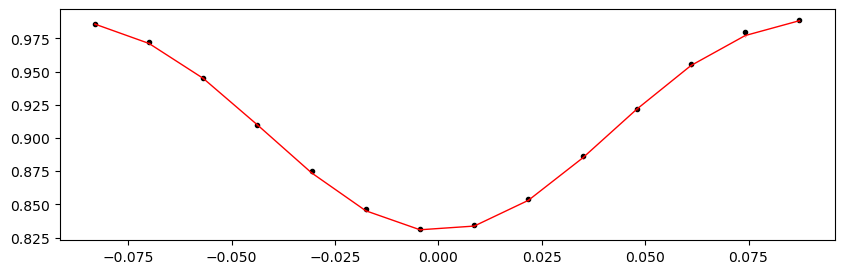

55081.1323468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1196.22it/s]


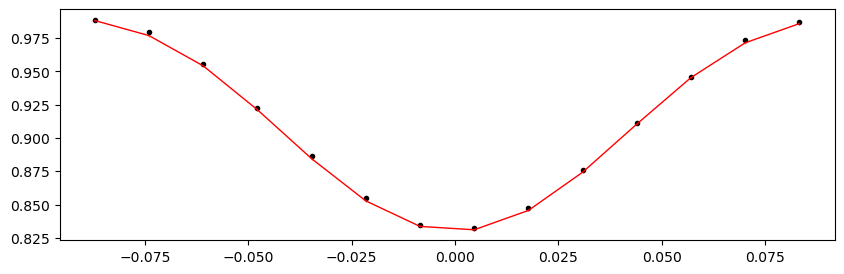

55082.6915568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1184.26it/s]


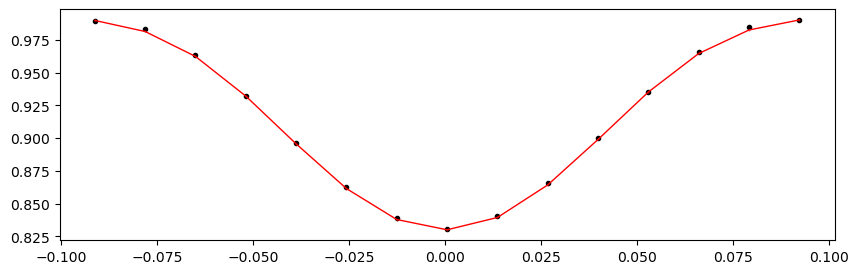

55084.2507668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1196.10it/s]


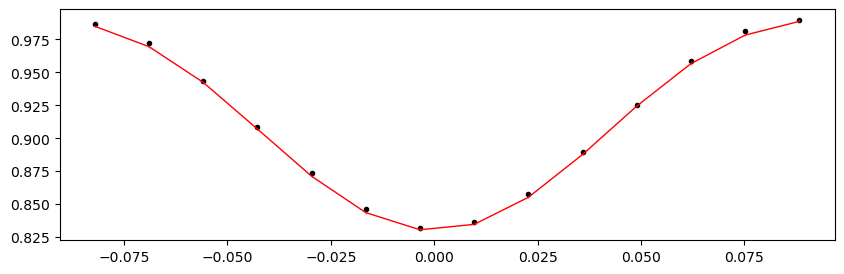

55085.8099768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1216.41it/s]


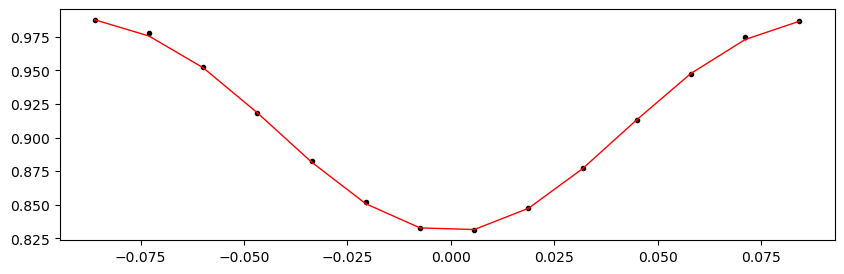

55087.3691868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1207.99it/s]


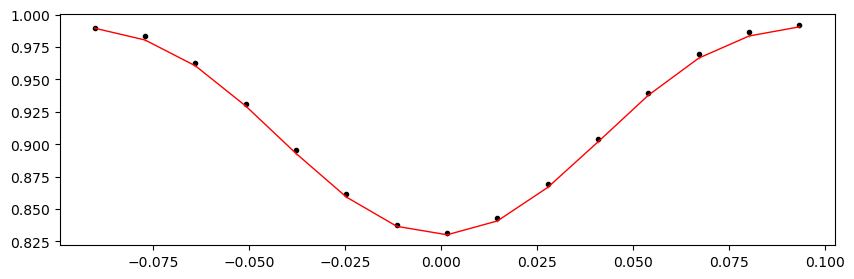

55090.4876068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1181.43it/s]


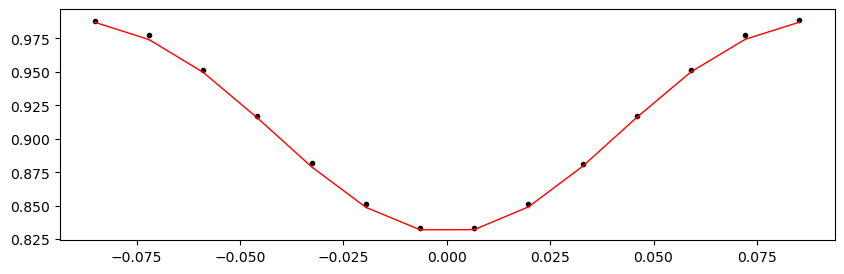

55093.6060268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1165.50it/s]


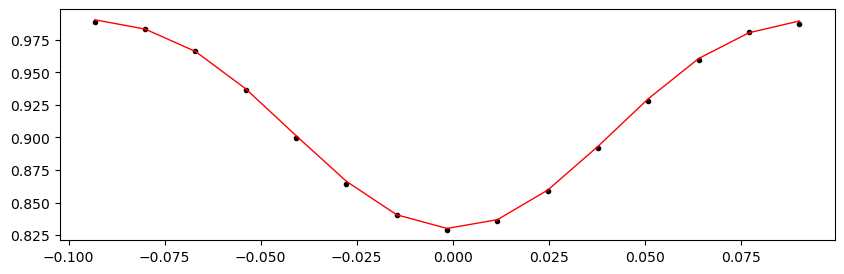

55095.1652368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1217.20it/s]


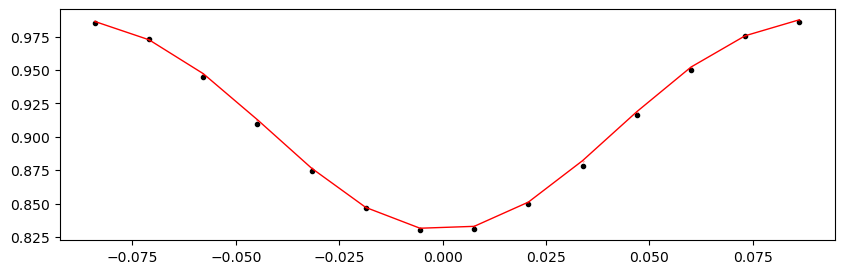

55096.724446895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1157.23it/s]


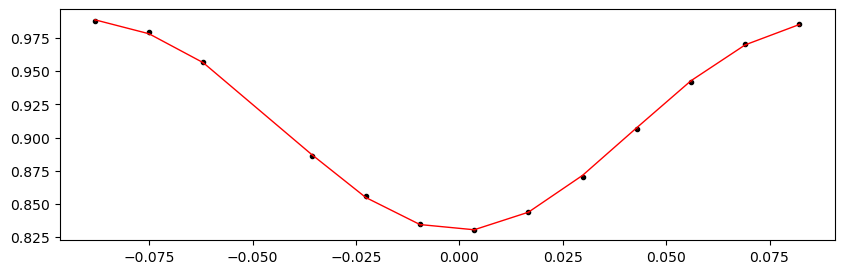

55098.283656895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1212.94it/s]


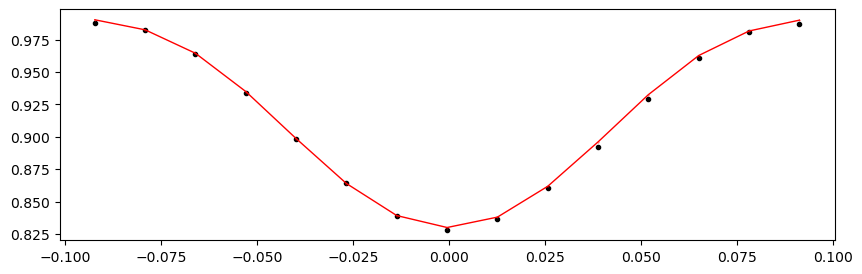

55101.4020768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.00it/s]


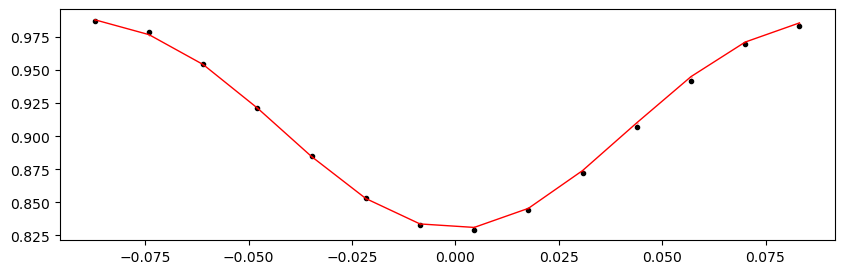

55102.9612868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1323.77it/s]


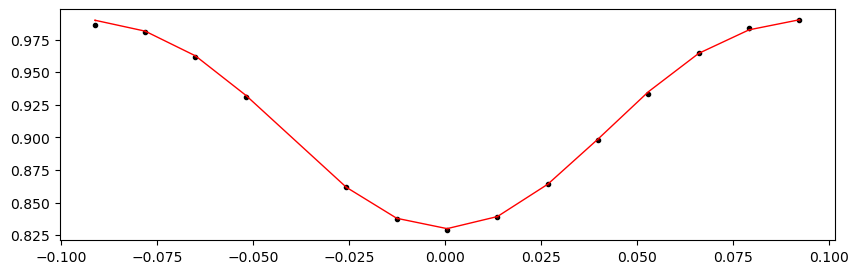

55104.5204968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.91it/s]


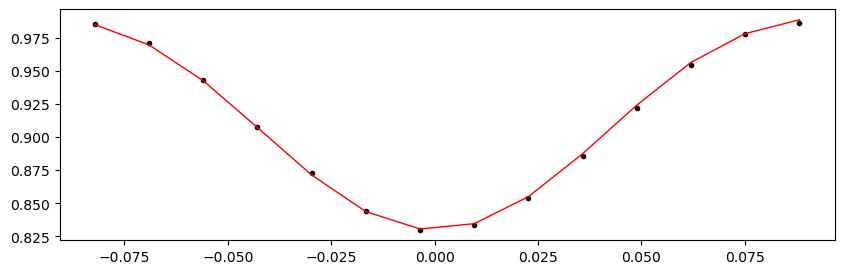

55106.0797068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.71it/s]


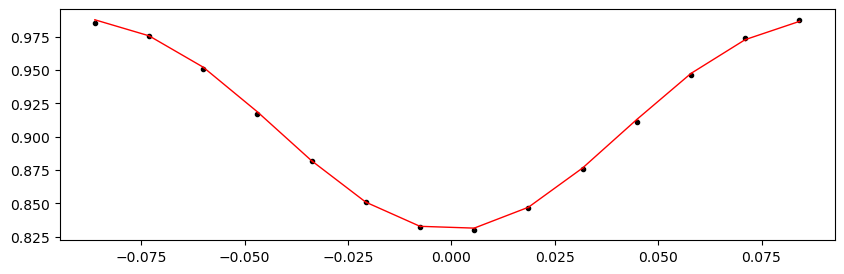

55107.6389168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.56it/s]


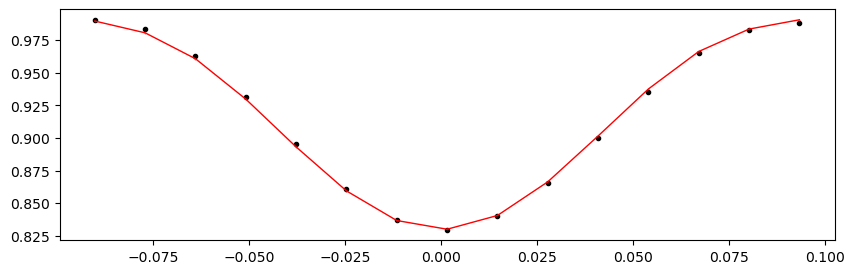

55109.1981268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.06it/s]


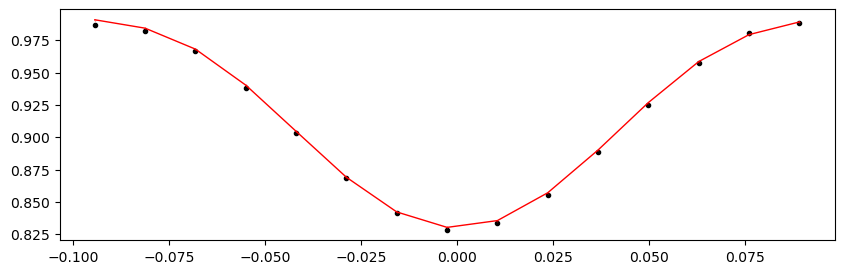

55110.7573368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.51it/s]


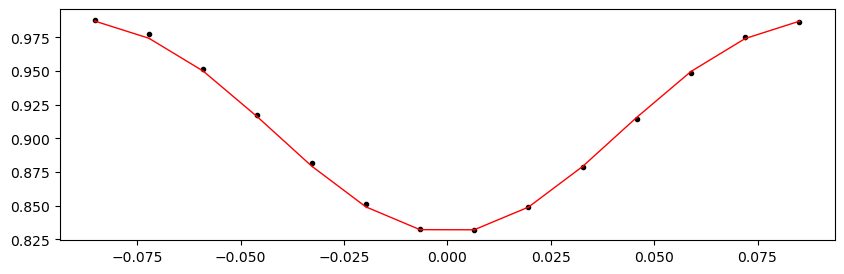

55112.3165468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1329.79it/s]


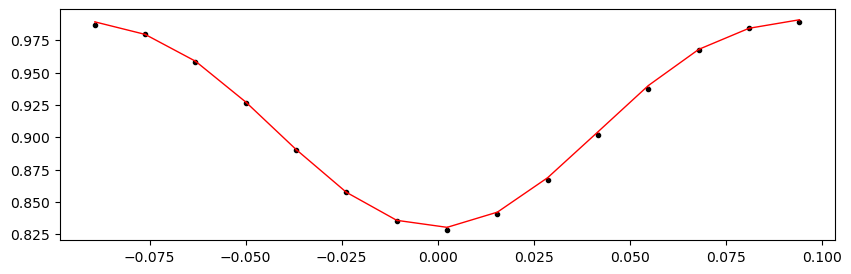

55115.4349668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.61it/s]


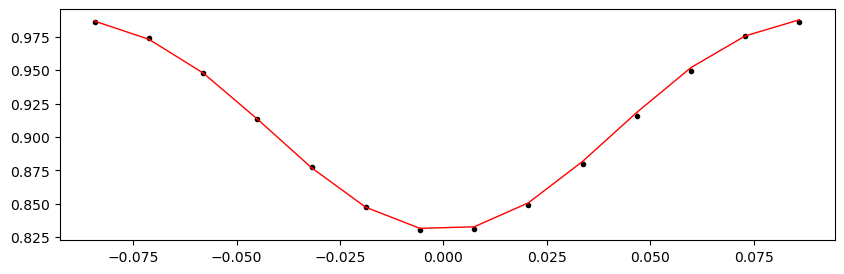

55116.994176895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.69it/s]


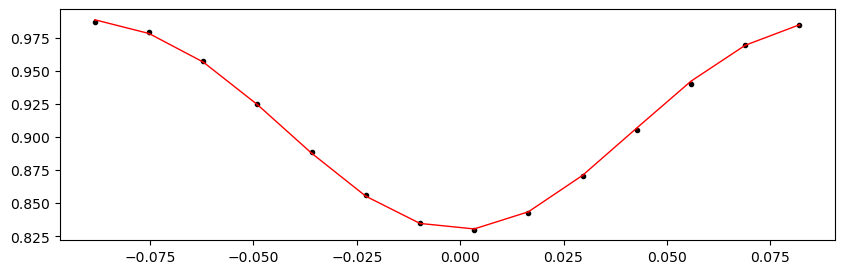

55118.553386895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1051.52it/s]


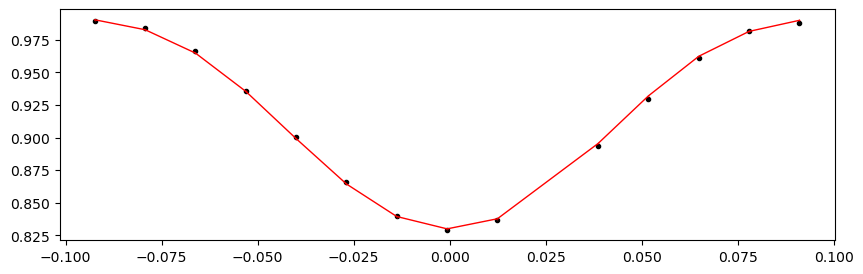

55120.112596895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1083.38it/s]


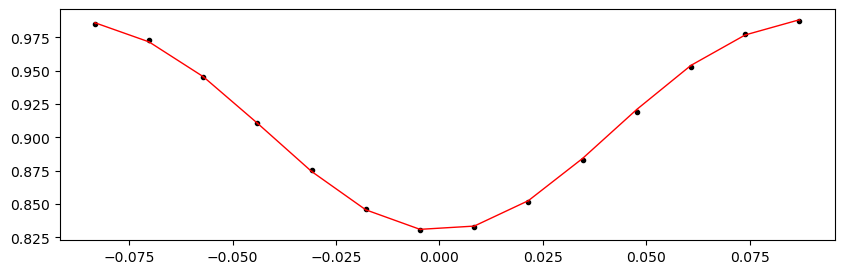

55121.6718068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.57it/s]


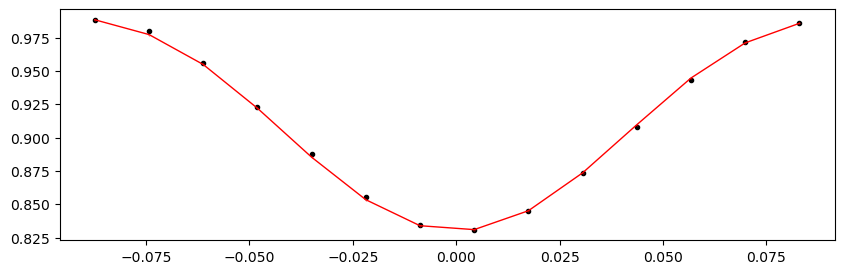

55124.7902268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.54it/s]


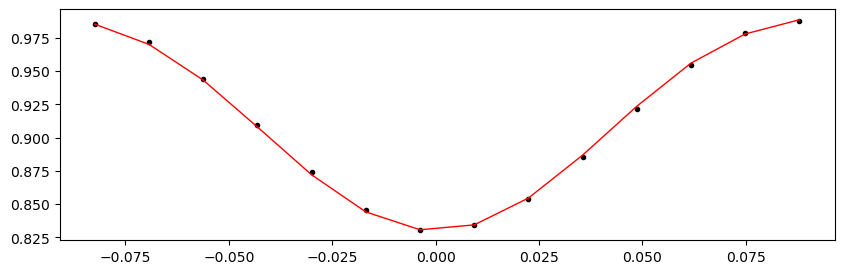

55126.3494368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1298.66it/s]


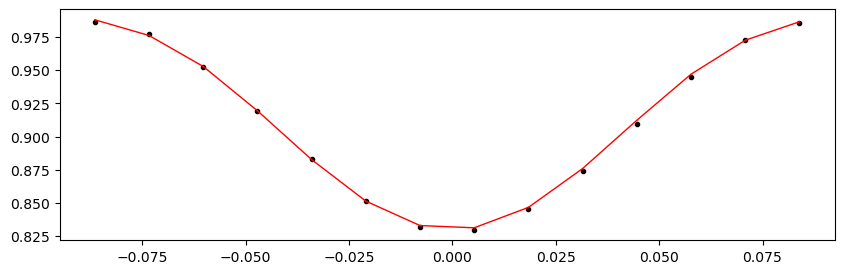

55127.9086468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1316.99it/s]


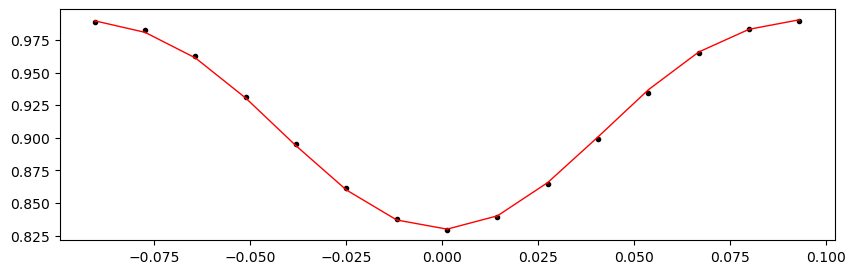

55129.4678568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.27it/s]


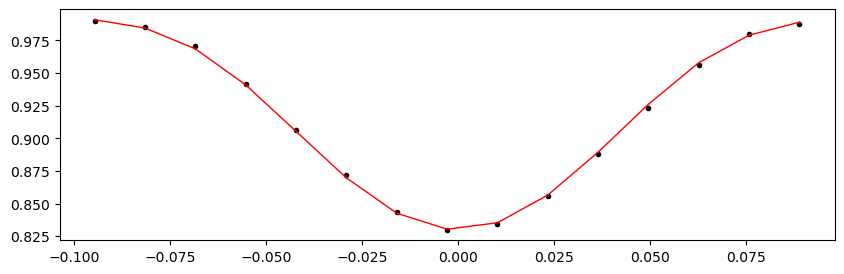

55131.0270668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1272.29it/s]


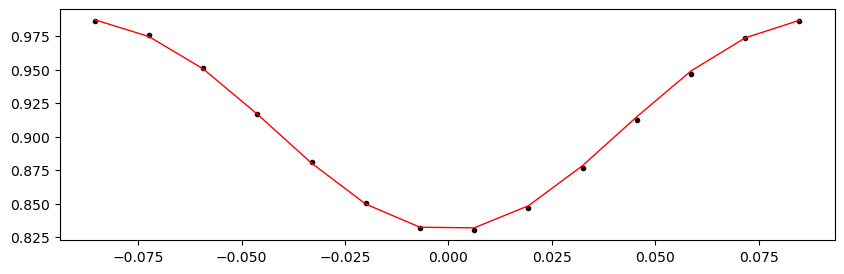

55132.5862768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1310.66it/s]


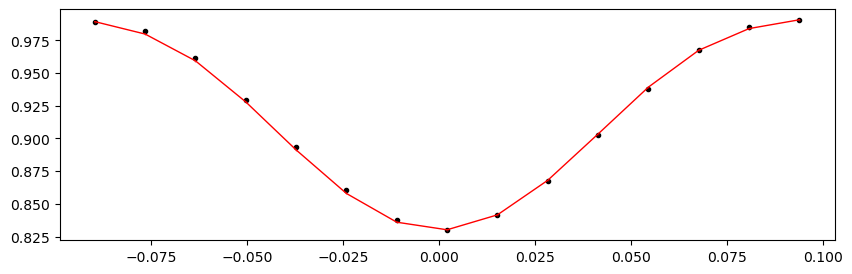

55134.1454868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1307.22it/s]


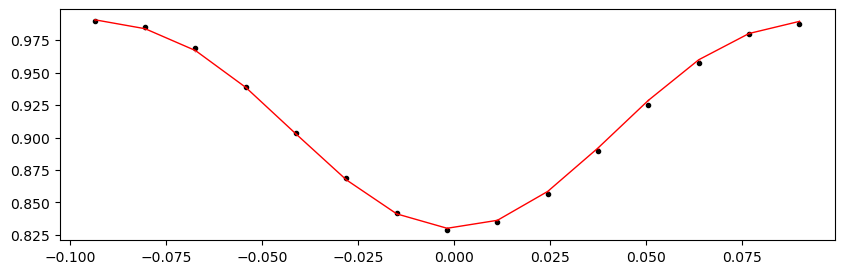

55135.7046968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1268.60it/s]


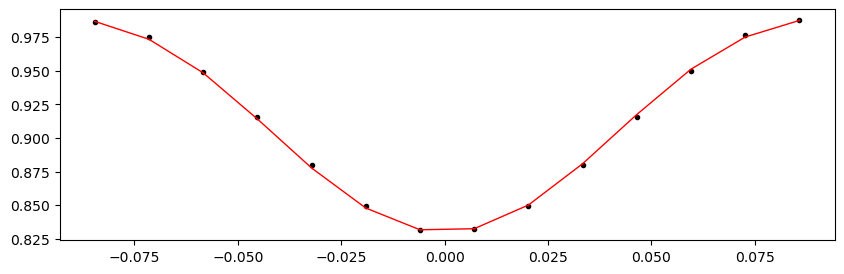

55137.263906895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1328.82it/s]


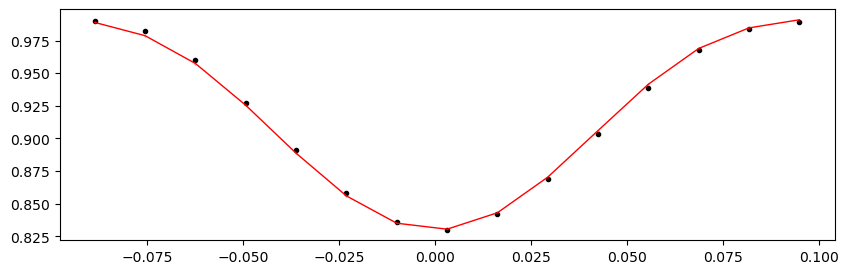

55138.823116895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.50it/s]


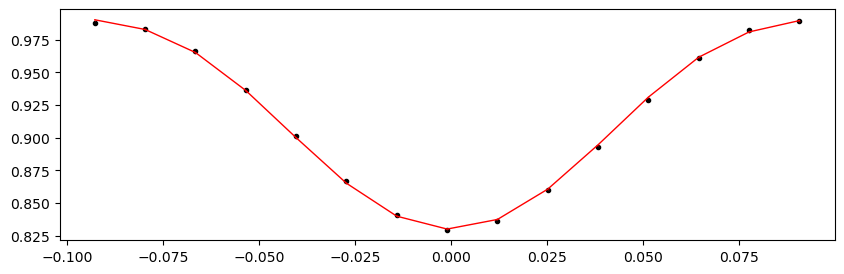

55140.382326895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1321.85it/s]


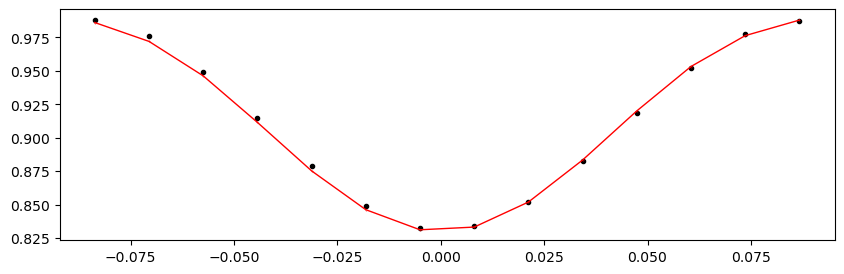

55141.9415368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.36it/s]


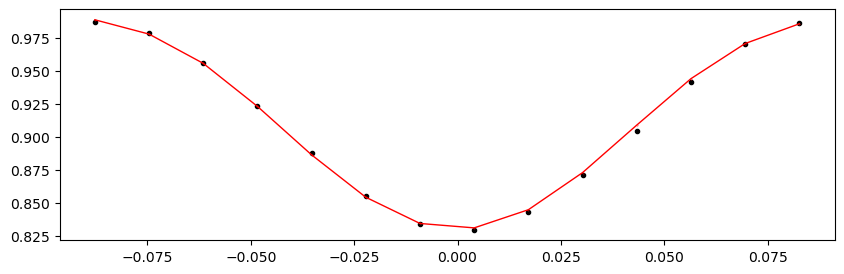

55143.5007468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.99it/s]


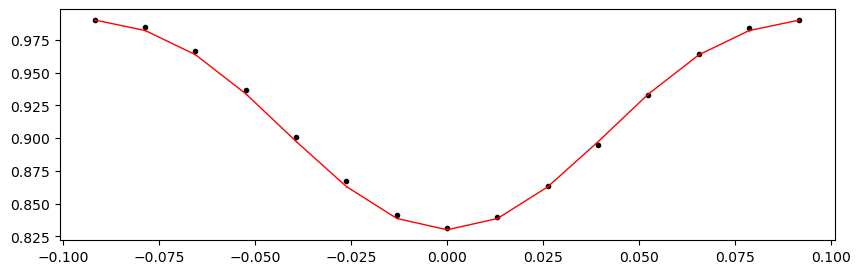

55145.0599568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.71it/s]


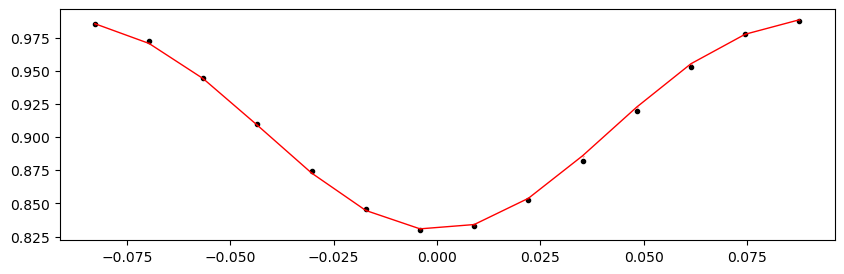

55146.6191668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.58it/s]


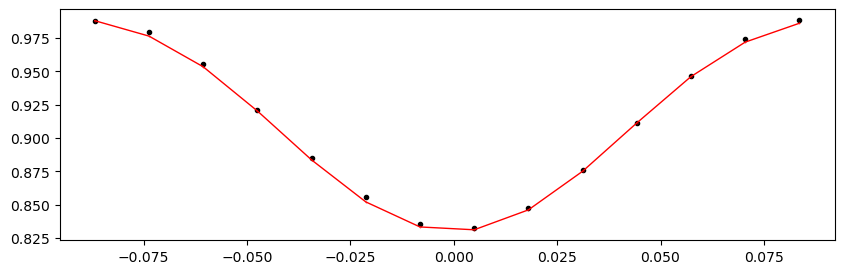

55148.1783768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.97it/s]


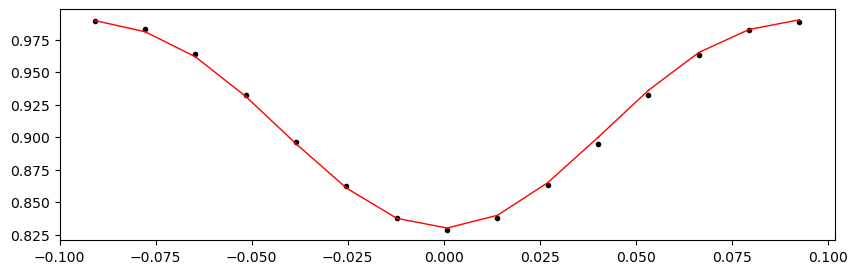

55149.7375868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.83it/s]


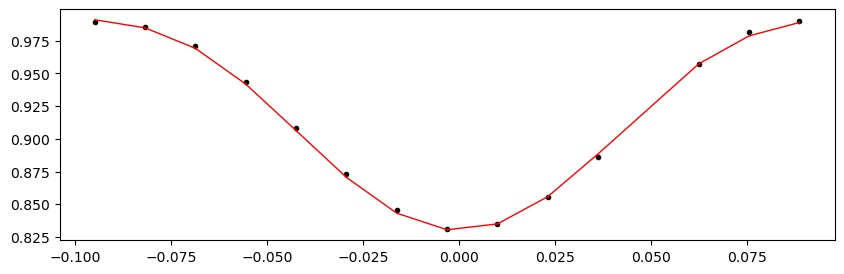

55151.2967968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.86it/s]


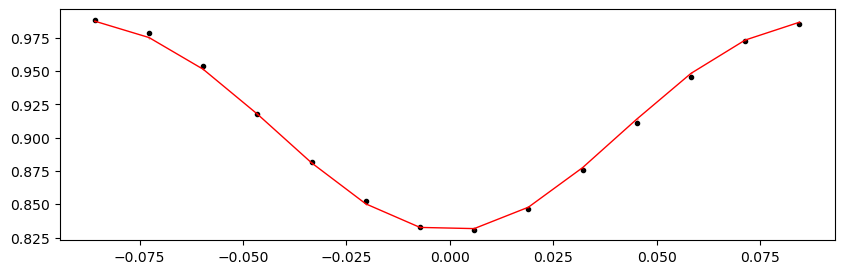

55152.8560068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.97it/s]


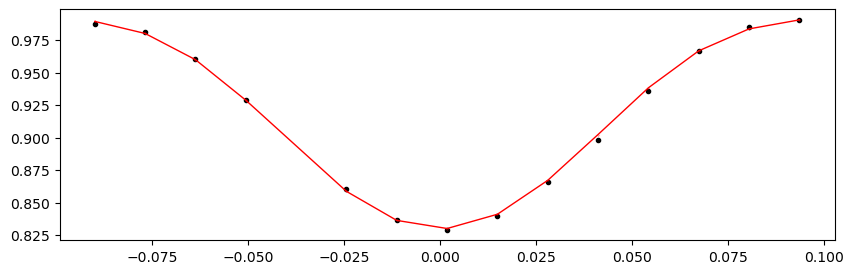

55157.533636895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.74it/s]


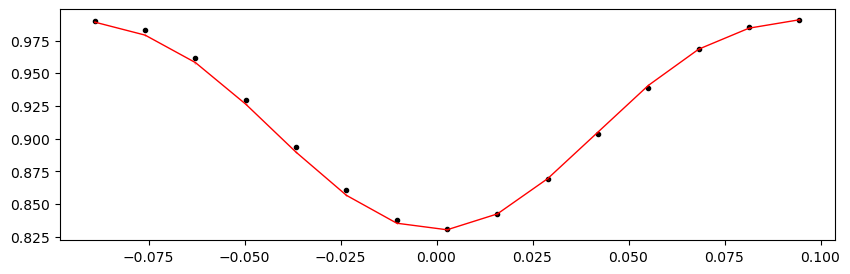

55159.092846895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.97it/s]


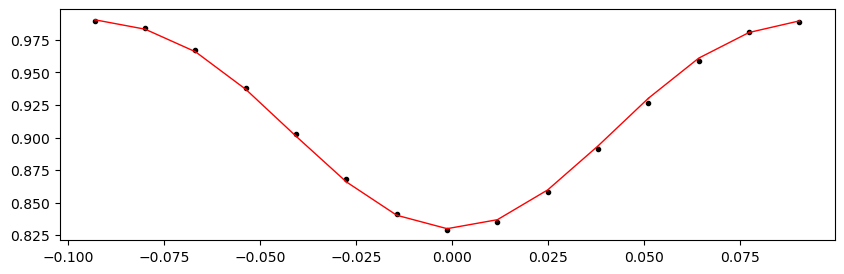

55160.652056895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1314.83it/s]


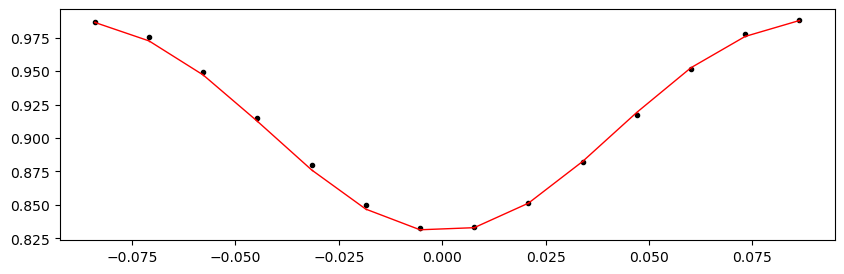

55162.2112668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.42it/s]


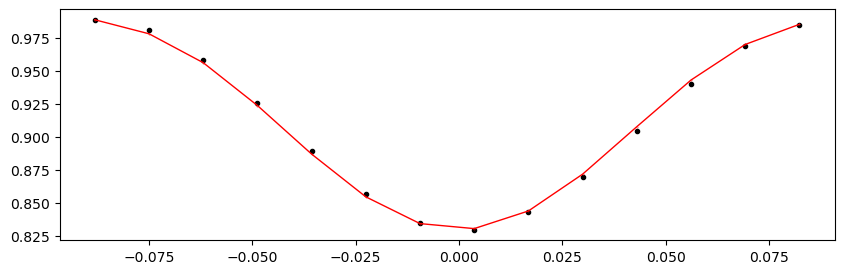

55163.7704768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.90it/s]


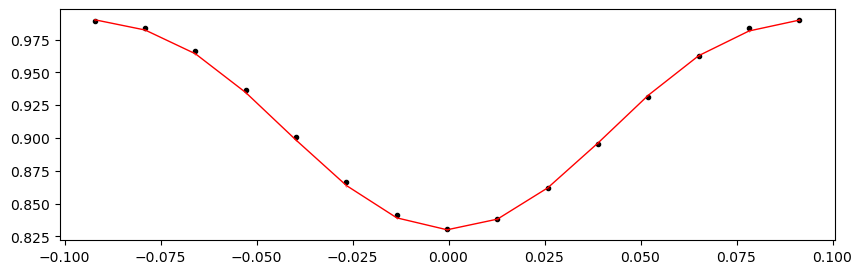

55165.3296868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.23it/s]


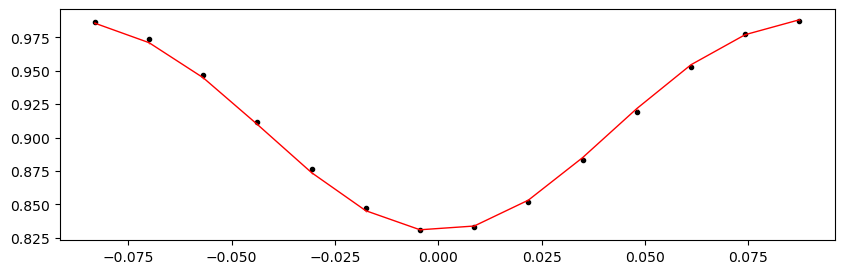

55166.8888968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1329.65it/s]


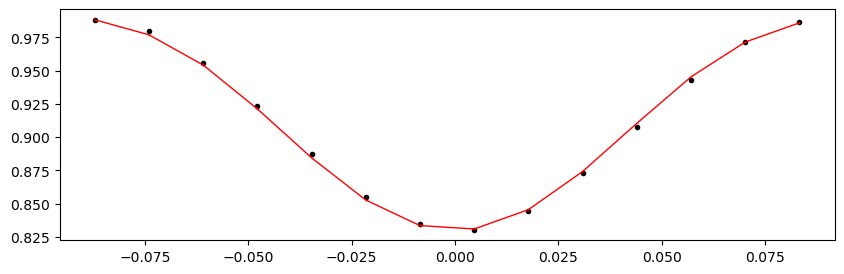

55168.4481068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1322.73it/s]


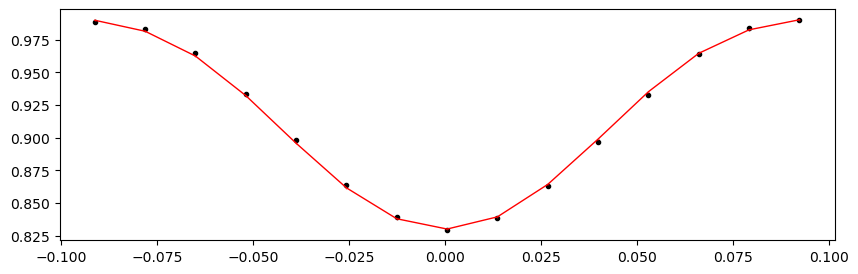

55170.0073168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1312.35it/s]


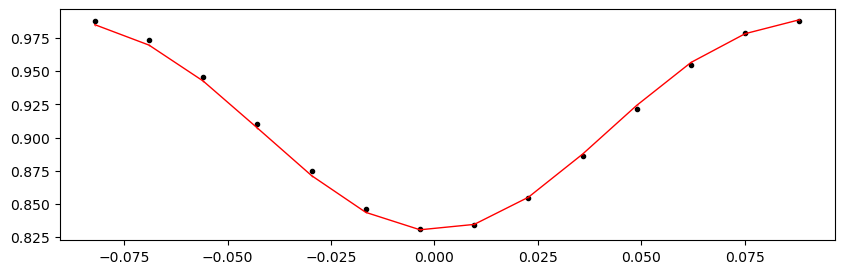

55171.5665268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.19it/s]


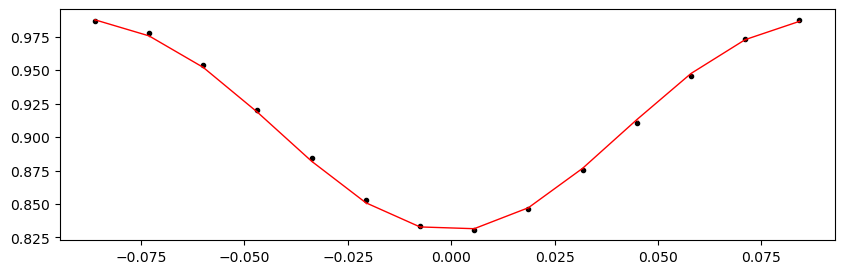

55173.1257368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.40it/s]


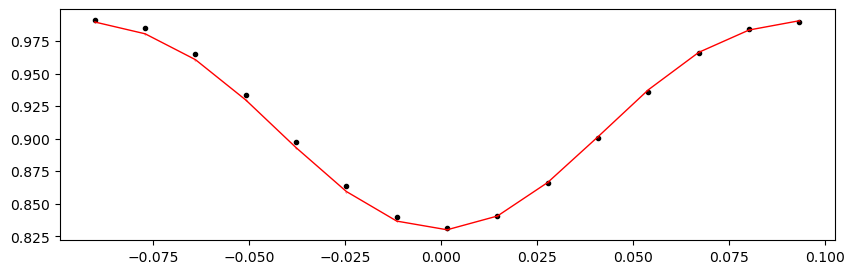

55174.6849468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.98it/s]


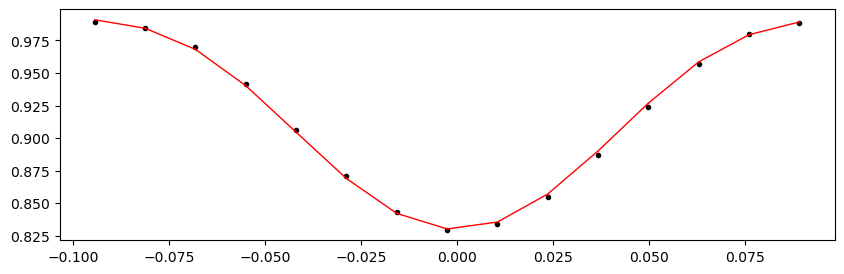

55176.2441568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.46it/s]


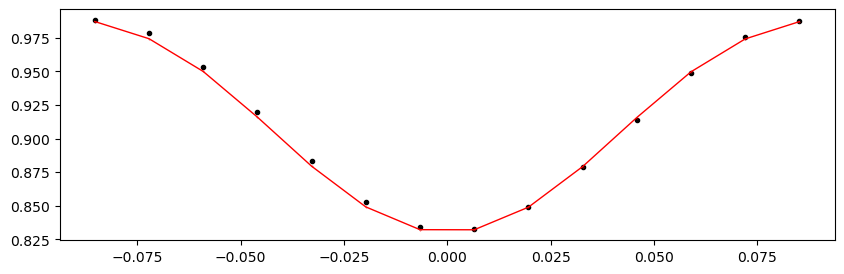

55177.803366895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.53it/s]


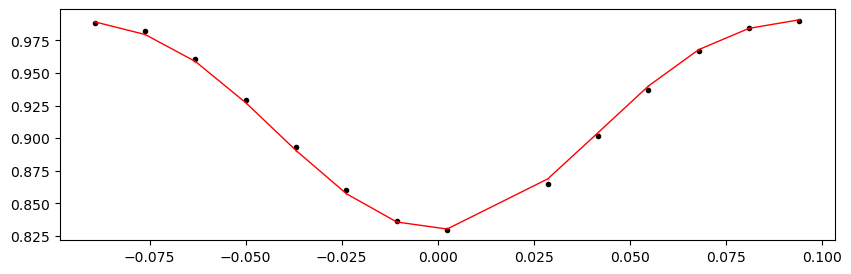

55179.362576895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.46it/s]


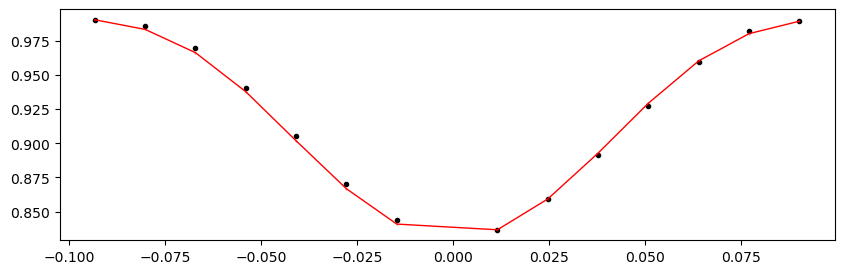

55180.921786895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.25it/s]


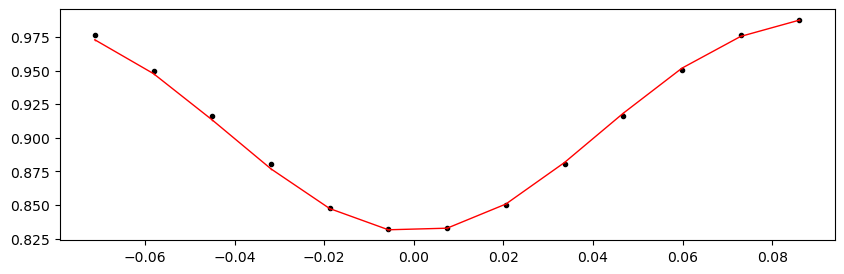

55185.5994168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.73it/s]


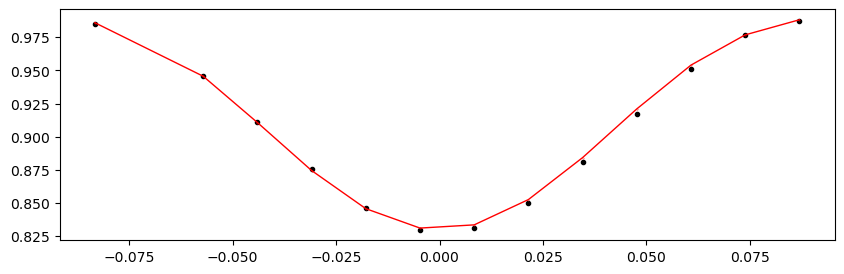

55187.1586268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.16it/s]


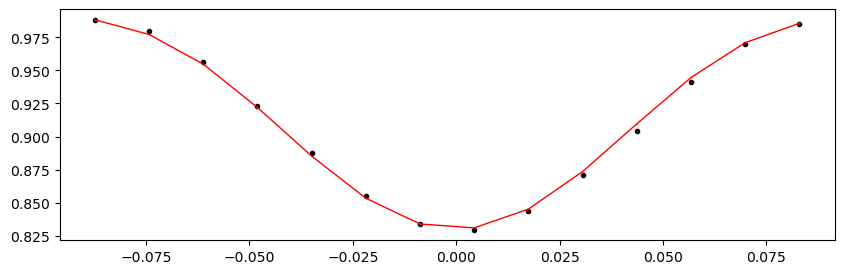

55188.7178368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.31it/s]


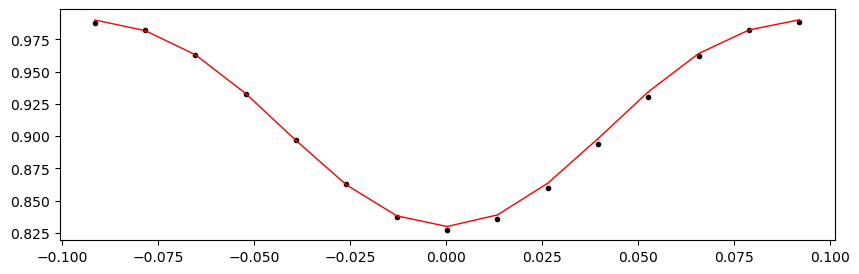

55190.2770468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.58it/s]


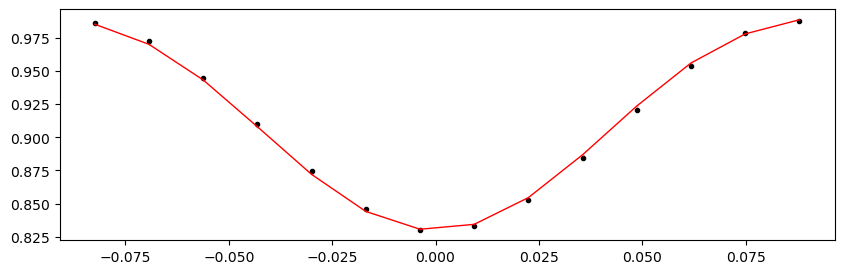

55191.8362568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.22it/s]


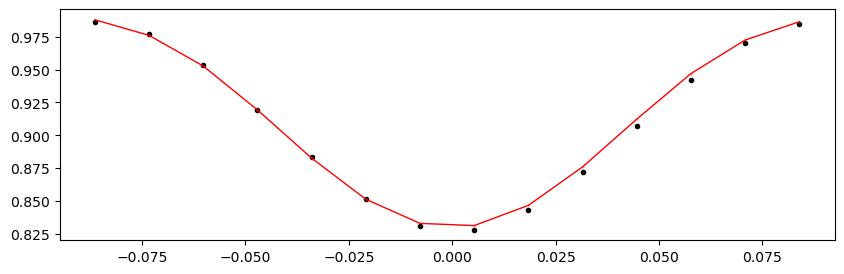

55193.3954668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.14it/s]


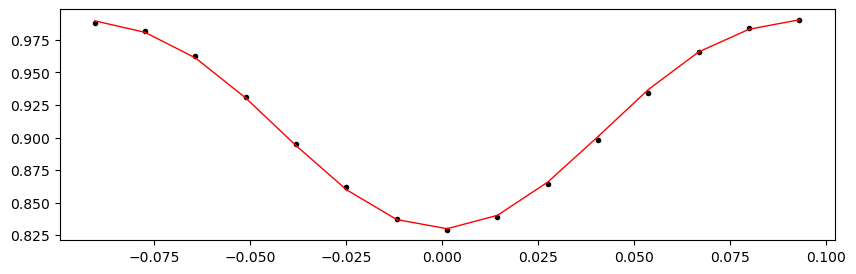

55194.9546768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.42it/s]


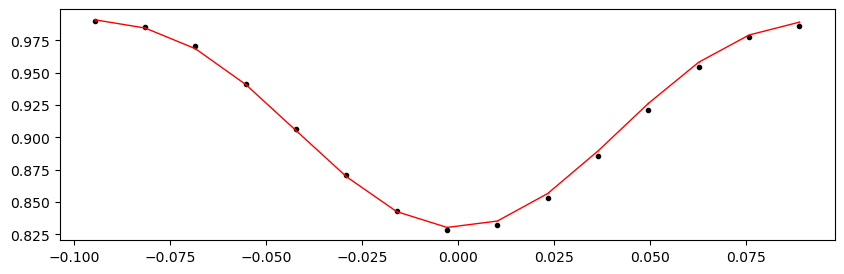

55196.5138868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1301.29it/s]


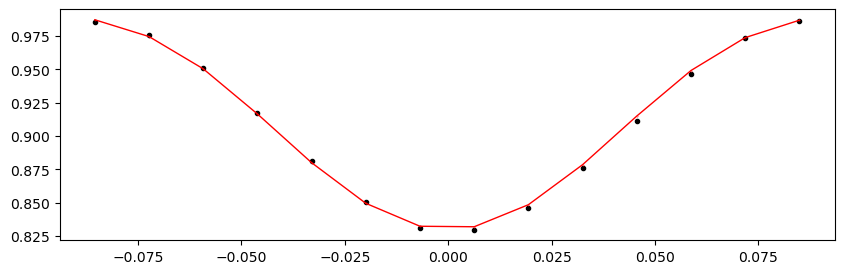

55198.073096895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.09it/s]


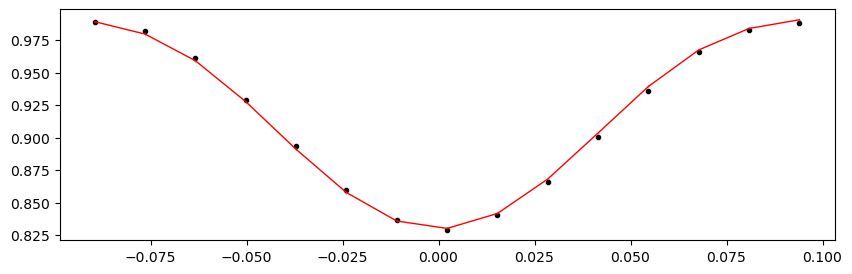

55199.632306895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.94it/s]


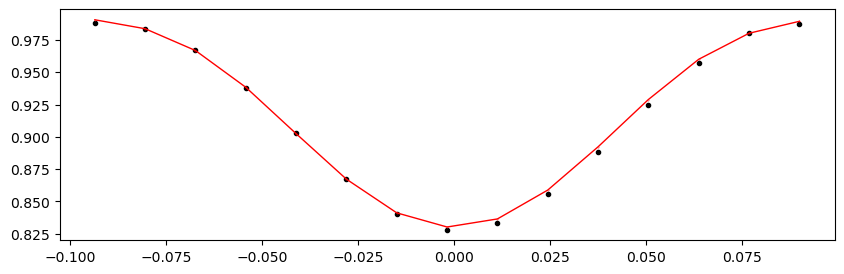

55201.191516895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.09it/s]


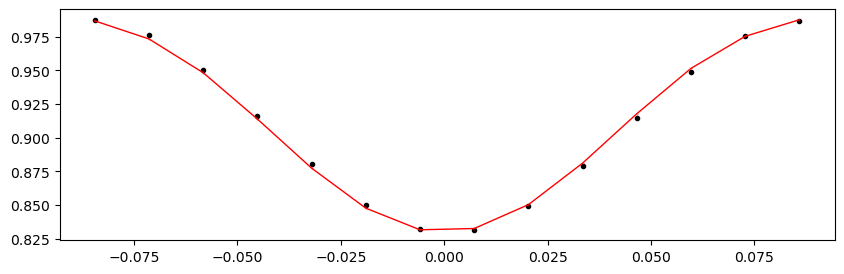

55202.7507268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.50it/s]


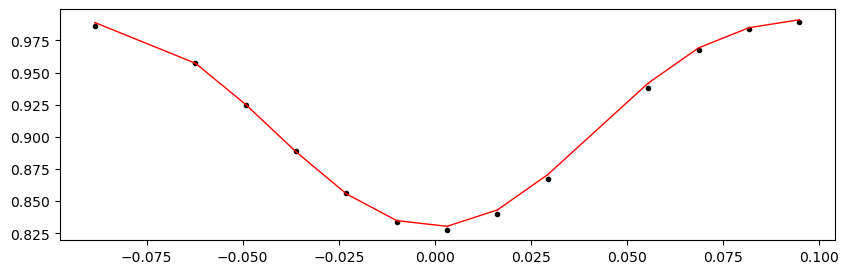

55204.3099368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.21it/s]


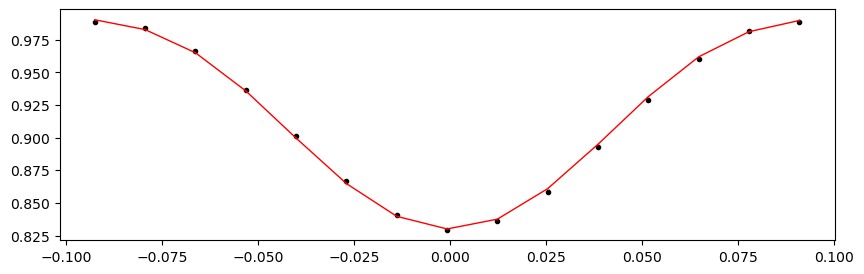

55207.4283568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.44it/s]


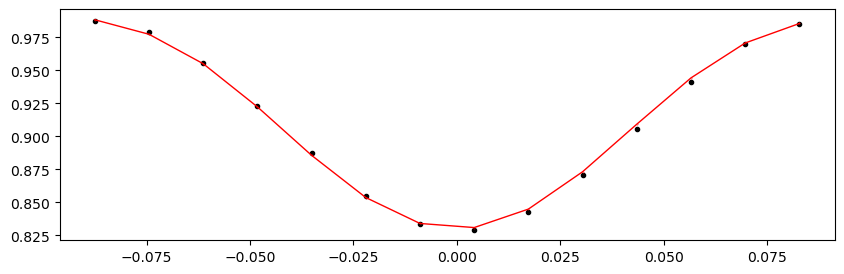

55208.9875668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.80it/s]


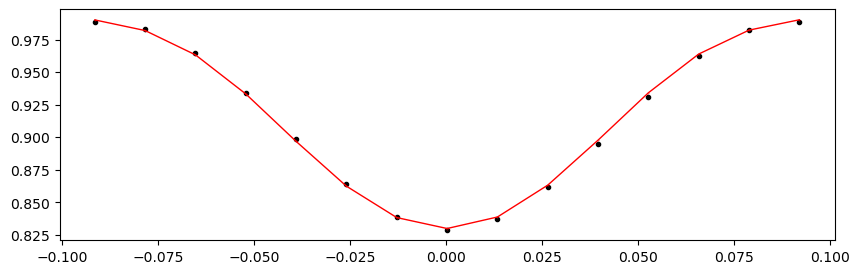

55210.5467768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1318.41it/s]


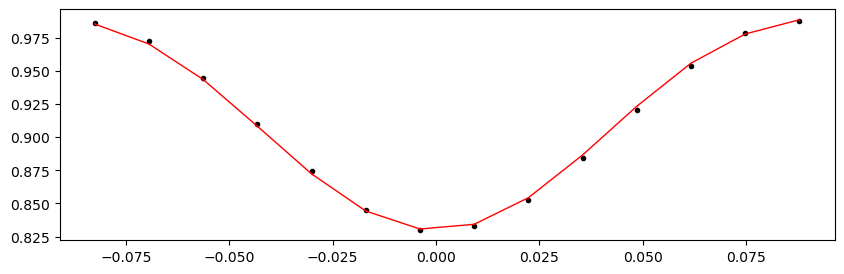

55212.1059868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.24it/s]


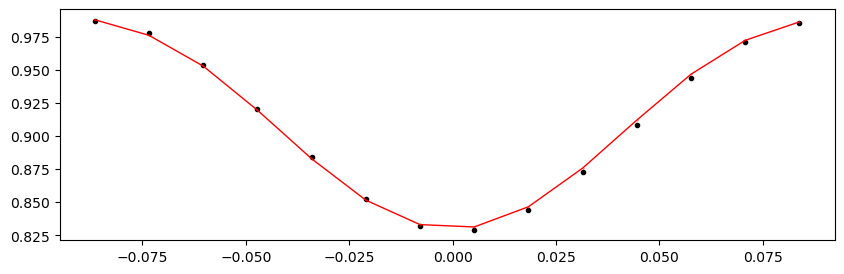

55213.6651968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.89it/s]


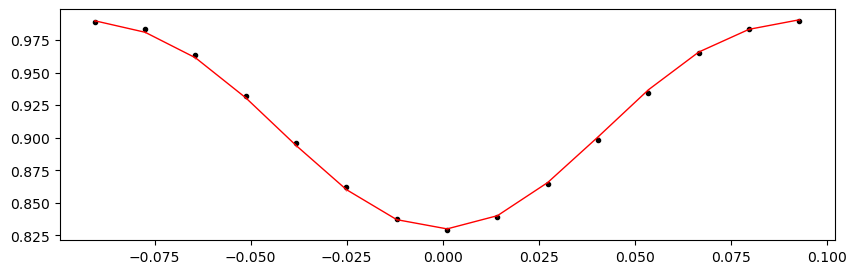

55215.2244068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.75it/s]


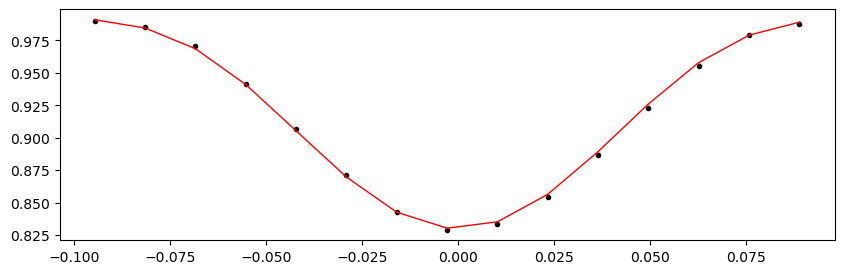

55218.342826895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.62it/s]


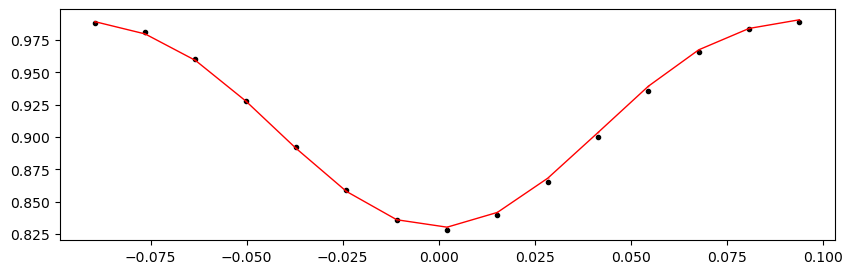

55219.902036895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.41it/s]


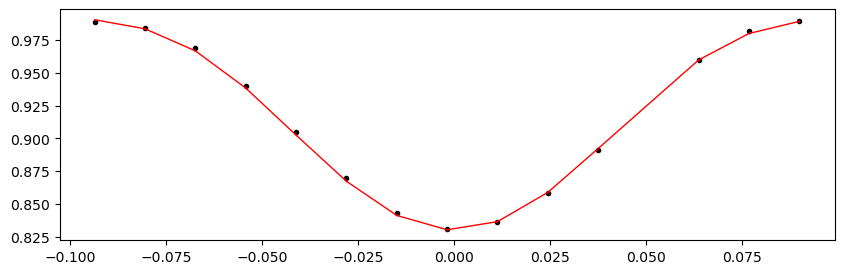

55221.461246895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.36it/s]


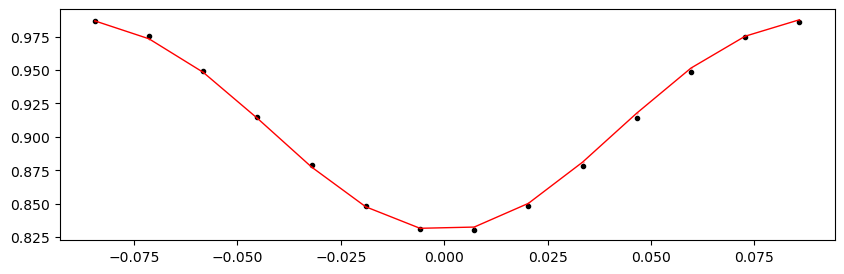

55223.0204568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.98it/s]


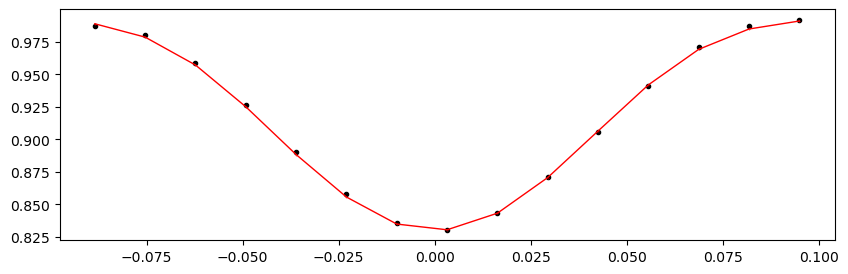

55224.5796668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1325.30it/s]


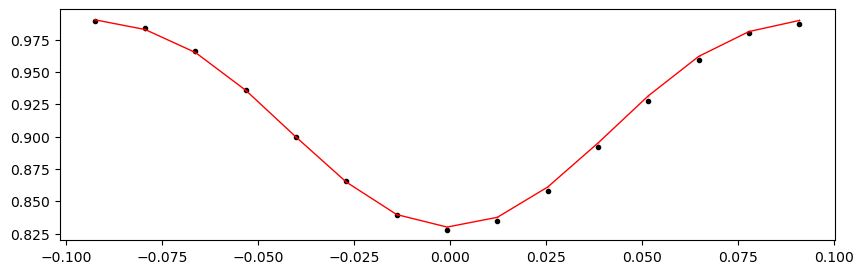

55226.1388768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.76it/s]


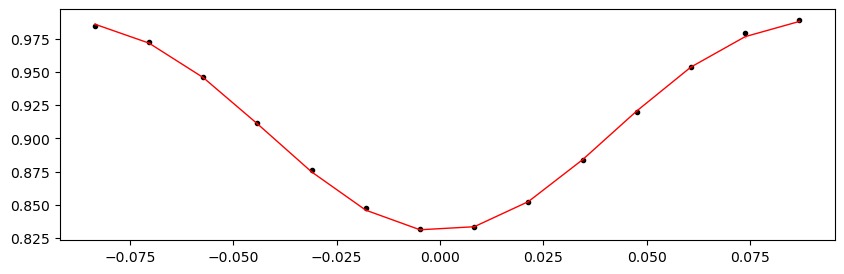

55227.6980868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.20it/s]


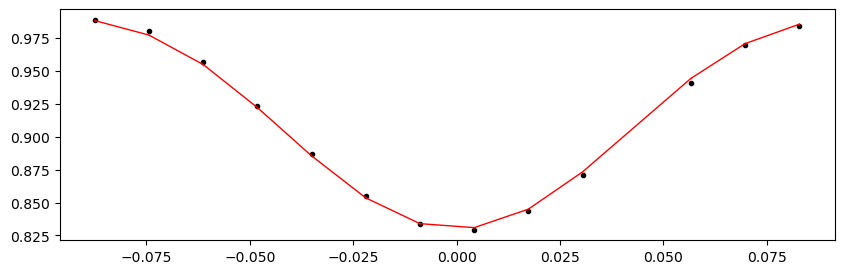

55233.9349268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.26it/s]


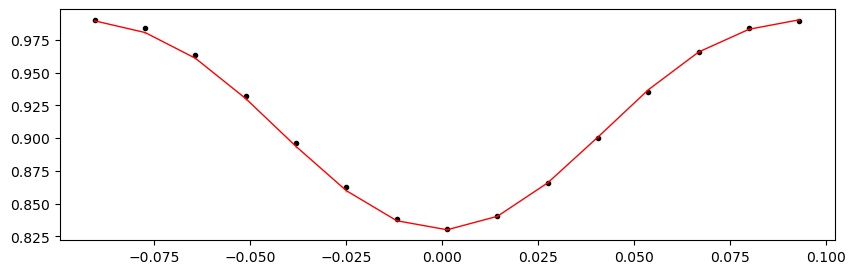

55235.4941368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1328.90it/s]


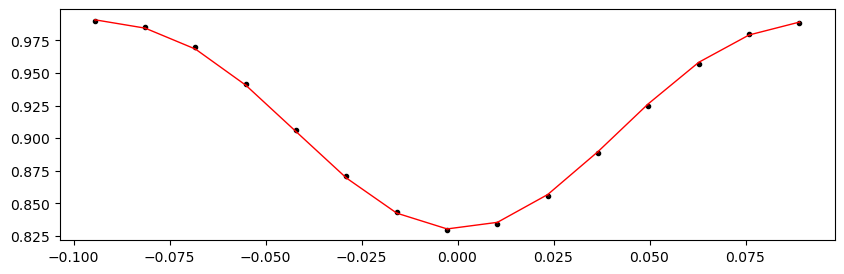

55237.0533468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.22it/s]


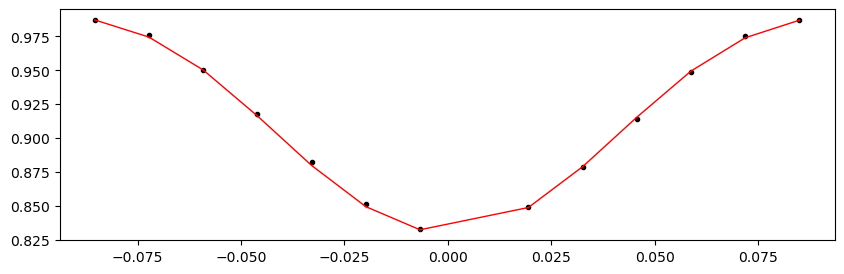

55238.612556895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.91it/s]


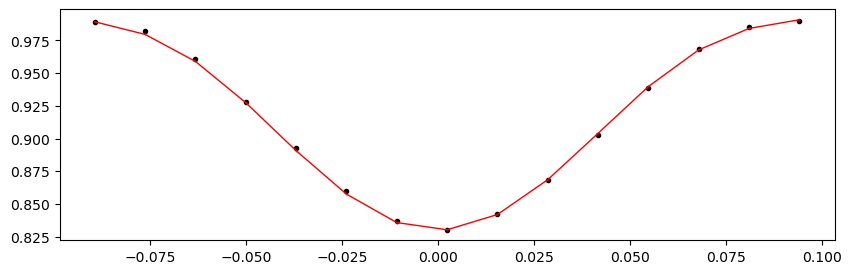

55240.171766895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.47it/s]


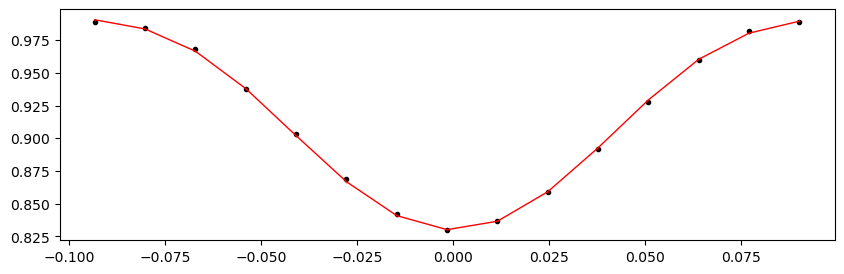

55241.730976895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.28it/s]


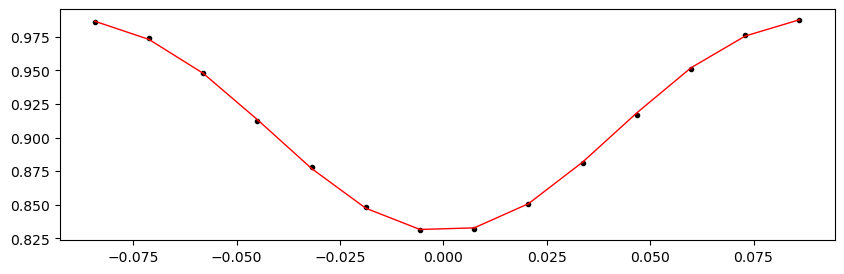

55243.2901868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.99it/s]


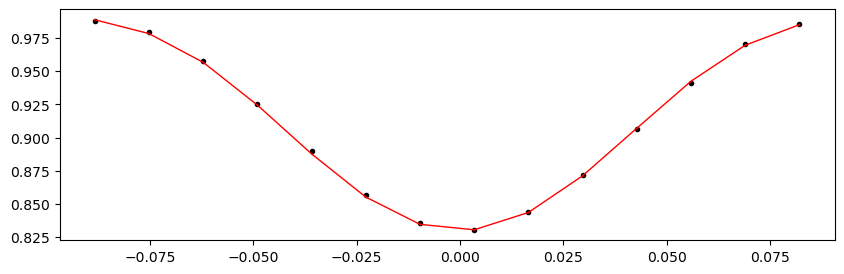

55244.8493968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.54it/s]


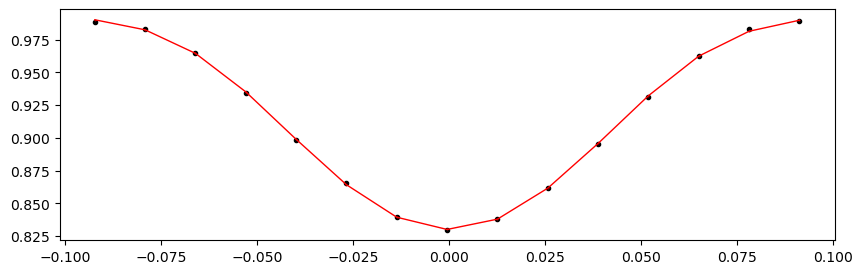

55246.4086068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.00it/s]


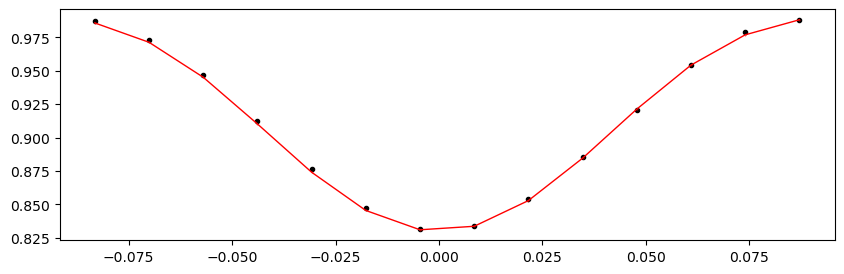

55247.9678168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.69it/s]


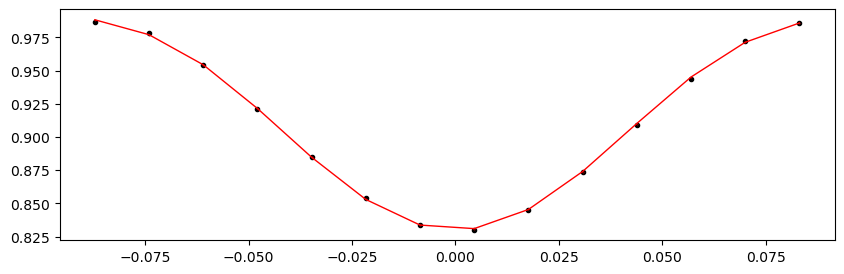

55249.5270268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.89it/s]


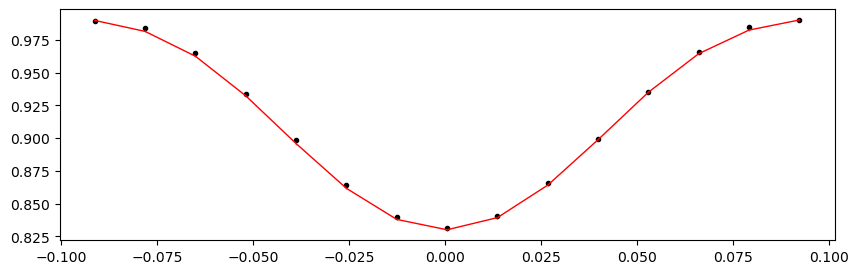

55251.0862368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.72it/s]


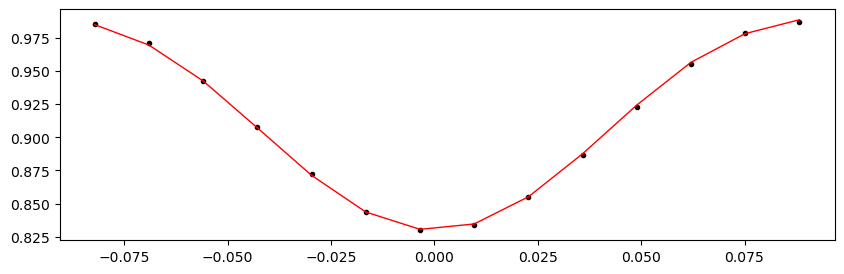

55252.6454468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.47it/s]


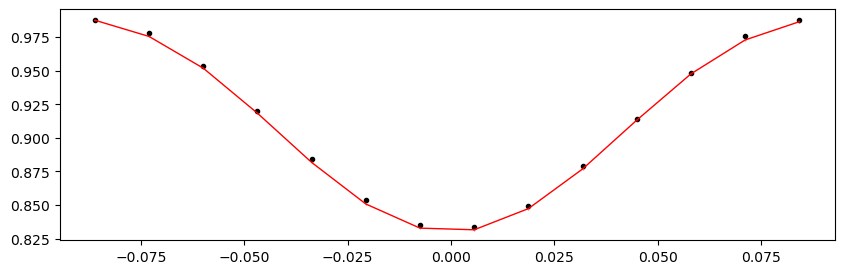

55254.2046568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.17it/s]


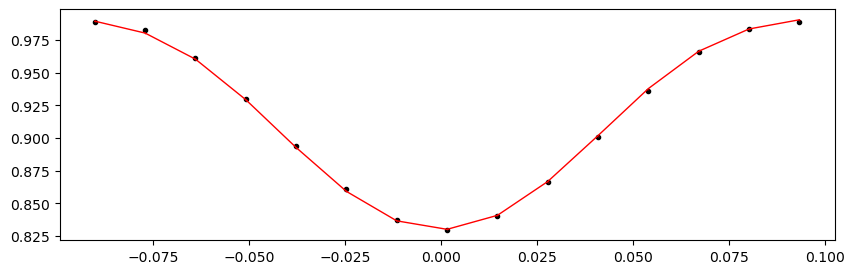

55255.7638668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1309.72it/s]


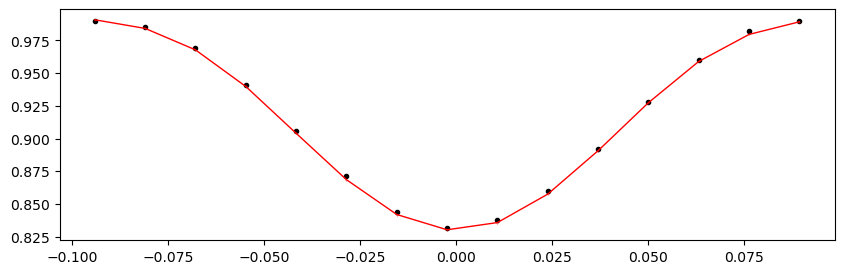

55257.3230768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.58it/s]


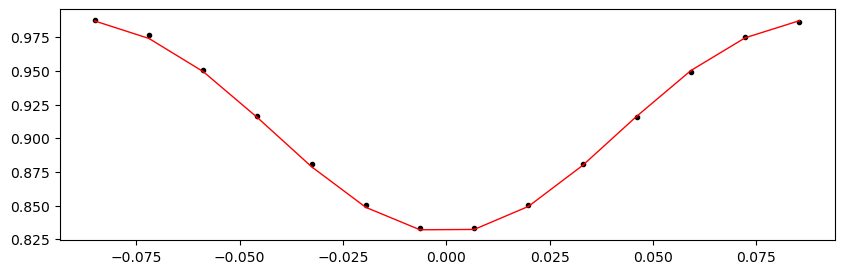

55258.882286895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.11it/s]


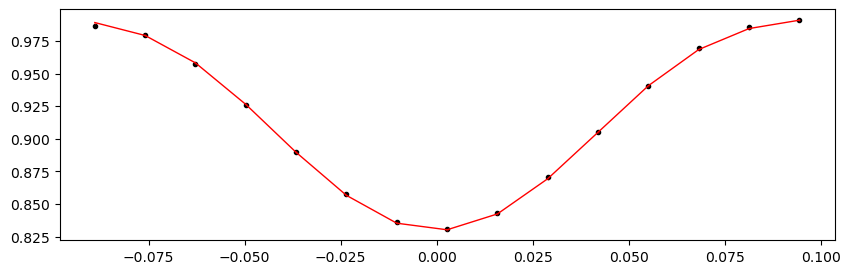

55260.441496895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.06it/s]


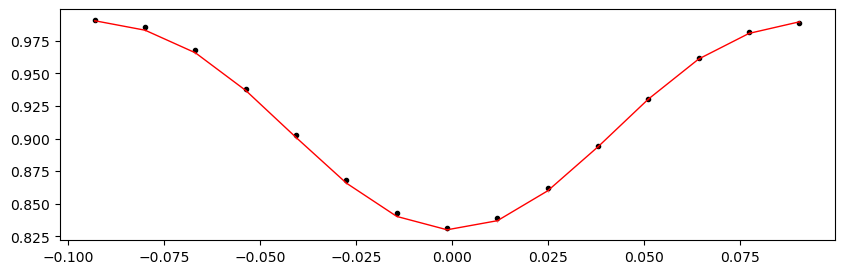

55262.000706895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.13it/s]


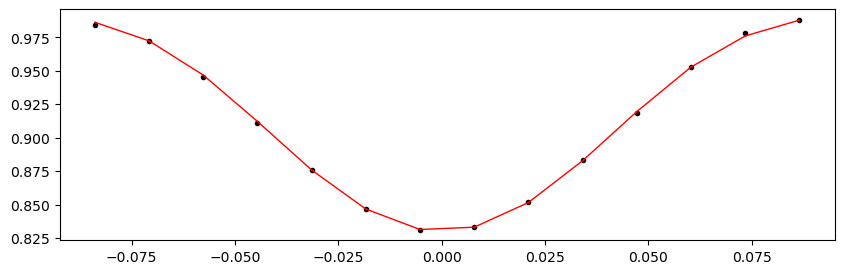

55263.5599168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.80it/s]


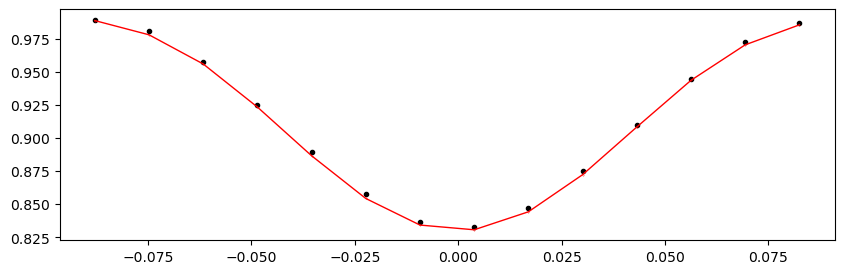

55265.1191268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.26it/s]


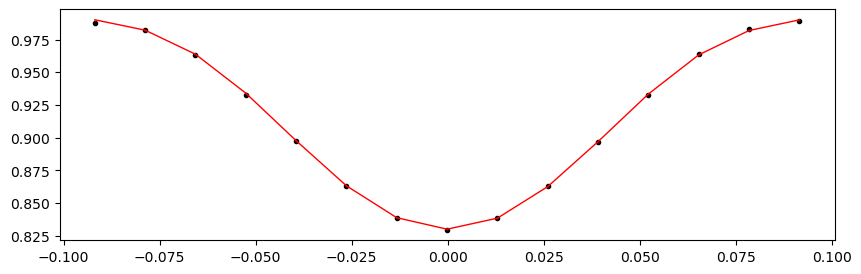

55266.6783368956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.58it/s]


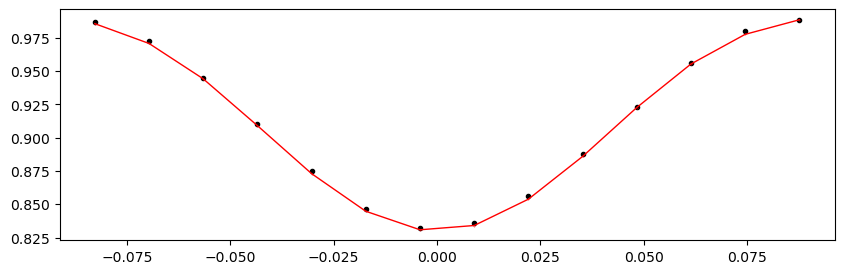

55268.2375468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.39it/s]


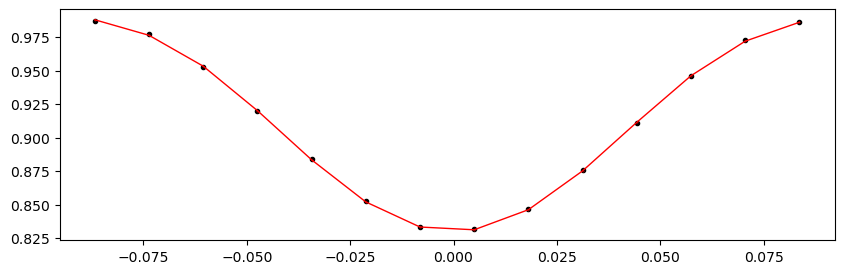

55269.7967568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.77it/s]


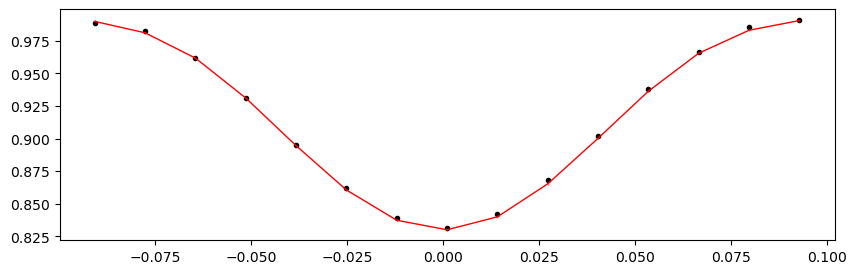

55271.3559668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1325.84it/s]


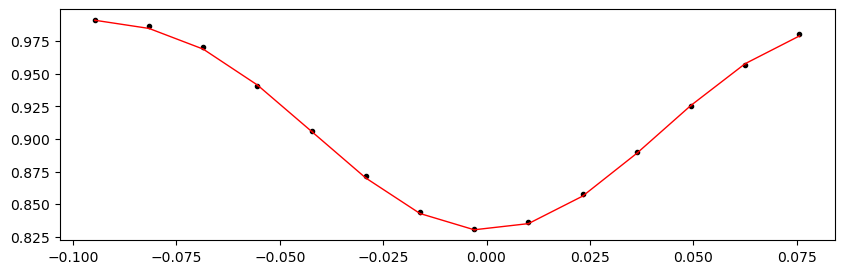

55272.9151768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1329.79it/s]


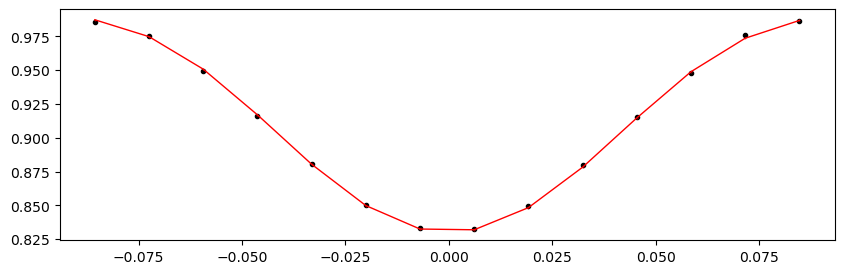

55274.4743868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.42it/s]


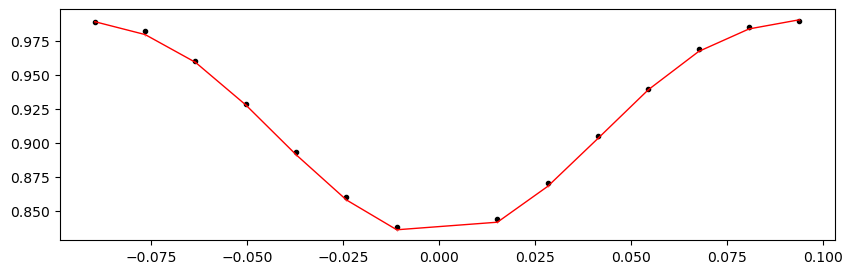

55277.5928068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.14it/s]


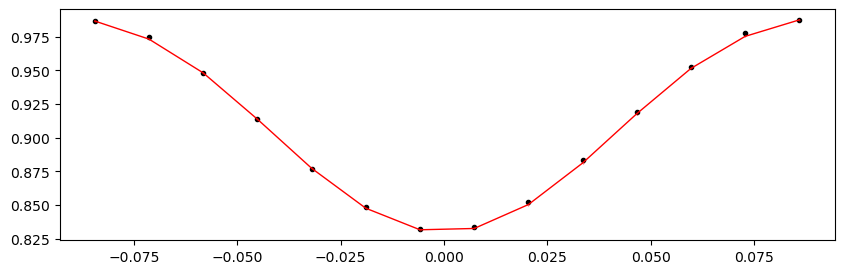

55279.152016895605 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.09it/s]


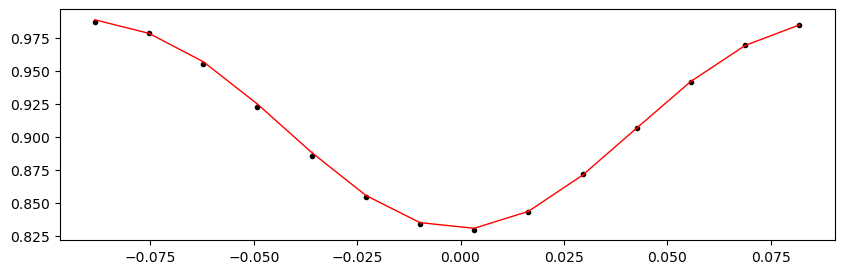

55280.711226895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.25it/s]


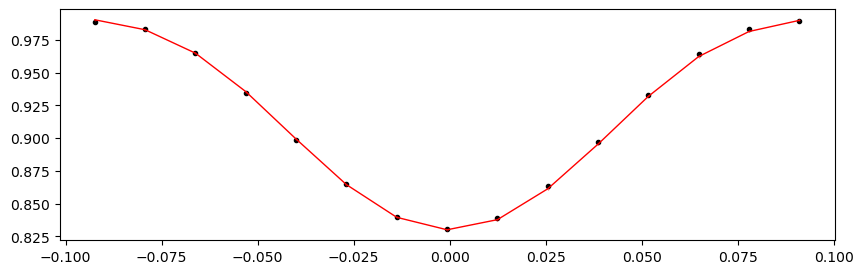

55282.270436895604 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.10it/s]


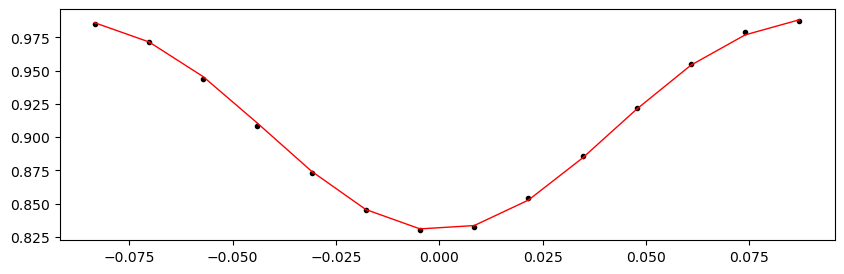

55283.8296468956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.23it/s]


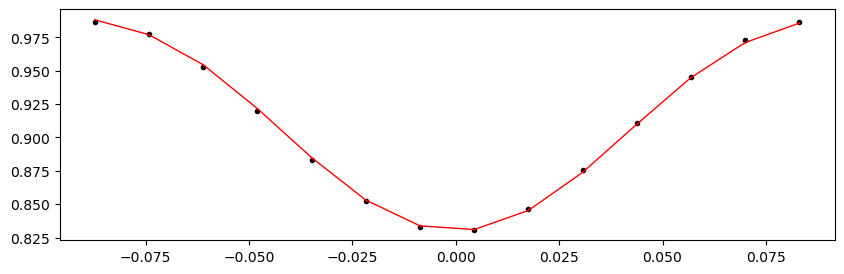

55285.3888568956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1320.16it/s]


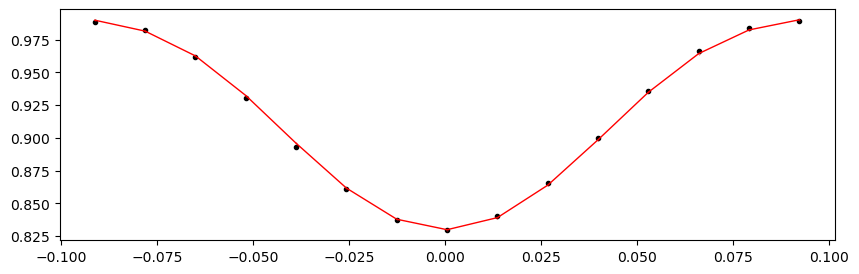

55286.9480668956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1328.92it/s]


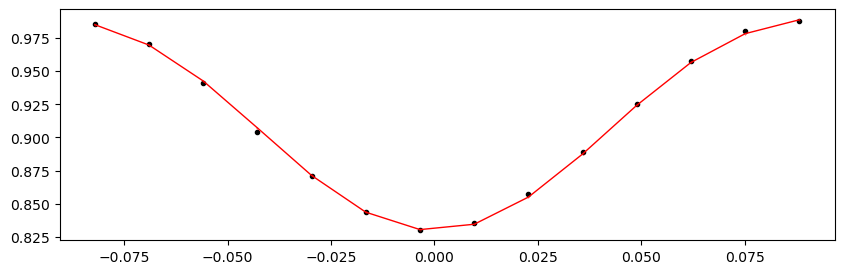

55288.5072768956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.83it/s]


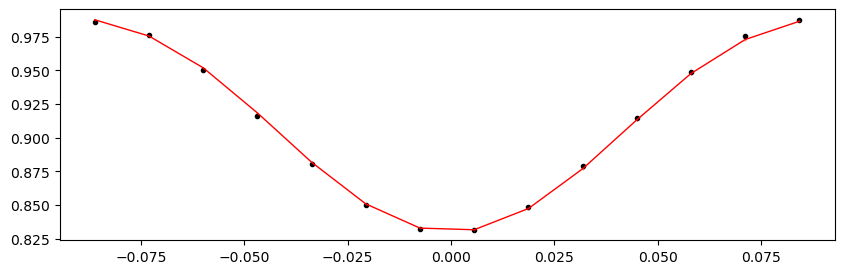

55290.0664868956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.24it/s]


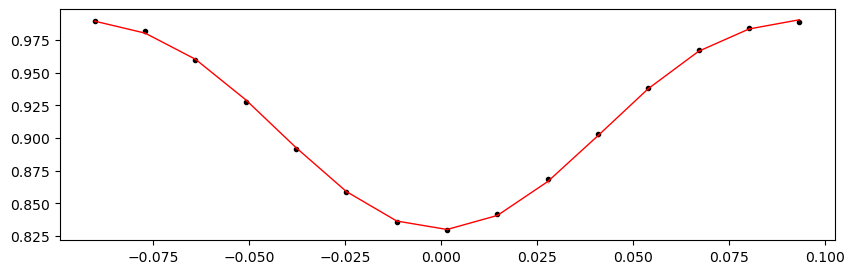

55291.6256968956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.48it/s]


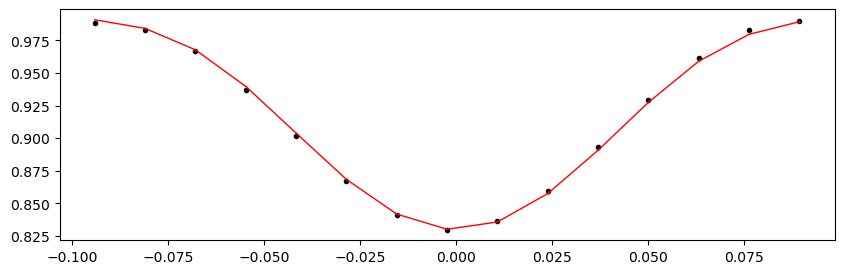

55293.1849068956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1325.35it/s]


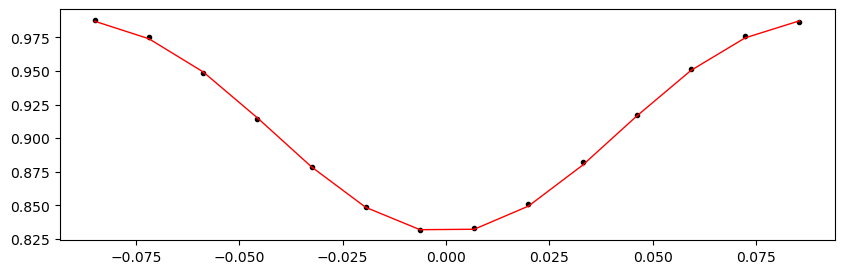

55294.7441168956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.32it/s]


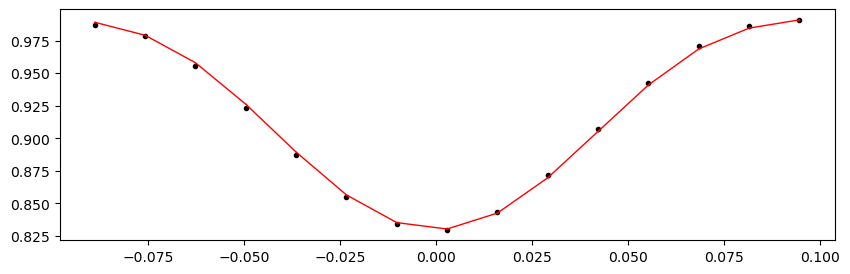

55296.3033268956 0.9926195344277585 -0.16264266399832372 0.30771509622178456


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.26it/s]


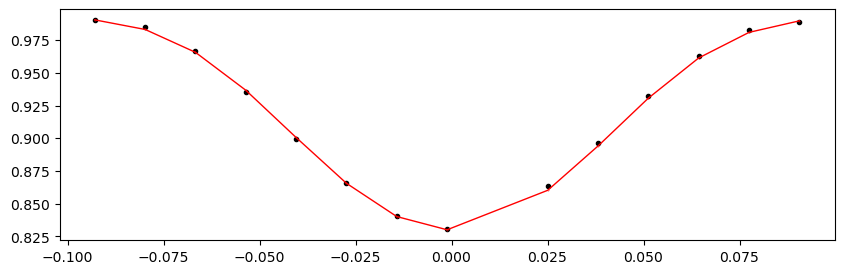

In [218]:
%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=12,  # Kepler 30-min cadene data requires a lower min_number_data
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

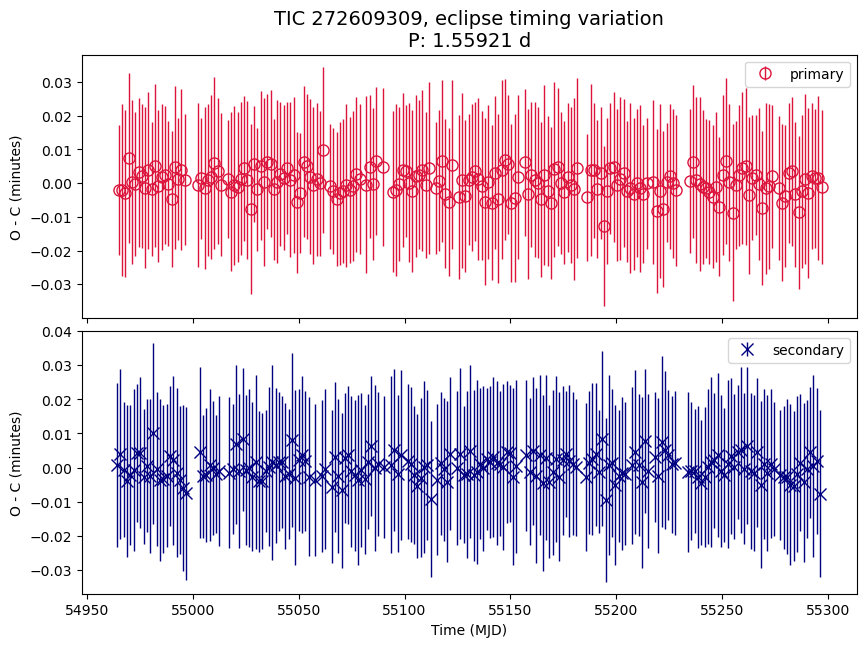

In [221]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60


# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

### O-C Plot, Zoom In

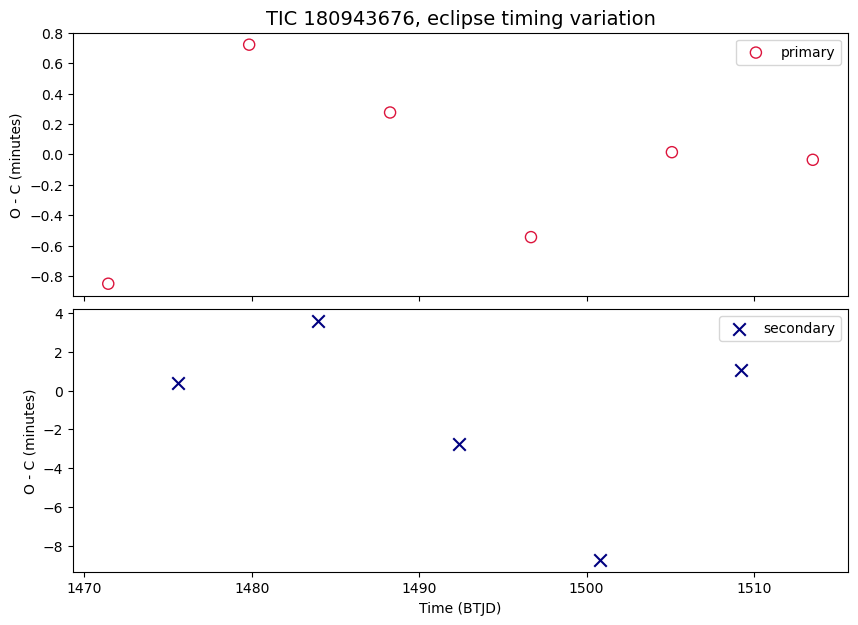

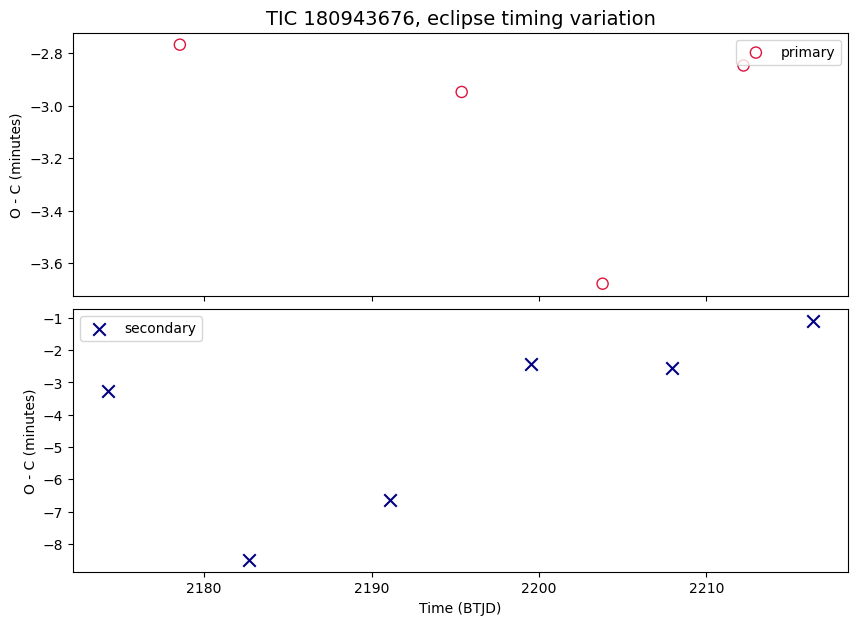

In [75]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary = in_df_primary[in_df_primary['epoch'] < 1600]

axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary = in_df_secondary[in_df_secondary['epoch'] < 1600]

    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel("Time (BTJD)")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()


#
# Second chunk
#

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary = in_df_primary[in_df_primary['epoch'] > 1600]

axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary = in_df_secondary[in_df_secondary['epoch'] > 1600]

    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel("Time (BTJD)")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()


## make a periodogram 

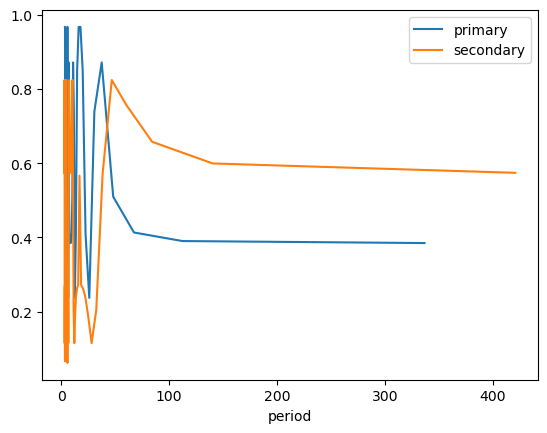

In [76]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots()

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.show()

## Results Summary

In [82]:
# FILL-IN the ETV results / comments
has_etv = "FP"  # FP, not only it has no ETV, there is no evidence that the orbital period is significantly different from SB period
comments = "FP, as ETV Period ~= SB Period. VSX entry refers to a nearby EB with similar brightness."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,180943676
has_etv,FP
comments,"FP, as ETV Period ~= SB Period. VSX entry refers to a nearby EB with similar brightness."
period,8.418147
depth_pct_p,8.28
depth_pct_s,0.39
epoch_p,1471.4196
epoch_s,1475.5596
num_sectors,4
time_span,759.29



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
180943676,FP,"FP, as ETV Period ~= SB Period. VSX entry refers to a nearby EB with similar brightness.",8.418147,8.28,0.39,1471.4196,1475.5596,4,759.29,1468.27,2227.57

